In [1]:
from gaia_tools import query
import matplotlib
#matplotlib.use("AGG")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.table import Table
import pyexcel
from astropy import units as u
from astropy.coordinates import SkyCoord

import sklearn
from sklearn import cluster
from astropy import units as u
from astropy.coordinates import SkyCoord
from matplotlib.patches import Circle
#from matplotlib import patches

from PyPDF2 import PdfFileWriter, PdfFileReader

%pylab inline

import pywt
from galpy.util import bovy_plot

import gaia_tools.load as gload
from astroquery.gaia import Gaia

from astroquery.ned import Ned
from astropy import coordinates

from scipy import stats
from matplotlib import colors, ticker, cm


Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443
Populating the interactive namespace from numpy and matplotlib


In [2]:
# csv-pd set up for DBSCANN
GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]
GlobClust_Log_radec = GlobClust_Log_ra_dec.loc[0:0,"RA":"DEC"]
GlobClust_Log_ID = GlobClust_Log_ra_dec.loc[0:0,"ID"]
GlobClust_Log_r_c = GlobClust_Log_ra_dec.loc[0:0,"r_c"]
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]
#GlobClust_Log_dec = GlobClust_Log_ra_dec.loc[:,"dec"]
#GlobClust_Log_RA = GlobClust_Log_ra_dec.loc[0:7,"RA"]
#GlobClust_Log_DEC = GlobClust_Log_ra_dec.loc[0:7,"DEC"]
#print(GlobClust_Log_r_t)

GlobClust_Log_2 = pd.read_csv('~/out_NGC 288_full_15rt_ra_dec.csv')
GlobClust_Log_pmra = GlobClust_Log_2.loc[:,"pmra"]
GlobClust_Log_pmdec = GlobClust_Log_2.loc[:,"pmdec"]
GlobClust_Log_pmra_error = GlobClust_Log_2.loc[:,"pmra_error"]
GlobClust_Log_pmdec_error = GlobClust_Log_2.loc[:,"pmdec_error"]
GlobClust_Log_ra = GlobClust_Log_2.loc[:,"ra"]
GlobClust_Log_dec = GlobClust_Log_2.loc[:,"dec"]
GlobClust_Log_ra_error = GlobClust_Log_2.loc[:,"ra_error"]
GlobClust_Log_dec_error = GlobClust_Log_2.loc[:,"dec_error"]

GlobClust_Log_g = GlobClust_Log_2.loc[:,"phot_g_mean_mag"]
GlobClust_Log_rp = GlobClust_Log_2.loc[:,"phot_rp_mean_mag"]
GlobClust_Log_bp = GlobClust_Log_2.loc[:,"phot_bp_mean_mag"]
GlobClust_Log_rpbp = GlobClust_Log_bp - GlobClust_Log_rp
GlobClust_Log_ra_out = GlobClust_Log_2.loc[:,"ra"]
GlobClust_Log_dec_out = GlobClust_Log_2.loc[:,"dec"]
GlobClust_Log_pmdec_out = GlobClust_Log_2.loc[:,"pmdec"]
GlobClust_Log_pmra_out = GlobClust_Log_2.loc[:,"pmra"]

GlobClust_Log_vpu = GlobClust_Log_2.loc[:,"visibility_periods_used"]
GlobClust_Log_aen = GlobClust_Log_2.loc[:,"astrometric_excess_noise"]

#GlobClust_Log_pmra = GlobClust_Log_pmra.as_matrix()
#GlobClust_Log_pmdec = GlobClust_Log_pmdec.as_matrix()
#GlobClust_Log_ra = GlobClust_Log_ra.as_matrix()
#GlobClust_Log_dec = GlobClust_Log_dec.as_matrix()

GlobClust_Log_parallax_out = GlobClust_Log_2.loc[:,"parallax"]
GlobClust_Log_parallaxerror_out = GlobClust_Log_2.loc[:,"parallax_error"]
GlobClust_Log_parallaxe_out = GlobClust_Log_2.loc[:,"parallax":"parallax_error"]

# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20)), /3600000
parallax_indx=((1/(GlobClust_Log_parallax_out)<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx=[not i for i in parallax_indx]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')

Clust_Edge = GlobClust_Log_r_c[0]
print(Clust_Edge)
Tidal_Edge = GlobClust_Log_r_t[0]
print(Tidal_Edge)
d_pc=8900

#M=m-5(log(d)-1)
GlobClust_Log_M = GlobClust_Log_g-5*((np.log10(d_pc)) - 1)

indx = (np.sqrt((np.fabs(GlobClust_Log_ra_out-coord_ra_dec.ra.deg)**2+np.fabs(GlobClust_Log_dec_out-coord_ra_dec.de\
c.deg)**2))<Clust_Edge/60)

GlobClust_Log_2

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

1.35
13.19270248


,Unnamed: 0,ra,dec,ra_error,dec_error,l,b,pmra,pmdec,pmra_error,pmdec_error,phot_g_mean_mag,phot_rp_mean_mag,phot_bp_mean_mag,parallax,parallax_error,a_g_val,visibility_periods_used,astrometric_excess_noise
0,0,13.325432,-26.545833,0.331644,0.237084,158.559035,-89.284410,4.194062,-5.560228,0.574645,0.443512,19.4395,18.8721,19.5355,0.220473,0.452169,NaN,14,0.000000
1,1,13.216021,-24.853873,0.432092,0.351204,131.031316,-87.703160,-0.330350,-3.468581,0.823164,0.664431,19.9567,18.8183,20.9157,1.315476,0.633346,NaN,14,1.226143
2,2,10.978007,-24.156311,2.645801,1.611511,92.804991,-86.578262,NaN,NaN,NaN,NaN,20.8426,19.7541,21.5386,NaN,NaN,NaN,8,2.341806
3,3,10.937143,-29.287150,1.050683,0.693727,340.602226,-87.255928,42.139770,18.245363,1.694499,1.299002,20.5741,19.1477,20.9284,5.104771,1.388325,NaN,12,4.064091
4,4,12.276909,-25.781061,0.537746,0.436475,101.637459,-88.555379,-1.064531,-0.516065,1.150878,0.863598,20.2779,19.9292,20.3378,0.237608,0.614988,NaN,14,0.000000
5,5,12.092129,-28.699341,0.478994,0.370067,326.097939,-88.288844,5.069834,-0.410721,1.038293,0.662812,20.0819,19.4527,20.3273,-0.520283,0.665516,NaN,12,0.000000
6,6,11.635107,-28.750855,0.066094,0.049423,336.335199,-88.049952,2.974431,1.151691,0.118747,0.088762,16.7164,16.2474,17.0175,0.373838,0.089348,0.0170,13,0.000000
7,7,15.189868,-25.116791,4.094024,1.847164,169.579706,-87.097759,NaN,NaN,NaN,NaN,20.5616,18.6726,20.2897,NaN,NaN,NaN,9,11.987707
8,8,14.134471,-28.189705,0.869072,1.388731,256.452653,-88.450190,-5.359363,4.598085,2.109812,2.273184,20.7963,19.6628,21.4165,1.294907,1.963326,NaN,10,0.000000
9,9,10.187083,-25.802942,10.822460,18.967922,61.316960,-87.265213,NaN,NaN,NaN,NaN,21.2989,NaN,NaN,NaN,NaN,NaN,5,0.000000


In [3]:
data = np.loadtxt('n288_gaia.dat')
shape(data)

data_pd = pd.DataFrame({'id': data[:,0], 'x': data[:,1], 'y': data[:,2], 'z': data[:,3],
                       'vx': data[:,4], 'vy': data[:,5], 'vy': data[:,6], 
                       'ra': data[:,7], 'dec':data[:,8], 'pmra': data[:,9], 'pmdec': data[:,10]})

ra_n = data_pd.loc[:,"ra"]
#print(ra_n)
dec_n = data_pd.loc[:,"dec"]
#print(dec_n)
pmra_n = data_pd.loc[:,"pmra"]
#print(pmra_n)
pmdec_n = data_pd.loc[:,"pmdec"]
#print(pmdec_n)

core_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_c[0]/60)

#ra_s = ra_n[core_indx].mean() - coord_ra_dec.ra.deg
#dec_s = dec_n[core_indx].mean() - coord_ra_dec.dec.deg

ra_s=0.85
dec_s=0.1

tidal_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) <= GlobClust_Log_r_t[0]/60)

tidal_indx_15 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) <= GlobClust_Log_r_t[0]/60*15)


pmra_n_norm = pmra_n-pmra_n[core_indx].mean()
pmdec_n_norm = pmdec_n-pmdec_n[core_indx].mean()

tidal_indx2 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) <= GlobClust_Log_r_t[0]/60*15) *\
    (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) > GlobClust_Log_r_t[0]/60)
print(ra_s, dec_s)

0.85 0.1


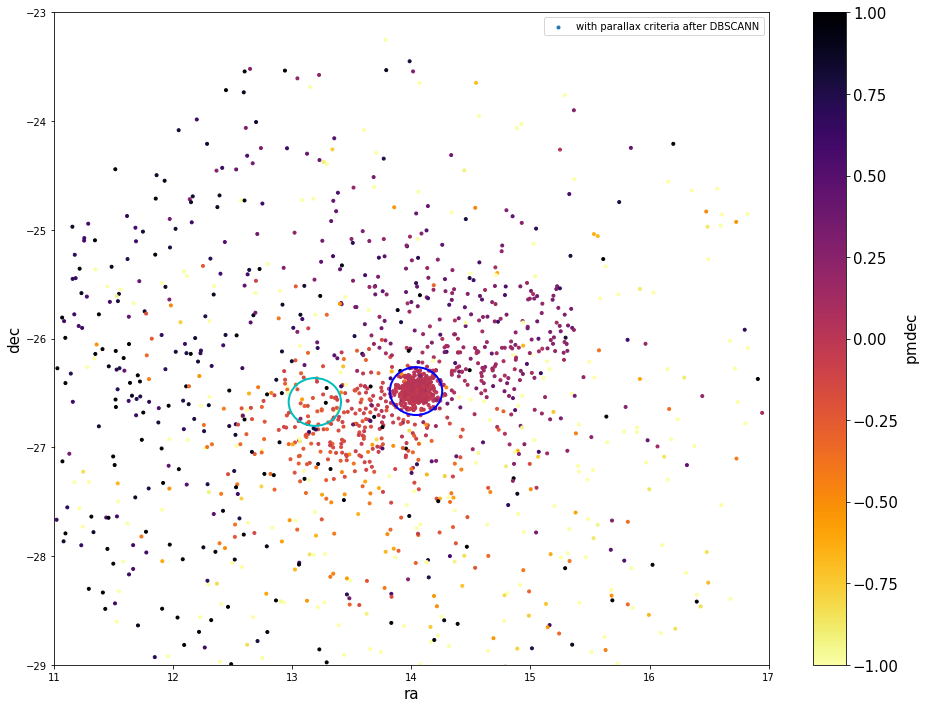

In [4]:
fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
sc=plt.scatter(ra_n[tidal_indx_15], dec_n[tidal_indx_15], c=pmdec_n_norm[tidal_indx_15], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+ra_s, coord_ra_dec.dec.deg+dec_s), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar(sc)
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

(3984, 4)
[0 0 0 ... 0 0 0]
(3984,)
Estimated number of Subgroups: 3


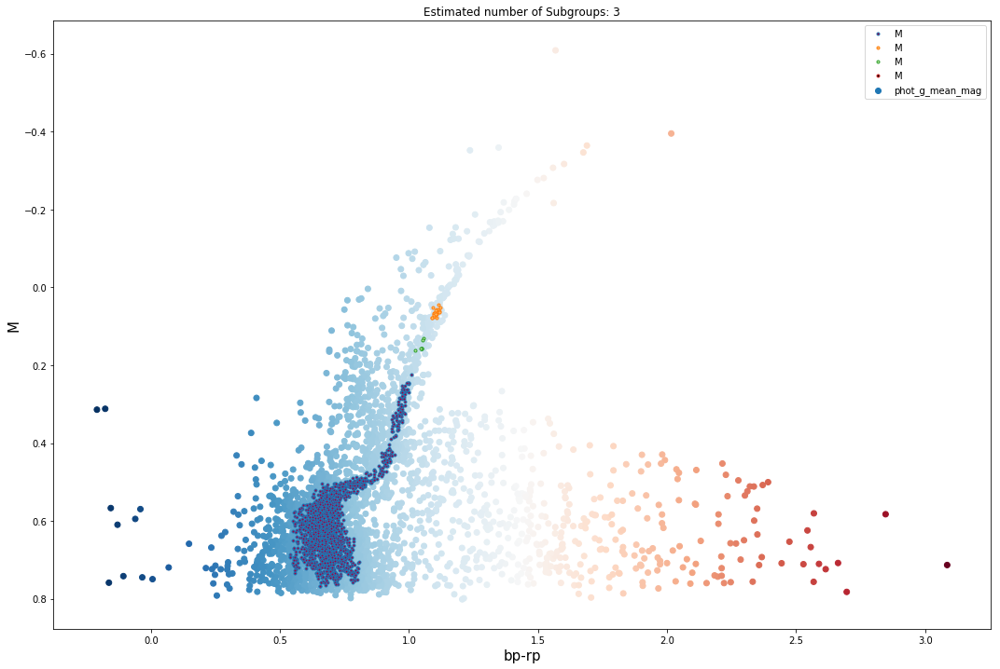

(1704, 1)

 pmra    4.318667
dtype: float64 


 pmdec   -5.691233
dtype: float64


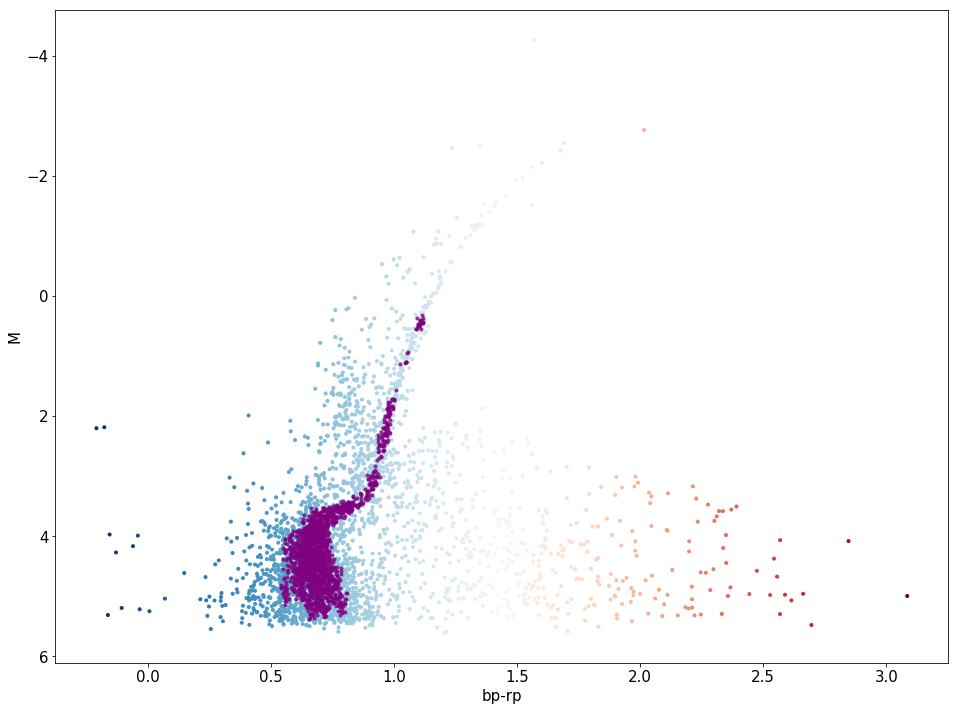

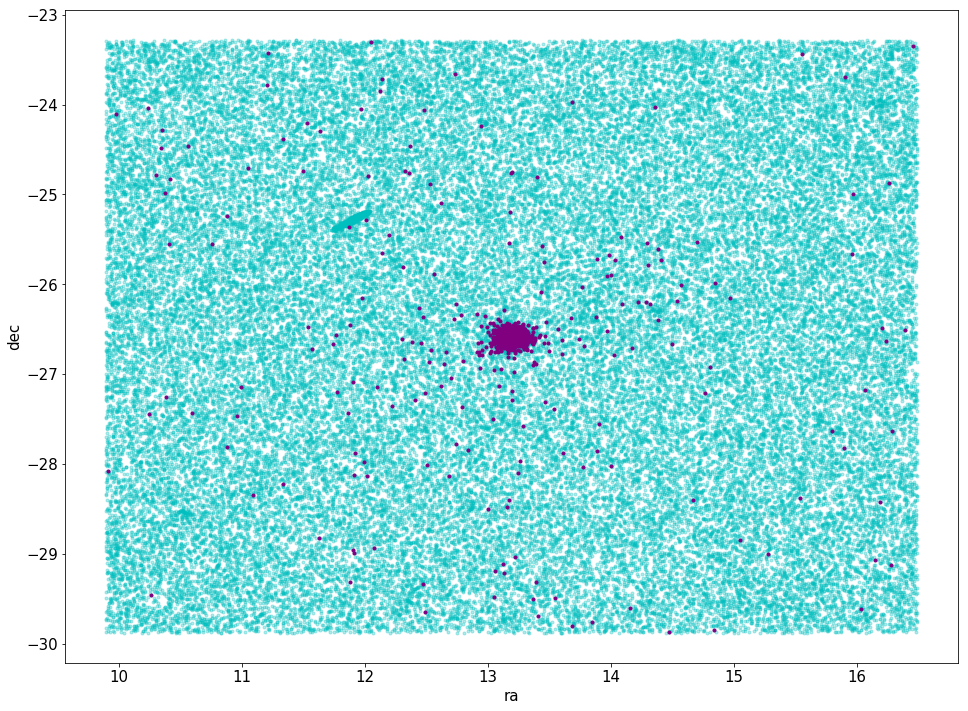

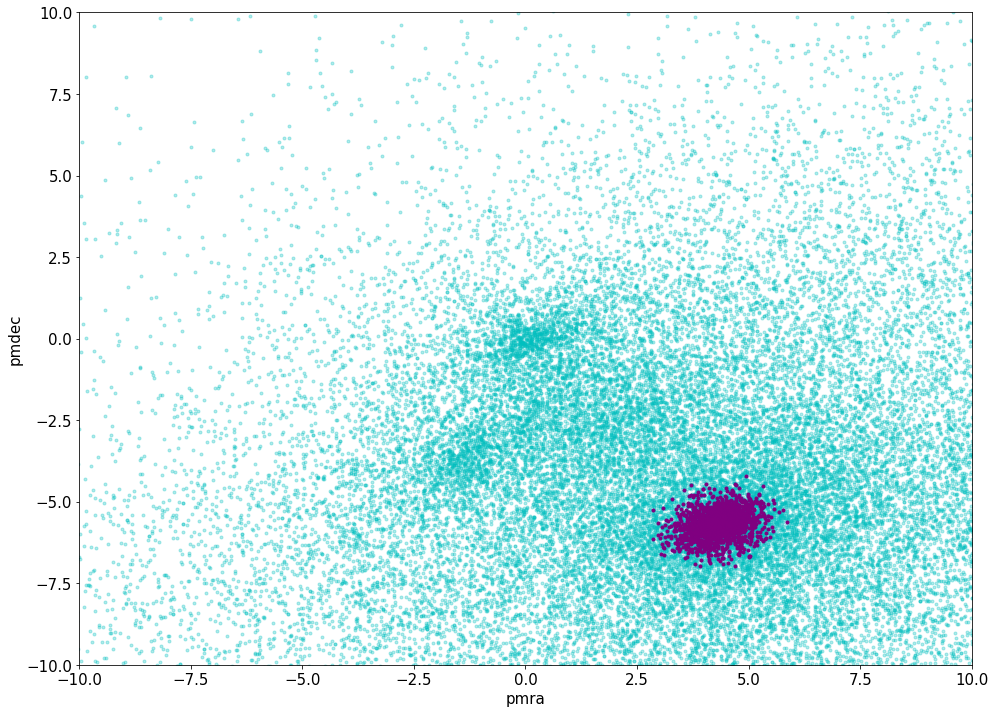

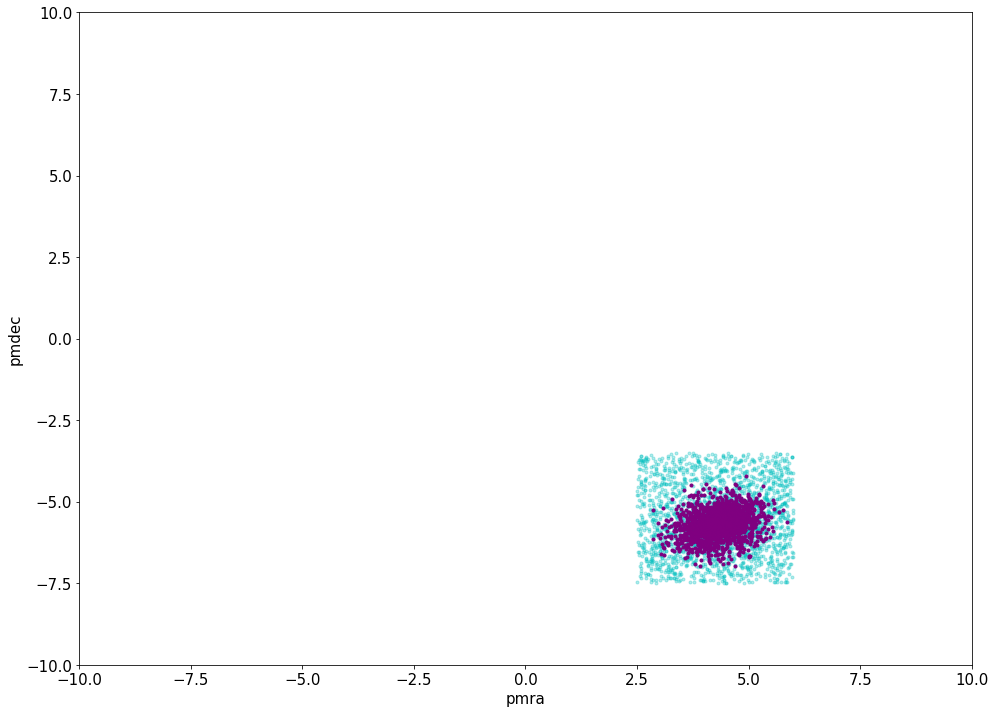

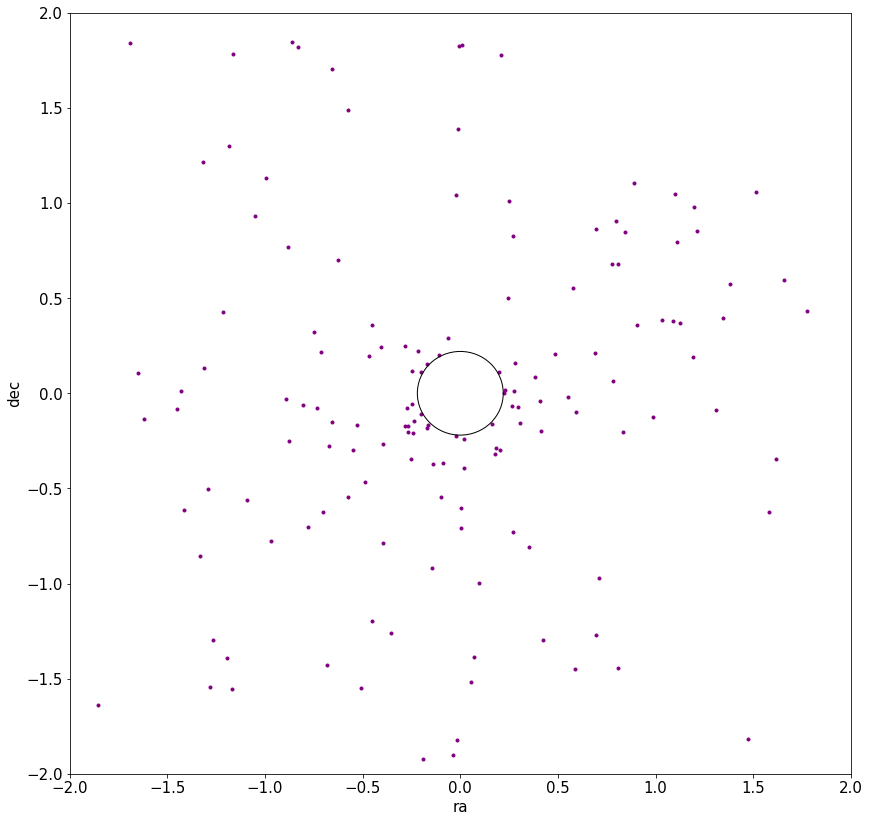

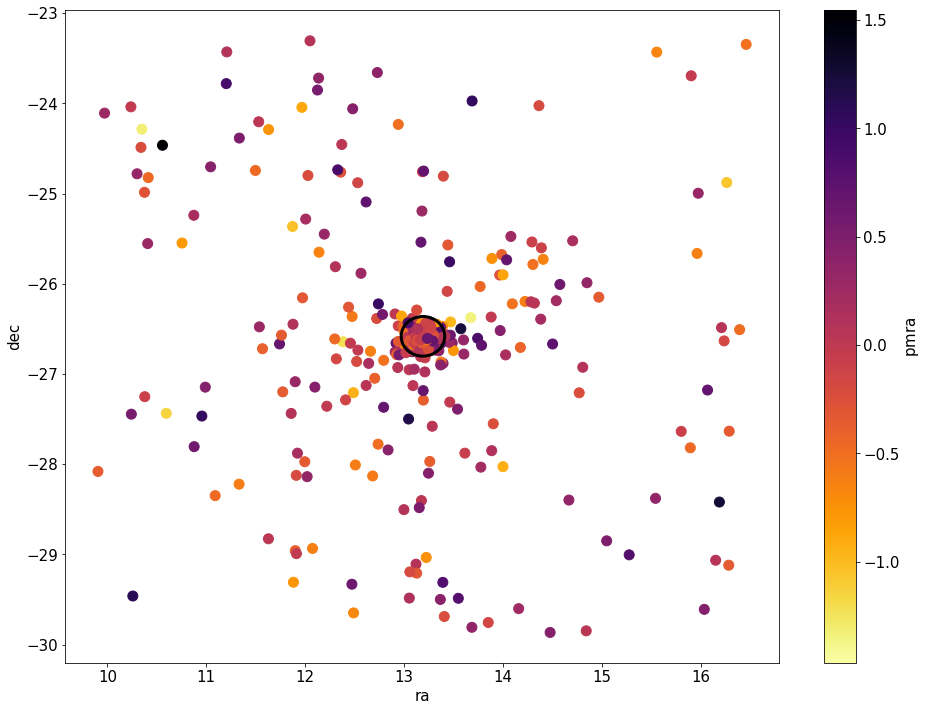

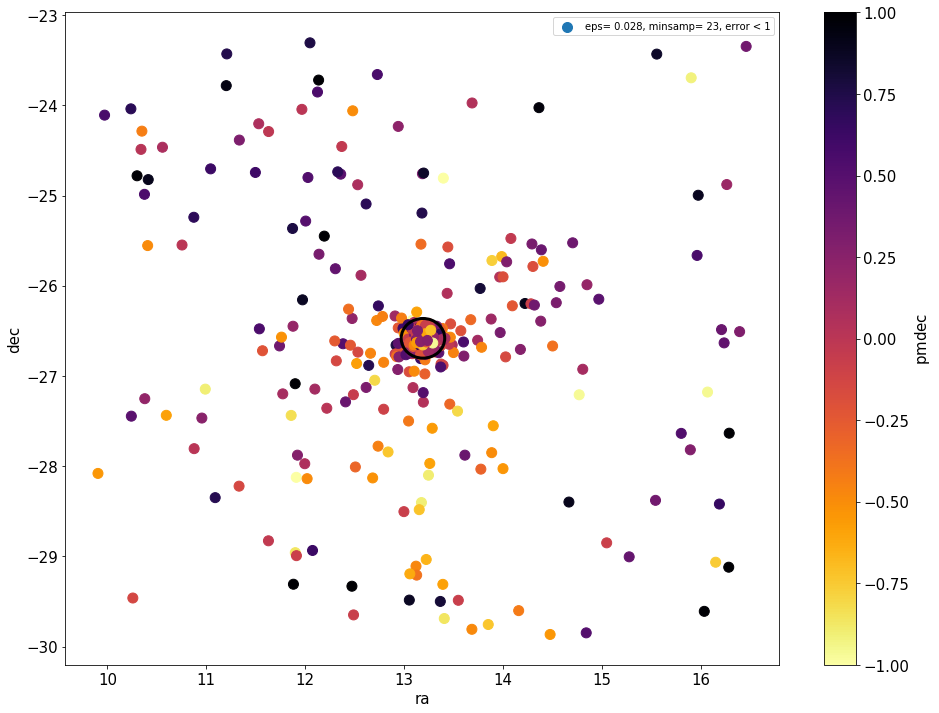

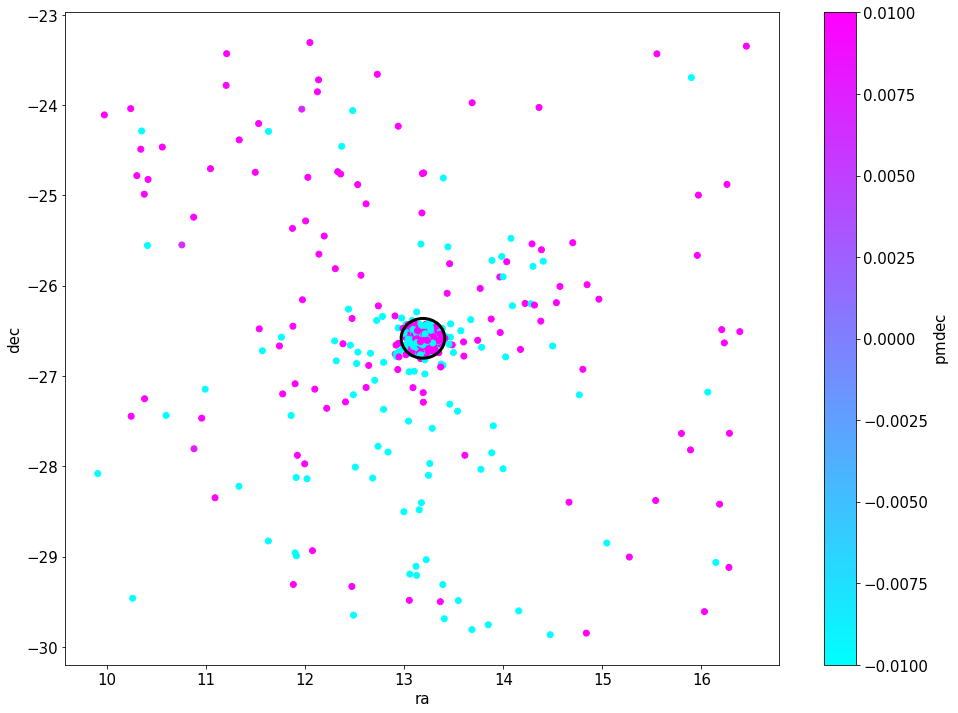

1704 1704
(1704,)
(223, 1)
(223, 1)
[0.    0.006 0.012 0.018 0.024 0.03  0.036 0.042 0.048 0.054 0.06  0.066
 0.072 0.078 0.084 0.09  0.096]
(1704, 1)
/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:495: RuntimeWarning: invalid value encountered in log10

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:496: RuntimeWarning: invalid value encountered in log10

(223,)


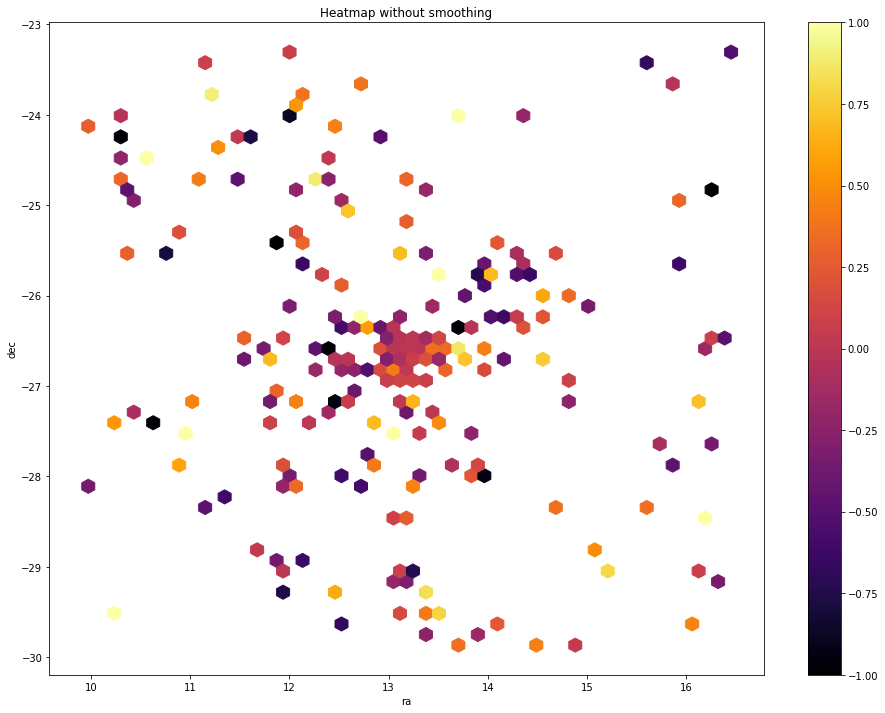

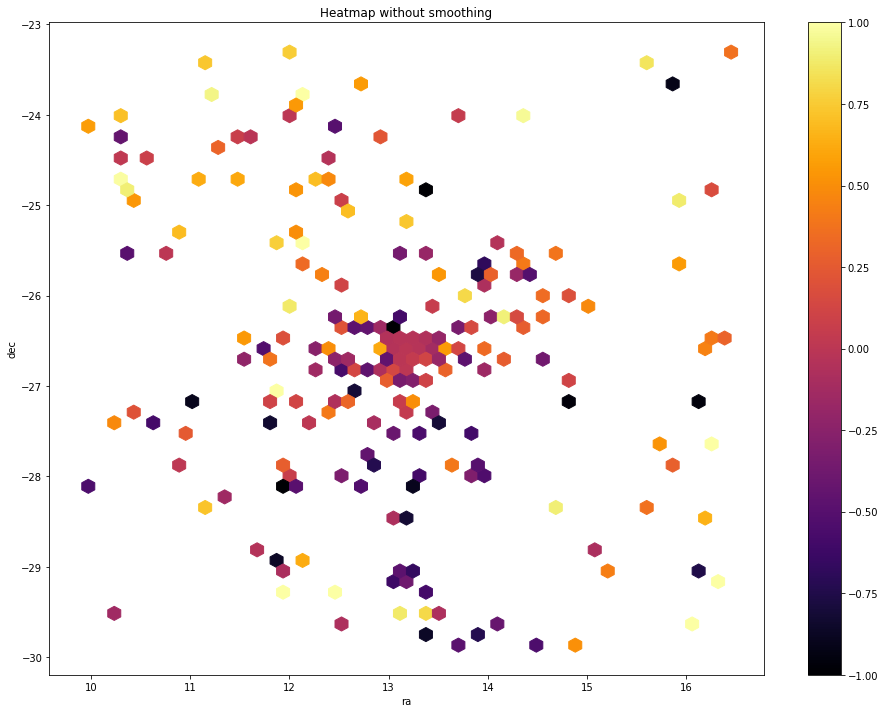

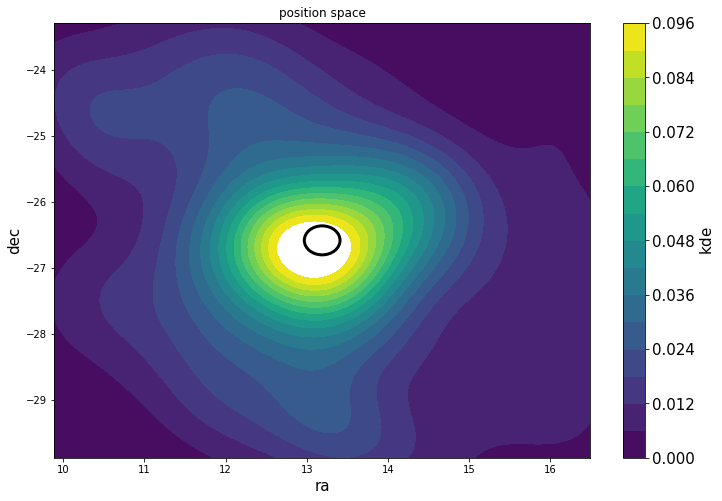

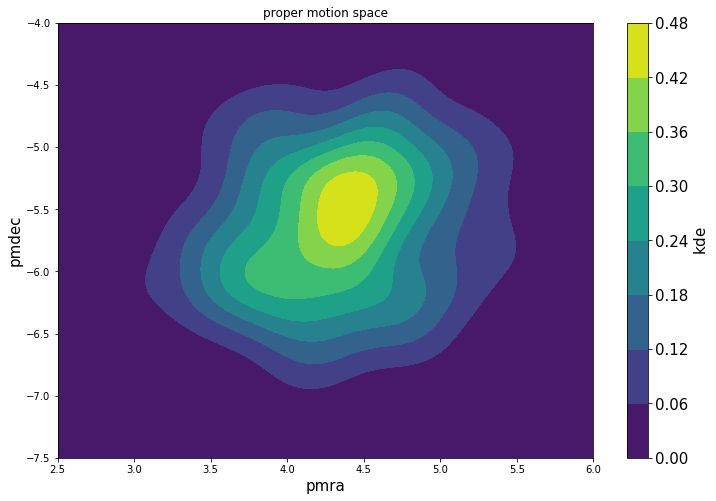

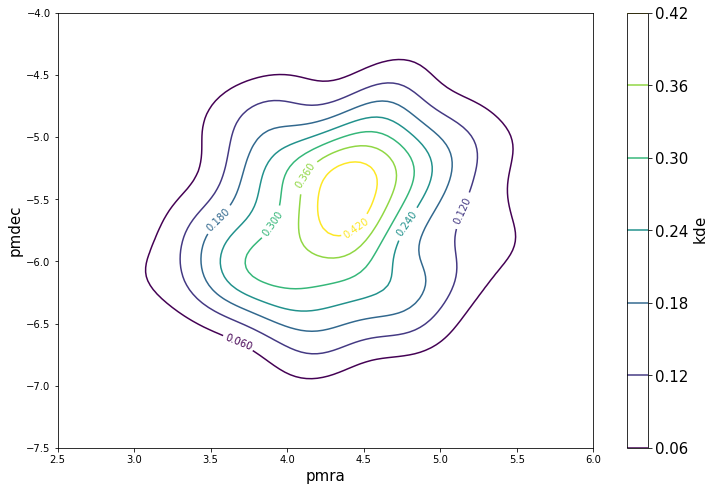

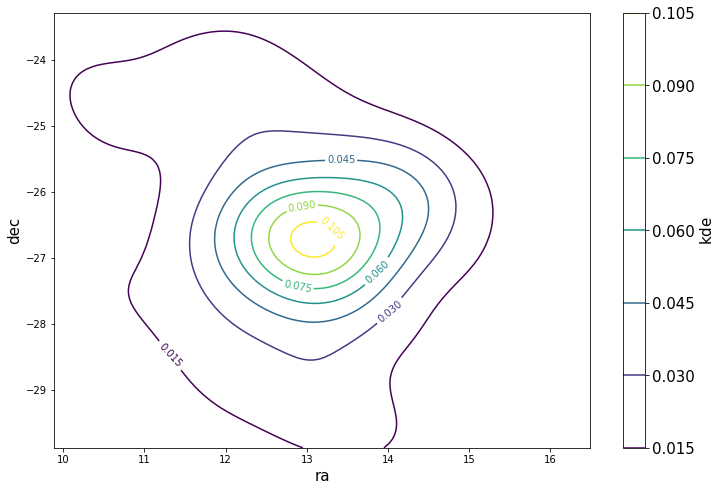

In [66]:
# DBSCAN
DB_Params =[]
DB_Params=np.transpose(DB_Params)

clust_edge2 = (np.sqrt((np.fabs(GlobClust_Log_ra_out[parallax_indx].as_matrix()-coord_ra_dec.ra.deg)**2+
                        np.fabs(GlobClust_Log_dec_out[parallax_indx].as_matrix()-coord_ra_dec.dec.deg)**2))
              >Tidal_Edge/60)

pm_indx=(GlobClust_Log_pmra_error[parallax_indx] < 1) * (GlobClust_Log_pmdec_error[parallax_indx] < 1) *\
        (GlobClust_Log_vpu[parallax_indx] > 8) * (GlobClust_Log_aen[parallax_indx] == 0) *\
        (GlobClust_Log_pmra[parallax_indx] > 2.5) * (GlobClust_Log_pmra[parallax_indx] < 6) *\
        (GlobClust_Log_pmdec[parallax_indx] > -7.5) * (GlobClust_Log_pmdec[parallax_indx] < -3.5) #*\
        #(GlobClust_Log_M[parallax_indx] < 4.5)
        
#plt.gca().set_ylim([-7.5, -4.5])
#plt.gca().set_xlim([2.5,6])

eps = 0.028
minsamp = 23

DF={'M': GlobClust_Log_M[parallax_indx][pm_indx]/7, 
    'rpbp': GlobClust_Log_rpbp[parallax_indx][pm_indx], 
    'pmra': GlobClust_Log_pmra[parallax_indx][pm_indx]/50, 'pmdec': GlobClust_Log_pmdec[parallax_indx][pm_indx]/50}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

# 5% - possibly best
#db=sklearn.cluster.DBSCAN(eps=0.0285, min_samples=19, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 5%
#db=sklearn.cluster.DBSCAN(eps=0.0295, min_samples=21, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 10% - very few
#db=sklearn.cluster.DBSCAN(eps=0.0295, min_samples=21, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 10% - fewer
#db=sklearn.cluster.DBSCAN(eps=0.027, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 10% - possibly best
#db=sklearn.cluster.DBSCAN(eps=0.03, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 10% - 
#db=sklearn.cluster.DBSCAN(eps=0.031, min_samples=13, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 15%
#db=sklearn.cluster.DBSCAN(eps=0.028, min_samples=13, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 20% - very few
#db=sklearn.cluster.DBSCAN(eps=0.024, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 20%
#db=sklearn.cluster.DBSCAN(eps=0.028, min_samples=18, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

#20%  - THIS ONE 
#db=sklearn.cluster.DBSCAN(eps=0.026, min_samples=19, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

#20%  - THIS ONE 
db=sklearn.cluster.DBSCAN(eps=eps, min_samples=minsamp, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 25% - fewer
#db=sklearn.cluster.DBSCAN(eps=0.026, min_samples=24, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

# 25% - more
#db=sklearn.cluster.DBSCAN(eps=0.029, min_samples=19, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625


#db=sklearn.cluster.DBSCAN(eps=0.03, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

#db=sklearn.cluster.DBSCAN(eps=0.026, min_samples=24, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625
#db=sklearn.cluster.DBSCAN(eps=0.027, min_samples=20, metric='euclidean', metric_params=None, algorithm='auto', 
#                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(18,12))
plt.scatter(GlobClust_Log_rpbp[parallax_indx][pm_indx]/1, GlobClust_Log_M[parallax_indx][pm_indx]/7, c=GlobClust_Log_rpbp[parallax_indx][pm_indx]/1, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], '.', markerfacecolor=tuple(col),)
     #       )#markeredgecolor='k')#, markersize=14)
    
    x_param3.append(xy.loc[:, "rpbp"])
    #y_param3=x_param3
    y_param3.append(xy.loc[:, "M"]*7)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)

plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
#x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
#y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})
GC_pmra_error = pd.DataFrame({'pmra_error':GlobClust_Log_pmra_error})
GC_pmdec_error = pd.DataFrame({'pmdec_error':GlobClust_Log_pmdec_error})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)
pmra_DB_error = GC_pmra_error.reindex(x_out3.index)
pmdec_DB_error = GC_pmdec_error.reindex(y_out3.index)
M_DB = GlobClust_Log_M.reindex(y_out3.index)
rpbp_DB = GlobClust_Log_rpbp.reindex(y_out3.index)

pmra_DB_norm = (pmra_DB-pmra_DB.mean())#/(pmra_DB.mean())
pmdec_DB_norm = (pmdec_DB-pmdec_DB.mean())#/(pmdec_DB.mean())

print('\n', pmra_DB.mean(), '\n')
print('\n', pmdec_DB.mean())


fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp[parallax_indx][pm_indx], y=GlobClust_Log_M[parallax_indx][pm_indx], c=GlobClust_Log_rpbp[parallax_indx][pm_indx], cmap='RdBu_r', marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='purple', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_ra_out[parallax_indx], y=GlobClust_Log_dec_out[parallax_indx], c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
#plt.hexbin(GlobClust_Log_pmdec_out, GlobClust_Log_pmra_out, extent=[-10,10, -10,10], bins='log',gridsize=200)
plt.scatter(x=GlobClust_Log_pmra_out[parallax_indx], y=GlobClust_Log_pmdec_out[parallax_indx], c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(y=pmdec_DB, x=pmra_DB, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
#plt.gca().set_ylim([-7.5, -4.5])
#plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-10,10])
plt.gca().set_xlim([-10,10])
#plt.gca().set_ylim([3.2, 4.7])
#plt.gca().set_xlim([-7.5,-3])
plt.show()

fig=plt.figure(figsize=(16,12))
#plt.hexbin(GlobClust_Log_pmdec_out, GlobClust_Log_pmra_out, extent=[-10,10, -10,10], bins='log',gridsize=200)
plt.scatter(x=GlobClust_Log_pmra_out[parallax_indx][pm_indx] , y=GlobClust_Log_pmdec_out[parallax_indx][pm_indx], c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(y=pmdec_DB, x=pmra_DB, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
#plt.gca().set_ylim([-7.5, -4.5])
#plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-10,10])
plt.gca().set_xlim([-10,10])
#plt.gca().set_ylim([3.2, 4.7])
#plt.gca().set_xlim([-7.5,-3])
plt.show()

clust_indx = (np.sqrt((np.fabs(ra_DB.as_matrix()-coord_ra_dec.ra.deg)**2+np.fabs(dec_DB.as_matrix()-coord_ra_dec.dec.deg)**2))
              >Tidal_Edge/60)

#(np.sqrt(np.fabs((ra_DB-coord_ra_dec.ra.deg)**2+(dec_DB-coord_ra_dec.dec.deg)**2))<Clust_Edge/60)


fig=plt.figure(figsize=(14,14))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_pmra_out, y=GlobClust_Log_pmdec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB[clust_indx]-coord_ra_dec.ra.deg, y=dec_DB[clust_indx]-coord_ra_dec.dec.deg, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
circle = plt.Circle((0,0), GlobClust_Log_r_t/60*4, color='b', fill=False, lw=2)
#ax.add_artist(circle)
circle2 = plt.Circle((0,0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=1)
ax.add_artist(circle2)
circle3 = plt.Circle((0,0), 5/60, color='pink', fill=False, lw=2)
#ax.add_artist(circle3)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().set_ylim([-2, 2])
plt.gca().set_xlim([-2,2])
plt.gca().tick_params(labelsize=15)
plt.show()


fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c=pmra_DB_norm, cmap='inferno_r', marker='o', s=100)#, vmin=-1, vmax=1)#, alpha=0.2)
#plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno', marker='.', vmin=-1, vmax=1)#, alpha=0.2)
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t/60*4, color='b', fill=False, lw=5)
#ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax.add_artist(circle2)
circle3 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), 5/60, color='pink', fill=False, lw=2)
#ax.add_artist(circle3)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='o', s=100, 
            label='eps= %.3f, minsamp= %d, error < 1' %(eps, minsamp), vmin=-1, vmax=1)#vmin=-0.1, vmax=.1)#, alpha=0.2)
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t/60*4, color='b', fill=False, lw=5)
#ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax.add_artist(circle2)
circle3 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), 5/60, color='pink', fill=False, lw=2)
#ax.add_artist(circle3)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
plt.legend()
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='cool', marker='o', vmin=-0.01, vmax=0.01)#vmin=-0.1, vmax=.1)#, alpha=0.2)
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t/60*4, color='b', fill=False, lw=5)
#ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax.add_artist(circle2)
circle3 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), 5/60, color='pink', fill=False, lw=2)
#ax.add_artist(circle3)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

x=ra_DB[~numpy.isnan(ra_DB)]
y=dec_DB[~numpy.isnan(dec_DB)]
x=np.array(x)
y=np.array(y)
print(len(x),len(y))
print(x[:,0].shape)

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(x[:,0], y[:,0], C=pmra_DB_norm, cmap='inferno', gridsize=50,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('Heatmap without smoothing')
plt.ylabel("dec")
plt.xlabel("ra")
fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(x[:,0], y[:,0], C=pmdec_DB_norm, cmap='inferno', gridsize=50,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('Heatmap without smoothing')
plt.ylabel("dec")
plt.xlabel("ra")

pmra_kde=pmra_DB[clust_indx].as_matrix()
pmdec_kde=pmdec_DB[clust_indx].as_matrix()
print(shape(pmdec_kde))
#pmra_kde=pmra_DB.as_matrix()
#pmdec_kde=pmdec_DB.as_matrix()
#print(shape(pmdec_kde))

ra_kde=ra_DB[clust_indx].as_matrix()
dec_kde=dec_DB[clust_indx].as_matrix()
print(shape(pmdec_kde))
#ra_kde=ra_DB.as_matrix()
#dec_kde=dec_DB.as_matrix()
#print(shape(pmdec_kde))

pmra_kde_1 = 0-10 
pmra_kde_2 = 0+10
pmdec_kde_1 = 0-10
pmdec_kde_2 = 0+10


findx=(np.isfinite(pmra_kde))*(np.isfinite(pmdec_kde))*(pmra_kde<pmra_kde_2)*(pmra_kde>pmra_kde_1)*(pmdec_kde>pmdec_kde_1)*(pmdec_kde<pmdec_kde_2)

from scipy import stats
from matplotlib import colors, ticker, cm

#pmra_kde=pmra_DB.as_matrix()[findx]
#pmdec_kde=pmdec_DB.as_matrix()[findx]

#pmra_kde=pmra_DB.dropna().as_matrix()
#pmdec_kde=pmdec_DB.dropna().as_matrix()

r_t = GlobClust_Log_r_t.as_matrix()
r_t = r_t[0]

ra_kde_1 = coord_ra_dec.ra.deg-r_t/60*15
ra_kde_2 = coord_ra_dec.ra.deg+r_t/60*15
dec_kde_1 = coord_ra_dec.dec.deg-r_t/60*15
dec_kde_2 = coord_ra_dec.dec.deg+r_t/60*15


#KDE part
k = stats.gaussian_kde([ra_kde[findx], dec_kde[findx]], )
xi, yi = np.mgrid[ra_kde_1:ra_kde_2:100*1j, 
                  dec_kde_1:dec_kde_2:100*1j]
#xi, yi = np.mgrid[12:14:100*1j, 
#                  -28:-26:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

contours = np.arange(0,0.1, 0.006)
print(contours)

fig=plt.figure(figsize=(12,8))
ax=plt.gca()
plt.contourf(xi, yi, zii , levels=contours)#[0,0.025,0.05,0.075,0.1])# locator=ticker.LogLocator())
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax.add_artist(circle2)
plt.title('position space')
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

#KDE part
k = stats.gaussian_kde([pmra_kde[findx], pmdec_kde[findx]], )
xi, yi = np.mgrid[2.5:6:100*1j, 
                  -7.5:-4:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
plt.contourf(xi, yi, zii ,)# locator=ticker.LogLocator())
plt.title('proper motion space')
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)


pmra_kde=pmra_DB[clust_indx].as_matrix()
pmdec_kde=pmdec_DB[clust_indx].as_matrix()

print(shape(clust_indx))

#pmra_kde=pmra_DB.as_matrix()
#pmdec_kde=pmdec_DB.as_matrix()

#pmra_kde_1 = 0-10 
#pmra_kde_2 = 0+10
#pmdec_kde_1 = 0-10
#pmdec_kde_2 = 0+10

findx=(np.isfinite(pmra_kde))*(np.isfinite(pmdec_kde))#*(pmra_kde<2.*np.pi)*(pmra_kde>0.)*(pmdec_kde>-1.)*(pmdec_kde<1.)

from scipy import stats
from matplotlib import colors, ticker, cm

#pmra_kde=pmra_DB.as_matrix()[findx]
#pmdec_kde=pmdec_DB.as_matrix()[findx]

#pmra_kde=pmra_DB.dropna().as_matrix()
#pmdec_kde=pmdec_DB.dropna().as_matrix()

r_t = GlobClust_Log_r_t.as_matrix()
r_t = r_t[0]

#ra_kde_1 = 0-r_t/60*15
#ra_kde_2 = 0+r_t/60*15
#dec_kde_1 = 0-r_t/60*15
#dec_kde_2 = 0+r_t/60*15

lev_exp = np.arange(np.floor(np.log10(pmra_DB_norm[~numpy.isnan(pmra_DB_norm)]).min()-1),
                    np.ceil(np.log10(pmra_DB_norm[~numpy.isnan(pmra_DB_norm)]).max()+1))
levs = np.power(10, lev_exp)

print(shape(pmra_kde[findx]))


#KDE part
k = stats.gaussian_kde([pmra_kde[findx], pmdec_kde[findx]], )
xi, yi = np.mgrid[2.5:6:100*1j, 
                  -7.5:-4:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
CS=plt.contour(xi, yi, zii, )# levs, norm=colors.LogNorm())#locator=ticker.LogLocator())
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
plt.clabel(CS, inline=1, fontsize=10, )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

#KDE part
k = stats.gaussian_kde([ra_kde[findx], dec_kde[findx]], )
xi, yi = np.mgrid[ra_kde_1:ra_kde_2:100*1j, 
                  dec_kde_1:dec_kde_2:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
CS=plt.contour(xi, yi, zii )#, levs, norm=colors.LogNorm())#locator=ticker.LogLocator())
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
plt.clabel(CS, inline=1, fontsize=10, )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

In [12]:
#pms_n = pd.DataFrame({'pmra_n': pmra_n, 'pmdec': pmdec_n})
#pms_n.to_csv('pms_n_NGC288.csv', index=True, header=True)

pms_DB = pmdec_DB.join(pmra_DB)
pms_DB.to_csv('pms_DB_NGC288.csv', index=True, header=True)

#radec_n = pd.DataFrame({'ra_n': ra_n, 'dec': dec_n})
#radec_n.to_csv('radec_n_NGC288.csv', index=True, header=True)

radec_DB = dec_DB.join(ra_DB)
radec_DB.to_csv('radec_DB_NGC288.csv', index=True, header=True)

In [13]:
radec_DB

,dec,ra
0,-26.545833,13.325432
97,-26.577985,13.191849
216,-26.578796,13.199266
234,-26.649922,13.278803
361,-26.618343,13.191814
516,-26.529474,13.138063
659,-26.631047,13.138015
734,-26.689142,13.142721
752,-26.641150,13.170672
760,-26.552382,13.103391


In [14]:
shape(M_DB)
#shape(ra_n[tidal_indx_15])
shape(GlobClust_Log_M[parallax_indx][pm_indx])

(4232,)

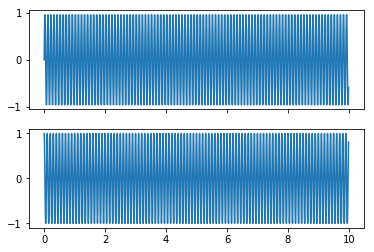

In [7]:
import numpy as np
import matplotlib.pyplot as plt

t= np.arange(1000)/100.
x = np.sin(2*np.pi*10*t)
y = np.cos(2*np.pi*10*t)

fig=plt.figure()
ax1 = plt.subplot(211)
ax2 = plt.subplot(212)

ax1.plot(t,x)
ax2.plot(t,y)

ax1.get_shared_x_axes().join(ax1, ax2)
ax1.set_xticklabels([])
# ax2.autoscale() ## call autoscale if needed

#plt.colorbar()

plt.show()

In [ ]:
f, (ax1, ax2) = plt.subplots(211, 212, sharex=True)
ax1.plot(x, y)
ax1.set_title('Sharing Y axis')
ax2.scatter(x, y)

KeyboardInterrupt: 

In [48]:
tidal_indx_sq
np.fabs(ra_n-coord_ra_dec.ra.deg-0.85) < r_t/60*15
#r_t/60*15
#np.fabs(dec_n-coord_ra_dec.dec.deg-0.1) < r_t/60*15
#shape(ra_n[tidal_indx_sq])

0        False
1        False
2         True
3         True
4        False
5        False
6        False
7        False
8        False
9        False
10        True
11       False
12       False
13       False
14        True
15        True
16       False
17       False
18        True
19        True
20       False
21       False
22       False
23       False
24        True
25        True
26       False
27       False
28       False
29       False
         ...  
18570     True
18571    False
18572     True
18573    False
18574     True
18575    False
18576     True
18577    False
18578    False
18579     True
18580    False
18581    False
18582     True
18583    False
18584    False
18585    False
18586    False
18587     True
18588     True
18589    False
18590     True
18591     True
18592     True
18593     True
18594    False
18595     True
18596     True
18597    False
18598    False
18599     True
Name: ra, Length: 18600, dtype: bool

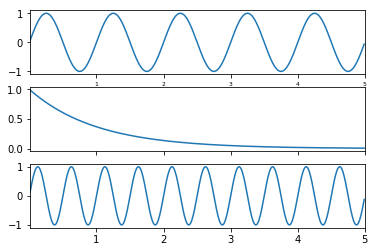

In [58]:
import matplotlib.pyplot as plt
import numpy as np

t = np.arange(0.01, 5.0, 0.01)
s1 = np.sin(2 * np.pi * t)
s2 = np.exp(-t)
s3 = np.sin(4 * np.pi * t)

ax1 = plt.subplot(311)
plt.plot(t, s1)
plt.setp(ax1.get_xticklabels(), fontsize=6)

# share x only
ax2 = plt.subplot(312, sharex=ax1)
plt.plot(t, s2)
# make these tick labels invisible
plt.setp(ax2.get_xticklabels(), visible=False)

# share x and y
ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(t, s3)
plt.xlim(0.01, 5.0)
plt.show()

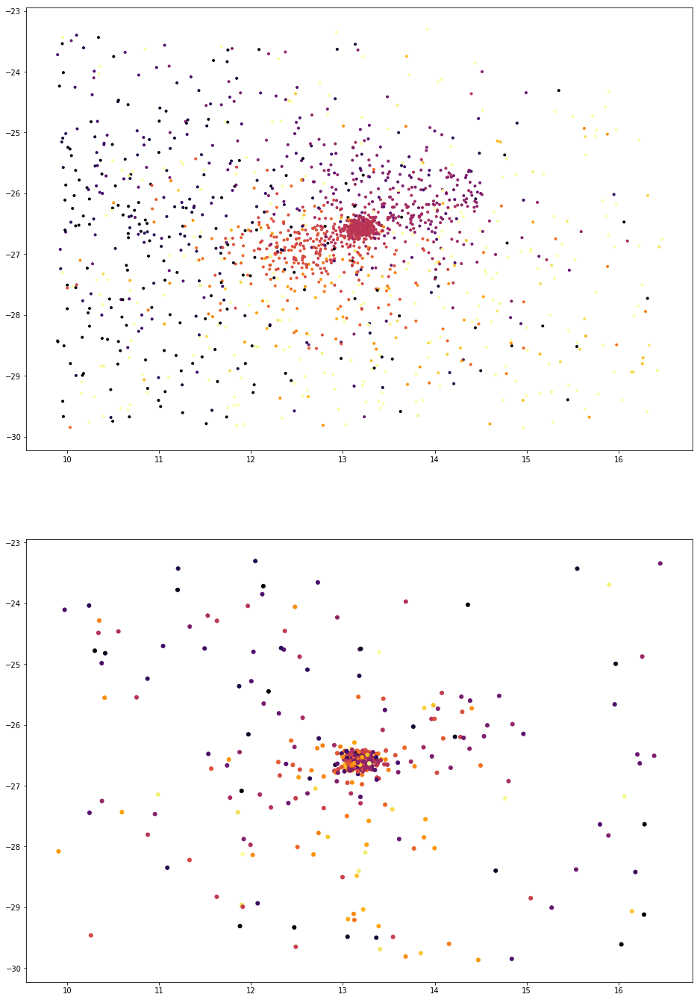

In [11]:
plt.figure(figsize=(16,24))
ax1 = plt.subplot(211)
plt.scatter(ra_n[tidal_indx_sq]-0.85, dec_n[tidal_indx_sq]-0.1, c=pmdec_n_norm[tidal_indx_sq], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, )
#plt.setp(ax1.get_xticklabels(), fontsize=15)

ax2 = plt.subplot(212, sharex=ax1, sharey=ax1)
plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='.', s=100, 
            label='eps= %.3f, minsamp= %d, pmdec error < 1' %(eps, minsamp), vmin=-1, vmax=1)

#plt.colorbar()
plt.show()


/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



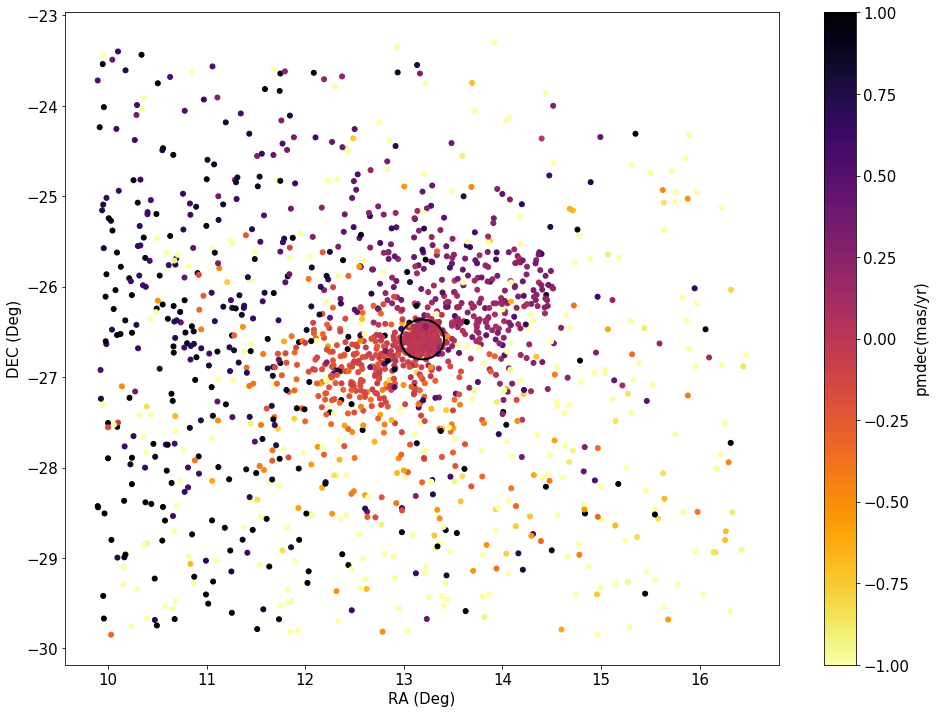

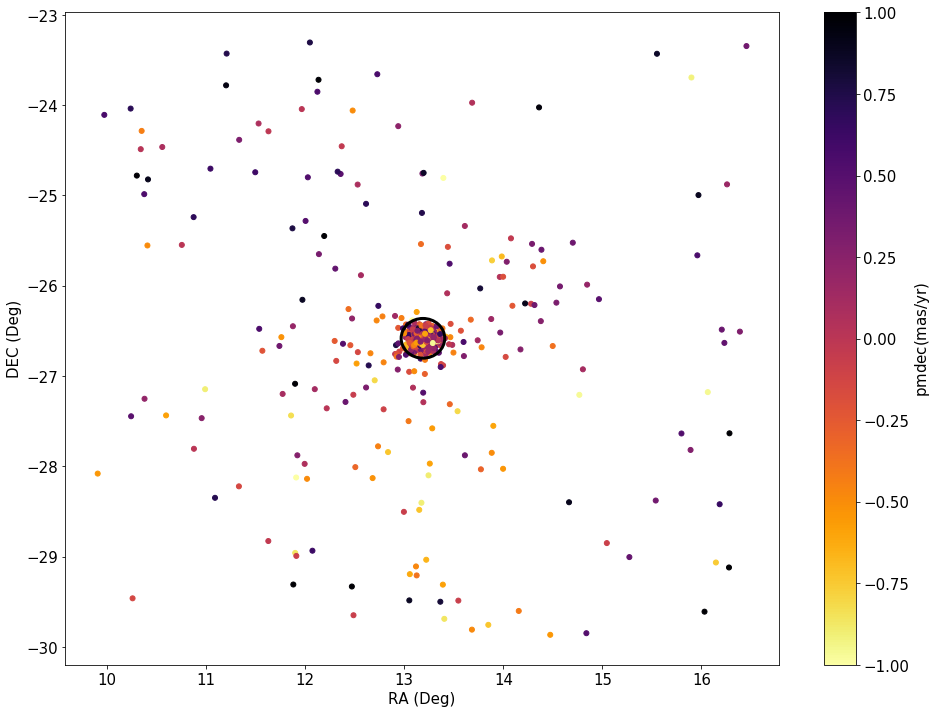

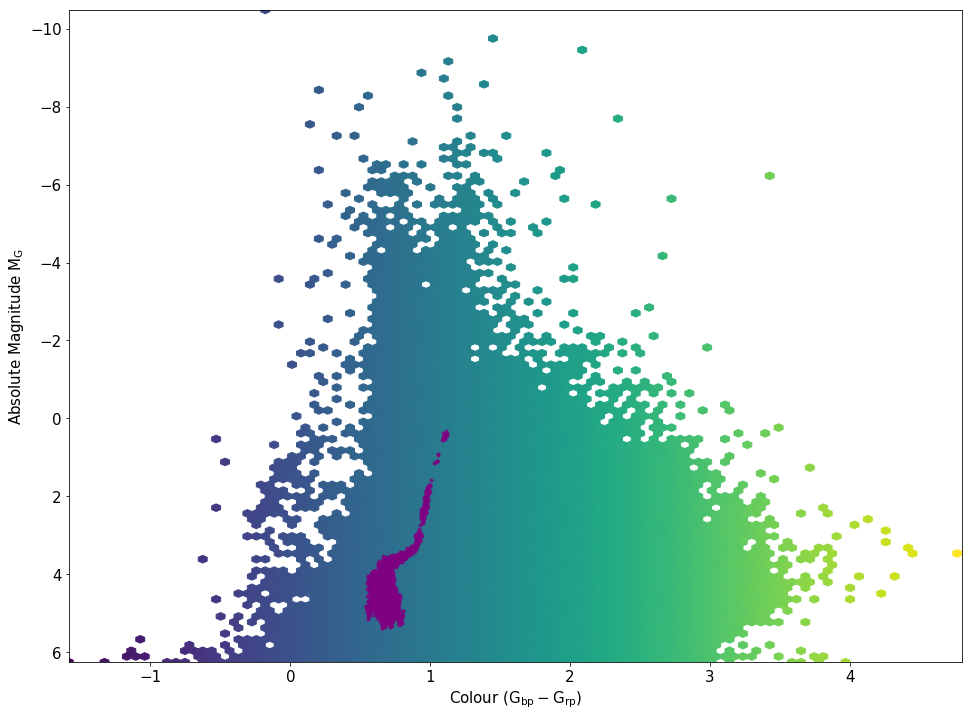

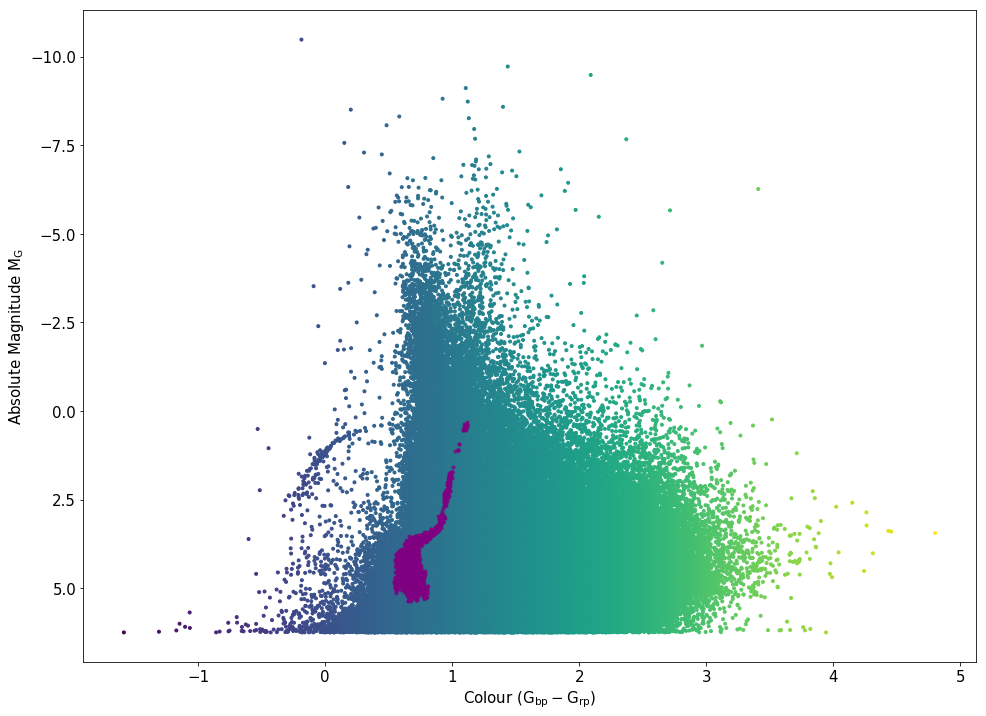

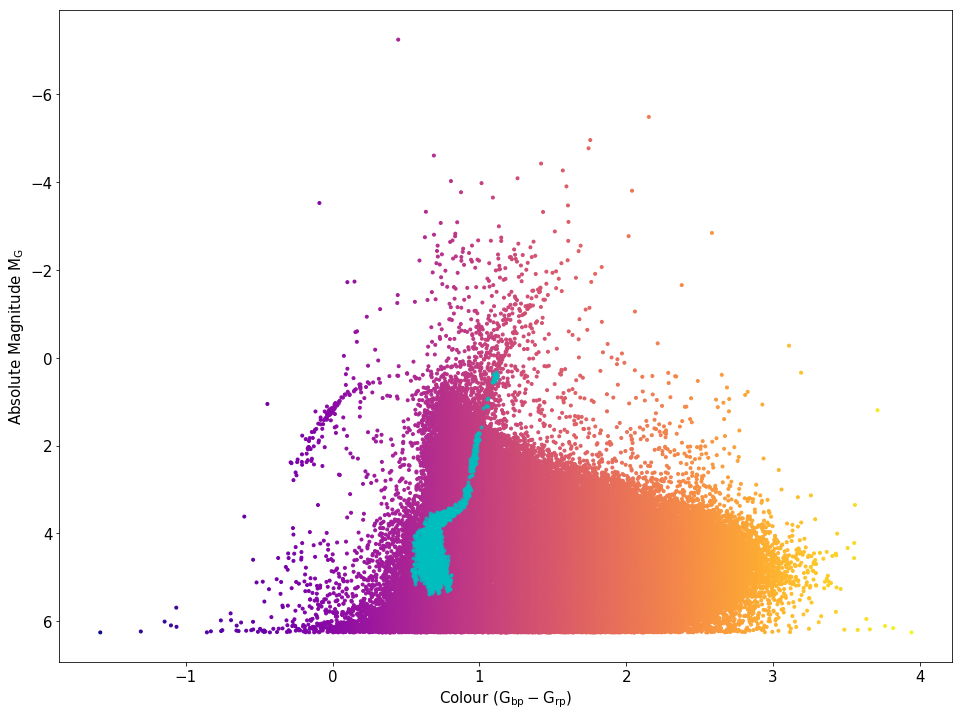

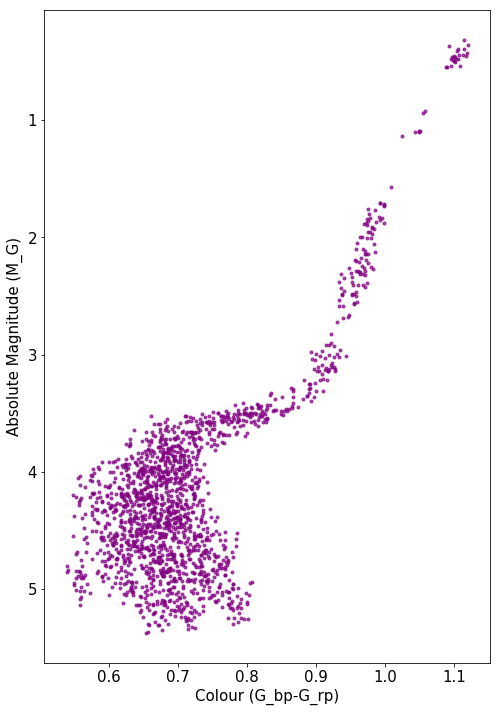

In [6]:
## PLOTS FOR PAPER

tidal_indx_sq = (fabs(ra_n-coord_ra_dec.ra.deg-0.85) < r_t/60*15 ) *\
                (fabs(dec_n-coord_ra_dec.dec.deg-0.1) < r_t/60*15 ) 
#tidal_indx_sq = [not i for i in tidal_indx_sq]
    
#    bar_indx_n = (ra_dec_rot_n.loc[:,1] < 1.5) * (ra_dec_rot_n.loc[:,1] > -1.5) *\
#             (ra_dec_rot_n.loc[:,0] < 0.5) * (ra_dec_rot_n.loc[:,0] > -0.5)
#bar_indx_n = [not i for i in bar_indx_n]

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
sc=plt.scatter(ra_n[tidal_indx_sq]-0.85, dec_n[tidal_indx_sq]-0.1, c=pmdec_n_norm[tidal_indx_sq], cmap='inferno_r',
               marker ='.', s=100,
            vmin=-1, vmax=1, )#label='with parallax criteria after DBSCANN')
#circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
#ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
plt.xlabel('RA (Deg)', fontsize=15)
plt.ylabel('DEC (Deg)', fontsize=15)
plt.tick_params('both', labelsize=15)
cb=plt.colorbar(sc)
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec (mas/yr)}$',fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([-29,-23])
#plt.gca().set_xlim([11,17])
#plt.legend()
plt.show()
#plt.savefig('NGC288_sim_paper.pdf', bbox_inches='tight')

fig=plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='.', s=100, 
            label='eps= %.3f, minsamp= %d, pmdec error < 1' %(eps, minsamp), vmin=-1, vmax=1)#vmin=-0.1, vmax=.1)#, alpha=0.2)
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t/60*4, color='b', fill=False, lw=5)
#ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax.add_artist(circle2)
circle3 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), 5/60, color='pink', fill=False, lw=2)
#ax.add_artist(circle3)
plt.xlabel('RA (Deg)', fontsize=15)
plt.ylabel('DEC (Deg)', fontsize=15)
plt.tick_params('both', labelsize=15)
#plt.legend()
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec (mas/yr)}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()
#plt.savefig('NGC288_radecpmdec_paper.pdf', bbox_inches='tight')


fig=plt.figure(figsize=(16,12))
plt.hexbin(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, C=GlobClust_Log_rpbp, 
            cmap='viridis')#, marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='purple', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('Colour ($\mathrm{G_{bp}-G_{rp}}$)', fontsize=15)
plt.ylabel('Absolute Magnitude $\mathrm{M_G}$', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()
#plt.savefig('NGC288_CMD_paper.pdf', bbox_inches='tight')

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, 
            cmap='viridis', marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='purple', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('Colour ($\mathrm{G_{bp}-G_{rp}}$)', fontsize=15)
plt.ylabel('Absolute Magnitude $\mathrm{M_G}$', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
#plt.show()
#plt.savefig('NGC288_CMD_paper2.pdf', bbox_inches='tight')

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp[parallax_indx], y=GlobClust_Log_M[parallax_indx], c=GlobClust_Log_rpbp[parallax_indx], 
            cmap='plasma', marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='c', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('Colour ($\mathrm{G_{bp}-G_{rp}}$)', fontsize=15)
plt.ylabel('Absolute Magnitude $\mathrm{M_G}$', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()
#plt.savefig('NGC288_CMD_paper.pdf', bbox_inches='tight')


fig=plt.figure(figsize=(8,12))
#plt.scatter(x=GlobClust_Log_rpbp[parallax_indx], y=GlobClust_Log_M[parallax_indx], c=GlobClust_Log_rpbp[parallax_indx], cmap='RdBu_r', marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='purple', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('Colour (G_bp-G_rp)', fontsize=15)
plt.ylabel('Absolute Magnitude (M_G)', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()



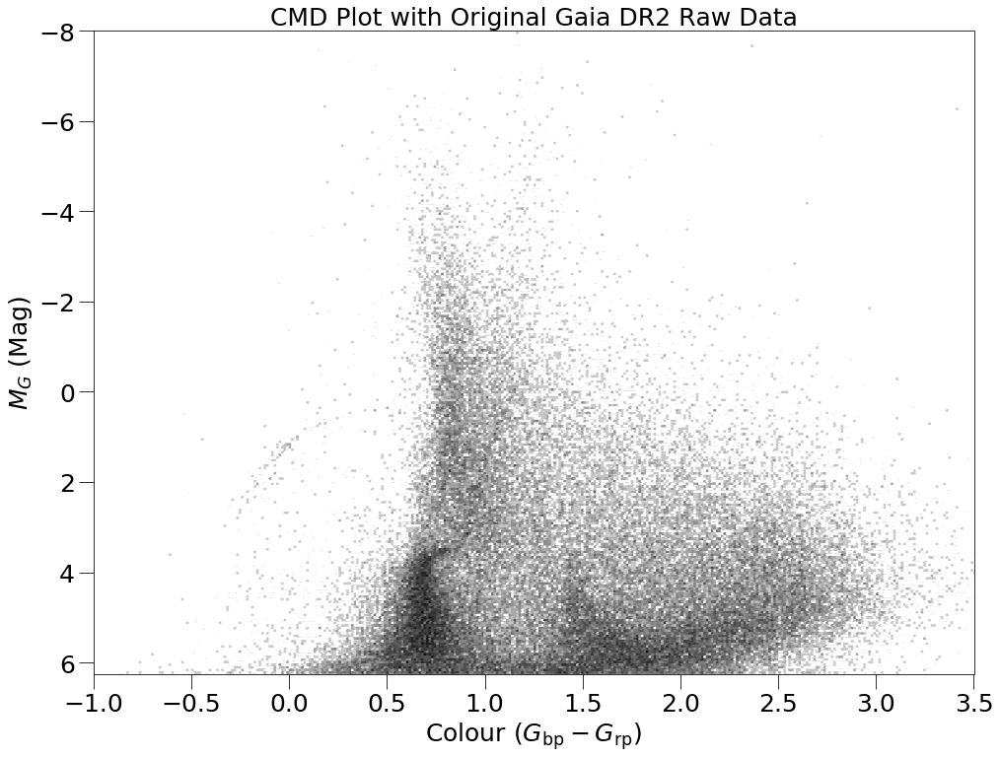

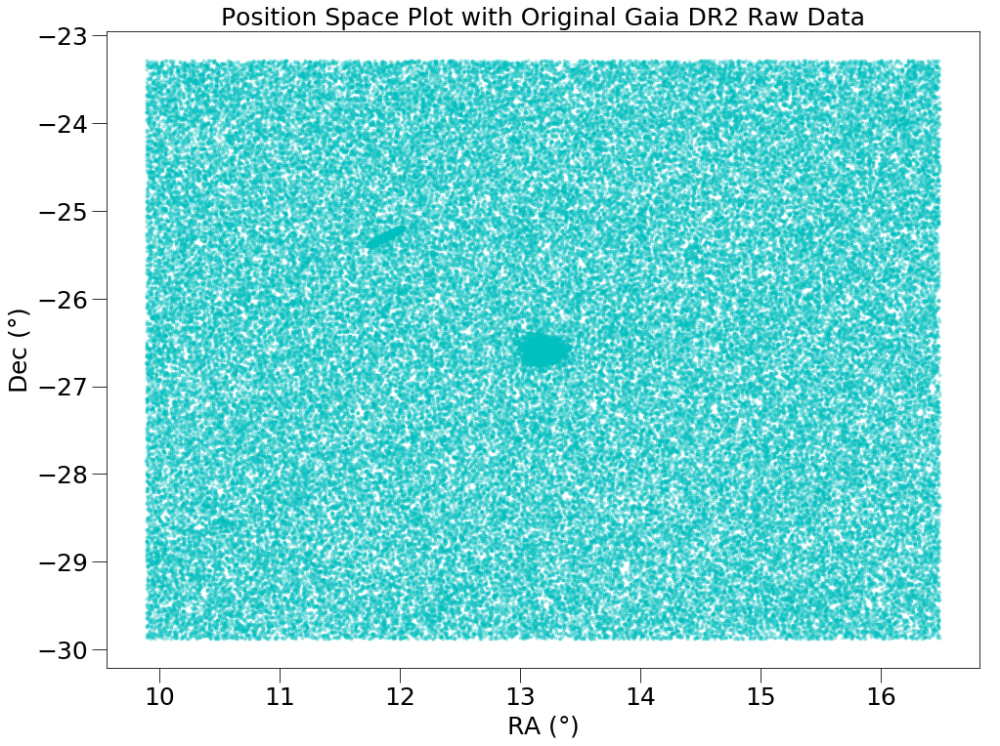

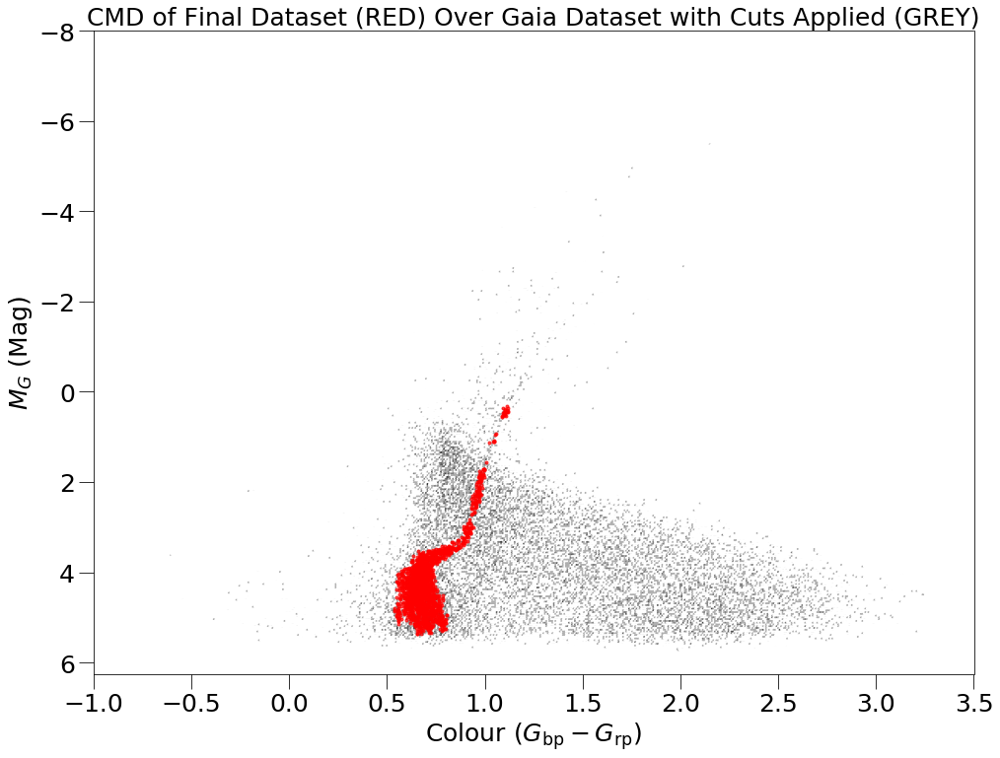

In [27]:
fig=plt.figure(figsize=(16,12))
plt.hexbin(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, gridsize=500,bins='log',cmap='gist_yarg')#, extent=[-0.5,0.5,  0,2.5])
#plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M)#, gridsize=250,bins='log', extent=[-0.5,0.5,  0,2.5])
#plt.gca().set_xlim([-0.5,0.5])
#plt.gca().set_ylim([0,3])
#plt.scatter(x=rpbp_DB, y=M_DB, c='red', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.title('CMD Plot with Original Gaia DR2 Raw Data', fontsize=25)
plt.xlabel(r'$\mathrm{Colour}\ (G_{\mathrm{bp}}-G_{\mathrm{rp}}$)', fontsize=25)
plt.ylabel(r'$M_G\ (\mathrm{Mag})$', fontsize=25)
plt.xlim(-1,3.5)
plt.ylim(-8,6.25)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=25, size=15)
plt.gca().invert_yaxis()
#plt.show()
#plt.savefig('NGC288_CMD_paper1.pdf', bbox_inches='tight')


fig=plt.figure(figsize=(16,12))
scatter(GlobClust_Log_ra_out, GlobClust_Log_dec_out, marker ='.', c='c', alpha=0.3)
plt.title('Position Space Plot with Original Gaia DR2 Raw Data', fontsize=25)
plt.xlabel(r'$\mathrm{RA}\ (\mathrm{}{\degree}$)', fontsize=25) #\circ
plt.ylabel(r'$\mathrm{Dec}\ (\mathrm{}{\degree}$)', fontsize=25)
plt.gca().tick_params(labelsize=25, size=15)


#fig=plt.figure(figsize=(16,12))
#plt.scatter(x=GlobClust_Log_ra_out[parallax_indx], y=GlobClust_Log_dec_out[parallax_indx], c='c', alpha=0.3, marker='.')
##plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
##plt.scatter(x=ra_DB, y=dec_DB, c='purple', marker='.')#, alpha=0.2)
#plt.xlabel('ra', fontsize=15)
#plt.ylabel('dec', fontsize=15)
##plt.gca().invert_yaxis()
##plt.title('CMD of ' + GC_IDs[i], fontsize=15)
##cb=plt.colorbar()
##cb.ax.tick_params(labelsize=15)
##cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
#plt.gca().tick_params(labelsize=15)
#plt.show()


fig=plt.figure(figsize=(16,12))
plt.hexbin(x=GlobClust_Log_rpbp[parallax_indx][pm_indx], y=GlobClust_Log_M[parallax_indx][pm_indx], gridsize=500,bins='log',cmap='gist_yarg')#, extent=[-0.5,0.5,  0,2.5])
#plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M)#, gridsize=250,bins='log', extent=[-0.5,0.5,  0,2.5])
#plt.gca().set_xlim([-0.5,0.5])
#plt.gca().set_ylim([0,3])
plt.scatter(x=rpbp_DB, y=M_DB, c='red', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.title('CMD of Final Dataset (RED) Over Gaia Dataset with Cuts Applied (GREY)', fontsize=25)
plt.xlabel(r'$\mathrm{Colour}\ (G_{\mathrm{bp}}-G_{\mathrm{rp}}$)', fontsize=25)
plt.ylabel(r'$M_G\ (\mathrm{Mag})$', fontsize=25)
plt.xlim(-1,3.5)
plt.ylim(-8,6.25)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=25, size =15)
plt.gca().invert_yaxis()
#plt.show()
#plt.savefig('NGC288_CMD_paper1.pdf', bbox_inches='tight')

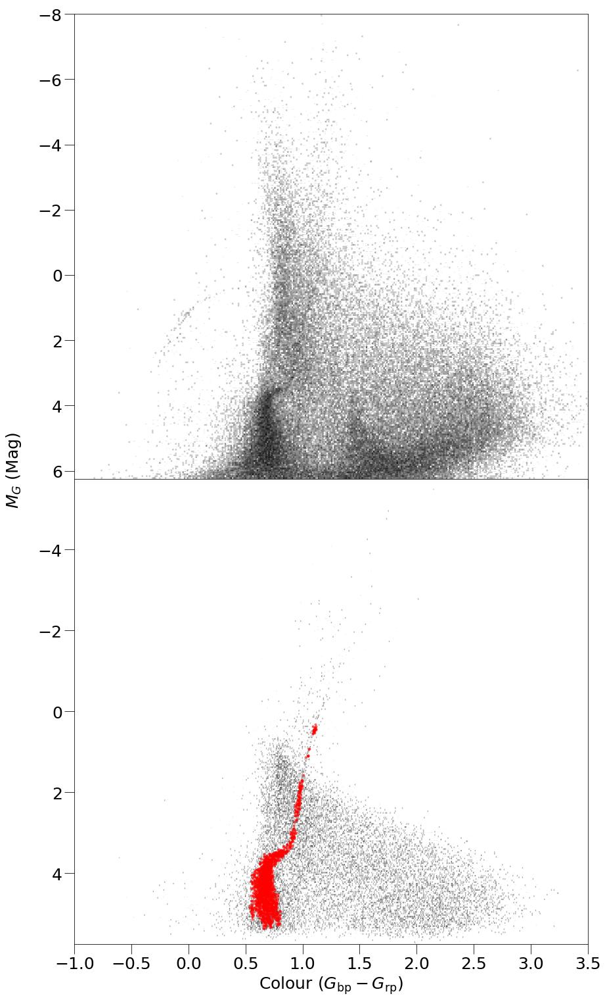

In [23]:
f, ((ax1,ax2))=plt.subplots(2,1, sharex='col',figsize=(14,26))

jibbles=ax1.hexbin(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, gridsize=500,bins='log',cmap='gist_yarg',  rasterized=True)#, extent=[-0.5,0.5,  0,2.5])
ax1.tick_params('both', labelsize=25, size=15)
ax1.set_xlim(-1,3.5)
ax1.set_ylim(-8,6.25)
ax1.invert_yaxis()

ax2.hexbin(x=GlobClust_Log_rpbp[parallax_indx][pm_indx], y=GlobClust_Log_M[parallax_indx][pm_indx], gridsize=500,bins='log',cmap='gist_yarg',  rasterized=True)
#ax2.scatter(x=GlobClust_Log_rpbp[parallax_indx][pm_indx], y=GlobClust_Log_M[parallax_indx][pm_indx], c='grey', marker='.')#, alpha=0.7, marker='.')
ax2.scatter(x=rpbp_DB, y=M_DB, c='red', alpha=0.5, marker='.',  rasterized=True)
ax2.tick_params('both', labelsize=25, size=15)
plt.subplots_adjust(hspace=0.)


plt.xlabel(r'$\mathrm{Colour}\ (G_{\mathrm{bp}}-G_{\mathrm{rp}}$)', fontsize=25)
plt.ylabel(r'$M_G\ (\mathrm{Mag})$', fontsize=25)
ax2.yaxis.set_label_coords(-0.1,1.02)
ax2.set_xlim(-1,3.5)
ax2.set_ylim(-5.75,5.75)
ax2.invert_yaxis()

#f.subplots_adjust(right=0.95)
#cbar_ax=f.add_axes([0.95,0.125,0.05,0.755])
#cb=f.colorbar(jibbles, cax=cbar_ax)
#cb.ax.tick_params(labelsize=15*2, size=10)
#cb.set_label(r'$\mu_{\delta}\ (\mathrm{mas\ yr}^{-1})$', fontsize=15*2)

plt.savefig('NGC288_CMD_paper_2.pdf', bbox_inches='tight')


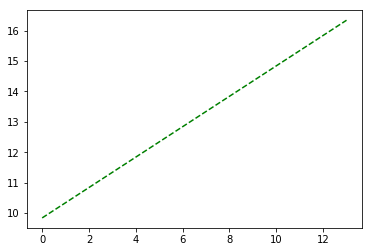

In [25]:
dec_line = np.arange(coord_ra_dec.ra.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.ra.deg + GlobClust_Log_r_t[0]/60*15+0.05, 0.5)
plt.plot(dec_line, 'g--')

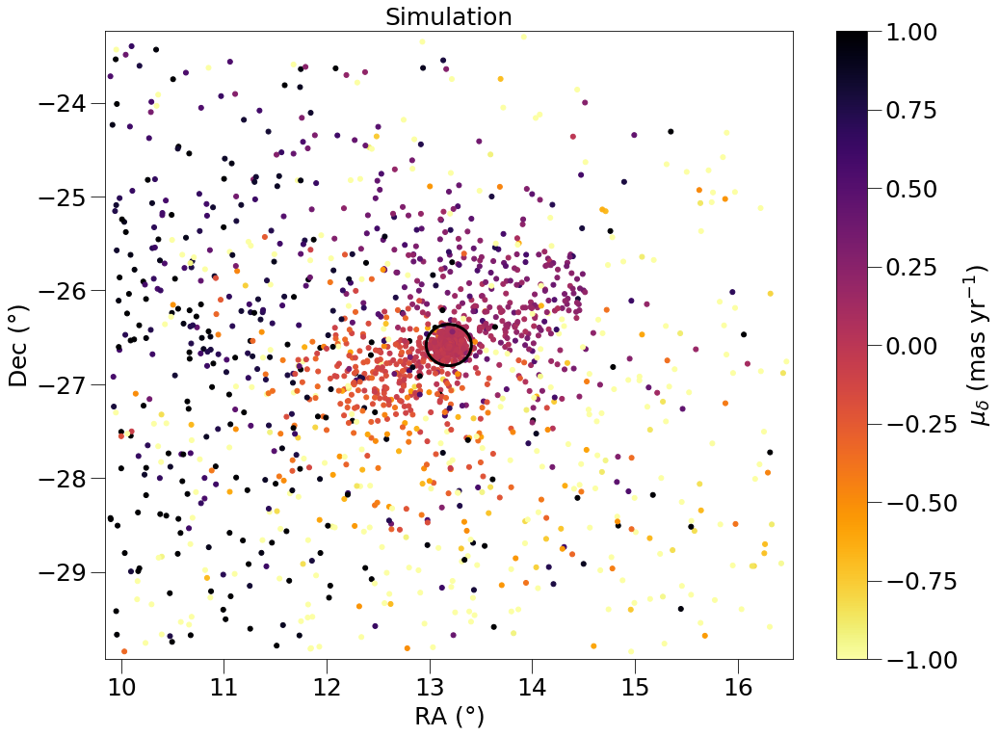

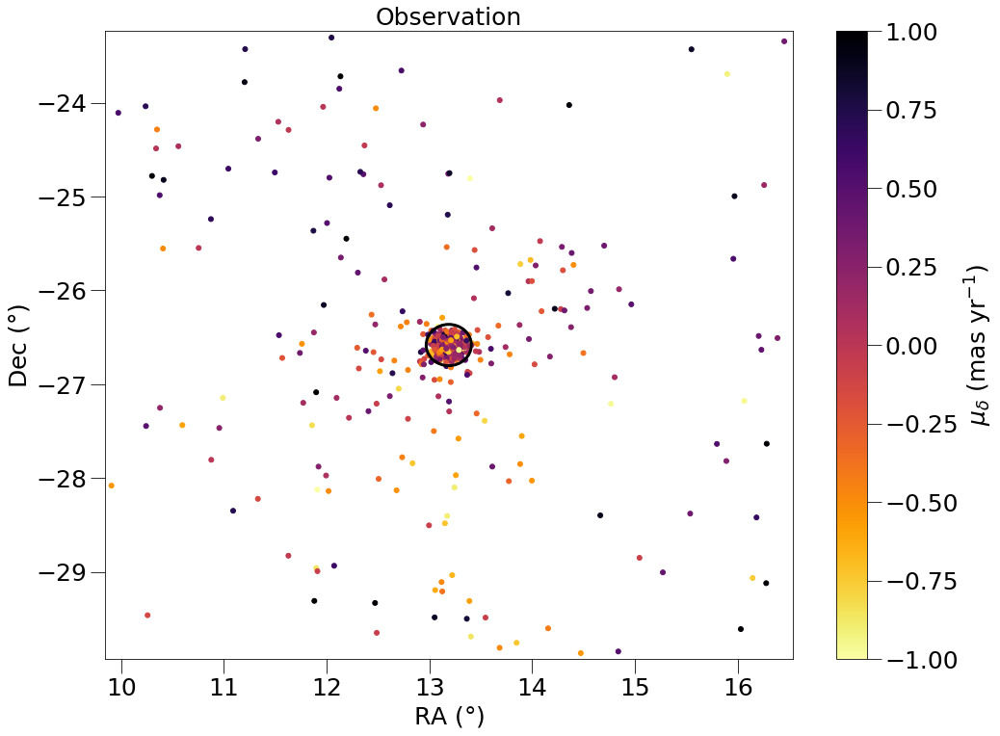

In [39]:
plt.figure(figsize=(16,12))
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
plt.scatter(ra_n[tidal_indx_sq]-ra_s, dec_n[tidal_indx_sq]-dec_s, c=pmdec_n_norm[tidal_indx_sq], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, s=100)
plt.gca().add_artist(circle2)
plt.gca().tick_params('both', labelsize=25, size=15)

plt.gca().set_xlim([coord_ra_dec.ra.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.ra.deg + GlobClust_Log_r_t[0]/60*15+0.05])
plt.gca().set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])

plt.xlabel(r'$\mathrm{RA}\ (\mathrm{}{\degree}$)', fontsize=25) #\circ
plt.ylabel(r'$\mathrm{Dec}\ (\mathrm{}{\degree}$)', fontsize=25)
plt.title('Simulation', fontsize=25)

cb=plt.colorbar()
cb.ax.tick_params(labelsize=25, size=15)
cb.set_label(r'$\mu_{\delta}\ (\mathrm{mas\ yr}^{-1})$', fontsize=25)




plt.figure(figsize=(16,12))
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
plt.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='.', s=100, vmin=-1, vmax=1)
plt.gca().add_artist(circle2)
plt.gca().tick_params('both', labelsize=25, size=15)

plt.gca().set_xlim([coord_ra_dec.ra.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.ra.deg + GlobClust_Log_r_t[0]/60*15+0.05])
plt.gca().set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])

plt.xlabel(r'$\mathrm{RA}\ (\mathrm{}{\degree}$)', fontsize=25) #\circ
plt.ylabel(r'$\mathrm{Dec}\ (\mathrm{}{\degree}$)', fontsize=25)
plt.title('Observation', fontsize=25)

cb=plt.colorbar()
cb.ax.tick_params(labelsize=25, size=15)
cb.set_label(r'$\mu_{\delta}\ (\mathrm{mas\ yr}^{-1})$', fontsize=25)


/usr/local/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))



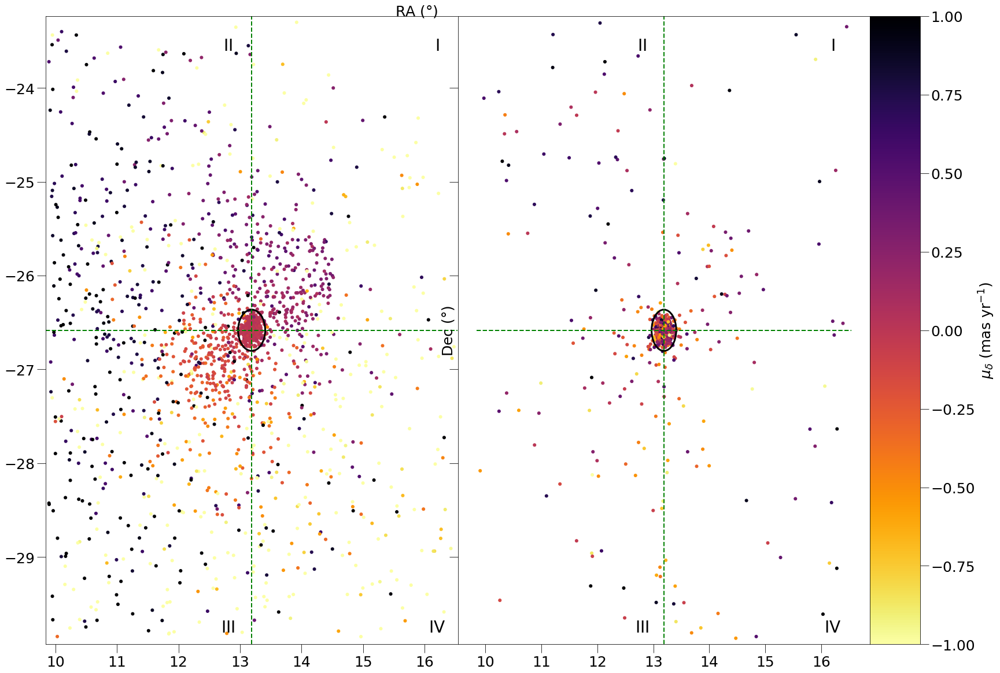

In [32]:
# Turn on LaTeX formatting for text    
#plt.rcParams['text.usetex']=True

# Place the command in the text.latex.preamble using rcParams
#plt.rcParams['text.latex.preamble']=r'\makeatletter \newcommand*{\rom}[1]{\expandafter\@slowromancap\romannumeral #1@} \makeatother'
csfont = {'fontname':'Times New Roman'}

f, ((ax1,ax2))=plt.subplots(1,2, sharey='row',figsize=(24,20))
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
jibbles=ax1.scatter(ra_n[tidal_indx_sq]-ra_s, dec_n[tidal_indx_sq]-dec_s, c=pmdec_n_norm[tidal_indx_sq], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, s=100)
ax1.add_artist(circle2)
ax1.hlines(y=coord_ra_dec.dec.deg, xmin=coord_ra_dec.ra.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           xmax=coord_ra_dec.ra.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax1.vlines(x=coord_ra_dec.ra.deg, ymin=coord_ra_dec.dec.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           ymax=coord_ra_dec.dec.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax1.text(16.2, -23.6, r'$\mathrm{I}$', {'color': 'k', 'fontsize': 28}, **csfont, horizontalalignment='center')
ax1.text(12.8, -23.6, r'$\mathrm{II}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.text(12.8, -29.8, r'$\mathrm{III}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.text(16.2, -29.8, r'$\mathrm{IV}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.tick_params('both', labelsize=25, size=15)
ax1.set_xlim([coord_ra_dec.ra.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.ra.deg + GlobClust_Log_r_t[0]/60*15+0.05])
ax1.set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])

ax2.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='.', s=100, 
            label='eps= %.3f, minsamp= %d, pmdec error < 1' %(eps, minsamp), vmin=-1, vmax=1)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax2.add_artist(circle2)
ax2.hlines(y=coord_ra_dec.dec.deg, xmin=coord_ra_dec.ra.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           xmax=coord_ra_dec.ra.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax2.vlines(x=coord_ra_dec.ra.deg, ymin=coord_ra_dec.dec.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           ymax=coord_ra_dec.dec.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax2.text(16.2, -23.6, r'$\mathrm{I}$', {'color': 'k', 'fontsize': 28}, **csfont, horizontalalignment='center')
ax2.text(12.8, -23.6, r'$\mathrm{II}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.text(12.8, -29.8, r'$\mathrm{III}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.text(16.2, -29.8, r'$\mathrm{IV}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])
ax2.tick_params('both', labelsize=25, size=15)
plt.subplots_adjust(wspace=0.)

plt.xlabel(r'$\mathrm{RA}\ (\mathrm{}{\degree}$)', fontsize=25) #\circ
plt.ylabel(r'$\mathrm{Dec}\ (\mathrm{}{\degree}$)', fontsize=25)
ax2.xaxis.set_label_coords(-0.1,1.02)

f.subplots_adjust(right=0.95)
cbar_ax=f.add_axes([0.95,0.125,0.05,0.755])
cb=f.colorbar(jibbles, cax=cbar_ax)
cb.ax.tick_params(labelsize=25, size=15)
cb.set_label(r'$\mu_{\delta}\ (\mathrm{mas\ yr}^{-1})$', fontsize=25)

#plt.savefig('NGC288_radec_paper.pdf', bbox_inches='tight')


/usr/local/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))



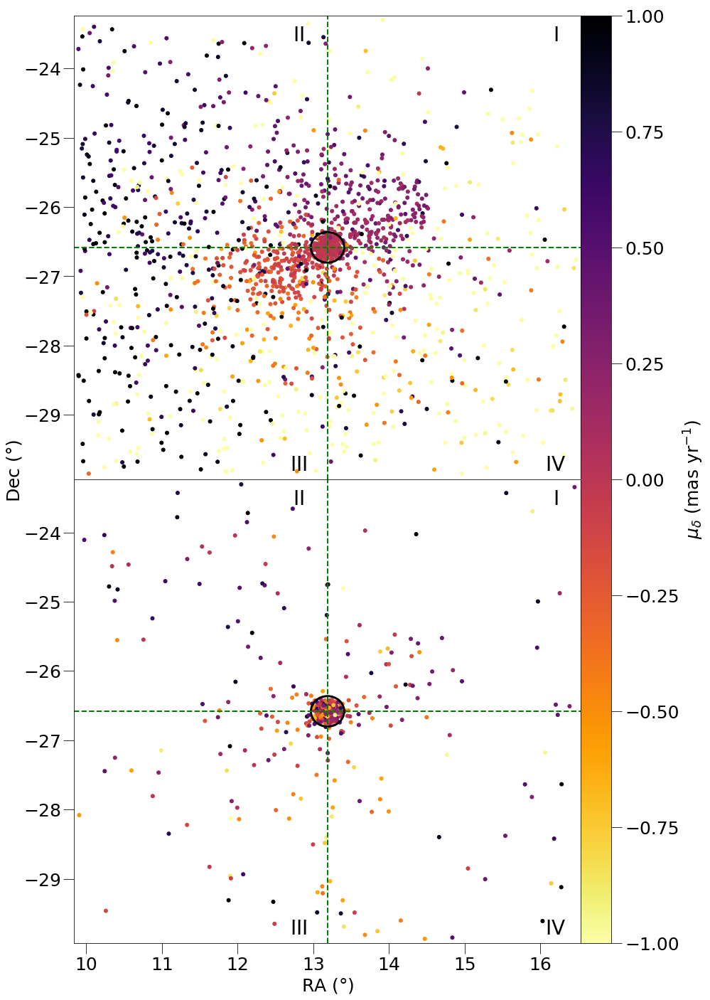

In [57]:
# Turn on LaTeX formatting for text    
#plt.rcParams['text.usetex']=True

# Place the command in the text.latex.preamble using rcParams
#plt.rcParams['text.latex.preamble']=r'\makeatletter \newcommand*{\rom}[1]{\expandafter\@slowromancap\romannumeral #1@} \makeatother'
csfont = {'fontname':'Times New Roman'}

f, ((ax1,ax2))=plt.subplots(2,1, sharex='col',figsize=(12,24))
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
jibbles=ax1.scatter(ra_n[tidal_indx_sq]-ra_s, dec_n[tidal_indx_sq]-dec_s, c=pmdec_n_norm[tidal_indx_sq], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, s=100)
ax1.add_artist(circle2)
ax1.hlines(y=coord_ra_dec.dec.deg, xmin=coord_ra_dec.ra.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           xmax=coord_ra_dec.ra.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax1.vlines(x=coord_ra_dec.ra.deg, ymin=coord_ra_dec.dec.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           ymax=coord_ra_dec.dec.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax1.text(16.2, -23.6, r'$\mathrm{I}$', {'color': 'k', 'fontsize': 28}, **csfont, horizontalalignment='center')
ax1.text(12.8, -23.6, r'$\mathrm{II}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.text(12.8, -29.8, r'$\mathrm{III}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.text(16.2, -29.8, r'$\mathrm{IV}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax1.tick_params('both', labelsize=25, size=15)
ax1.set_xlim([coord_ra_dec.ra.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.ra.deg + GlobClust_Log_r_t[0]/60*15+0.05])
ax1.set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])

ax2.scatter(x=ra_DB, y=dec_DB, c=pmdec_DB_norm, cmap='inferno_r', marker='.', s=100, 
            label='eps= %.3f, minsamp= %d, pmdec error < 1' %(eps, minsamp), vmin=-1, vmax=1)
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
ax2.add_artist(circle2)
ax2.hlines(y=coord_ra_dec.dec.deg, xmin=coord_ra_dec.ra.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           xmax=coord_ra_dec.ra.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax2.vlines(x=coord_ra_dec.ra.deg, ymin=coord_ra_dec.dec.deg-GlobClust_Log_r_t[0]/60*15-0.05, 
           ymax=coord_ra_dec.dec.deg+GlobClust_Log_r_t[0]/60*15+0.05, linewidth=2, color='g', linestyles='dashed')
ax2.text(16.2, -23.6, r'$\mathrm{I}$', {'color': 'k', 'fontsize': 28}, **csfont, horizontalalignment='center')
ax2.text(12.8, -23.6, r'$\mathrm{II}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.text(12.8, -29.8, r'$\mathrm{III}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.text(16.2, -29.8, r'$\mathrm{IV}$', {'color': 'k', 'fontsize': 28}, horizontalalignment='center')
ax2.set_ylim([coord_ra_dec.dec.deg - GlobClust_Log_r_t[0]/60*15-0.05, coord_ra_dec.dec.deg + GlobClust_Log_r_t[0]/60*15+0.05])
ax2.tick_params('both', labelsize=25, size=15)
plt.subplots_adjust(hspace=0.)

plt.xlabel(r'$\mathrm{RA}\ (\mathrm{}{\degree}$)', fontsize=25) #\circ
plt.ylabel(r'$\mathrm{Dec}\ (\mathrm{}{\degree}$)', fontsize=25)
ax2.yaxis.set_label_coords(-0.1,1.02)

f.subplots_adjust(right=0.95)
cbar_ax=f.add_axes([0.95,0.125,0.05,0.755])
cb=f.colorbar(jibbles, cax=cbar_ax)
cb.ax.tick_params(labelsize=25, size=15)
cb.set_label(r'$\mu_{\delta}\ (\mathrm{mas\ yr}^{-1})$', fontsize=25)

plt.savefig('NGC288_radec_paper.pdf', bbox_inches='tight')


In [41]:
print(plt.style.available)

['bmh', 'grayscale', 'seaborn', 'seaborn-muted', 'seaborn-dark-palette', 'seaborn-notebook', 'seaborn-paper', 'seaborn-darkgrid', 'seaborn-poster', 'ggplot', 'seaborn-ticks', 'seaborn-talk', 'seaborn-white', 'seaborn-whitegrid', 'dark_background', '_classic_test', 'seaborn-bright', 'seaborn-pastel', 'classic', 'seaborn-deep', 'fivethirtyeight', 'seaborn-colorblind', 'seaborn-dark']


/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



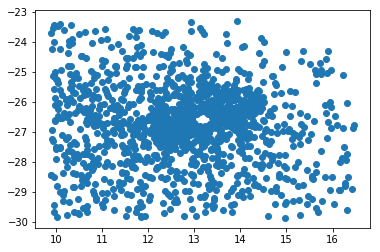

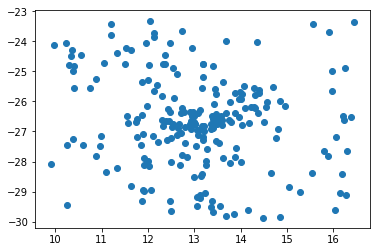

In [38]:
tidal_indx_sq2 = (fabs(ra_n-coord_ra_dec.ra.deg-0.85) < r_t/60*15 ) * (fabs(dec_n-coord_ra_dec.dec.deg-0.1) < r_t/60*15 )  *\
                (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)
plt.figure()
plt.scatter(ra_n[tidal_indx_sq2]-0.85, dec_n[tidal_indx_sq2]-0.1)

plt.figure()
plt.scatter(ra_DB[clust_indx], dec_DB[clust_indx])

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



(array([27.,  9., 16.,  6., 12.,  6.,  7.,  7.,  4.,  2.]),
 array([-26.5 , -26.15, -25.8 , -25.45, -25.1 , -24.75, -24.4 , -24.05,
        -23.7 , -23.35, -23.  ]),
 <a list of 10 Patch objects>)

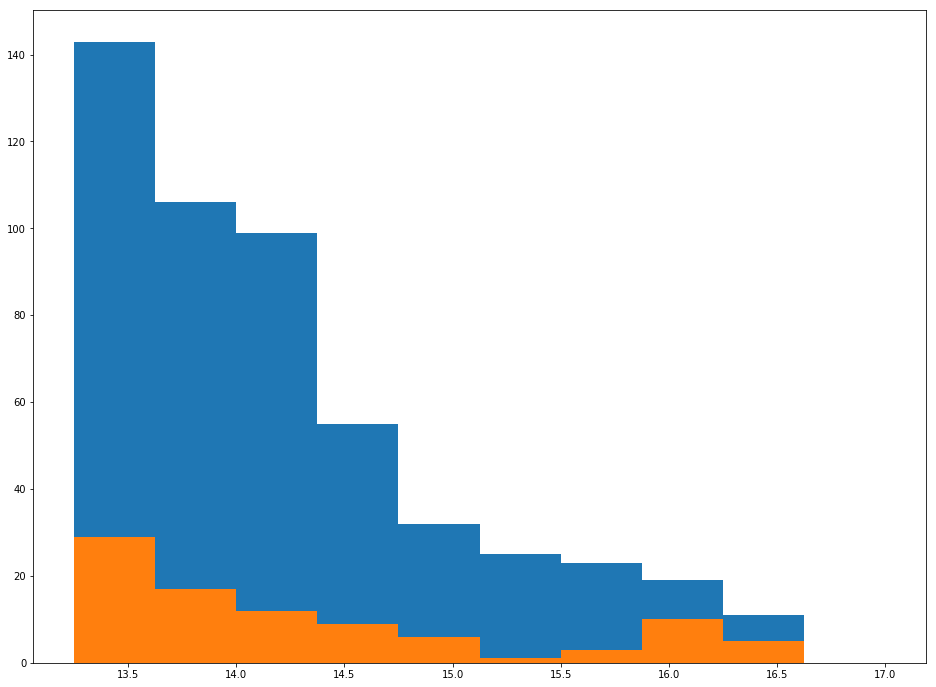

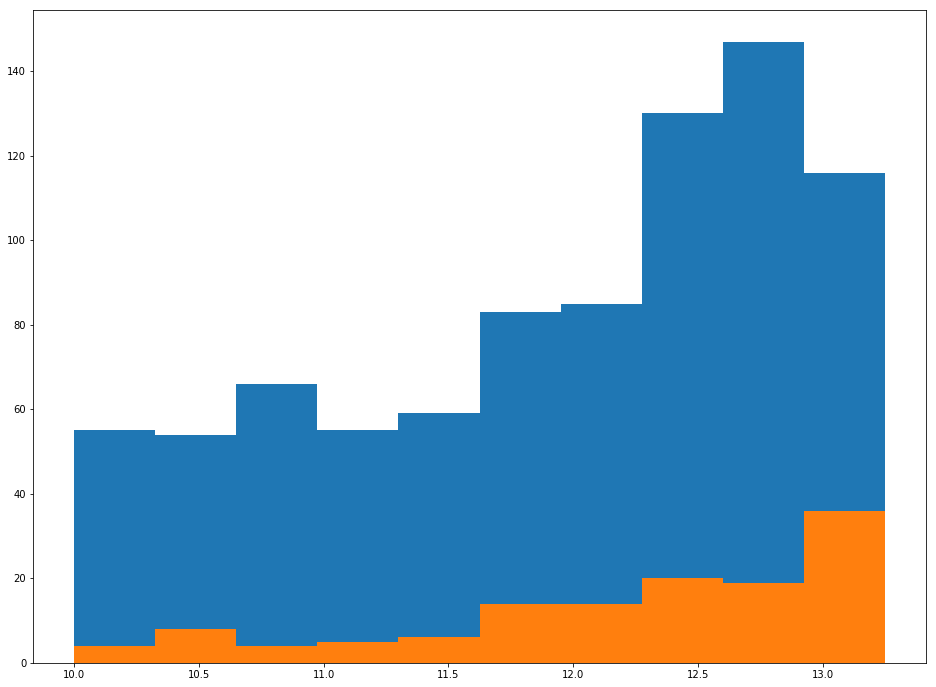

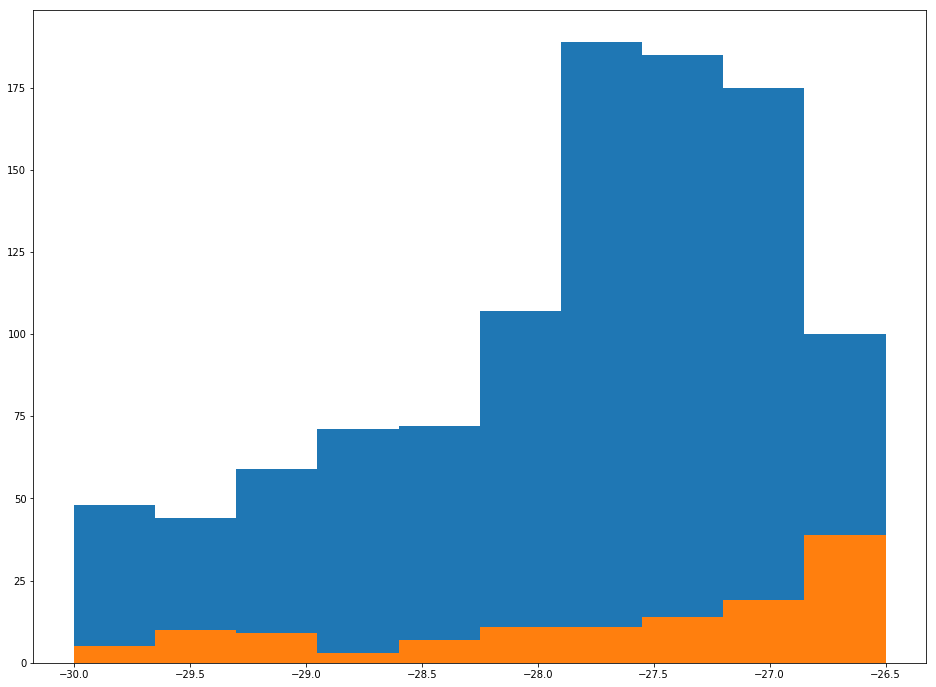

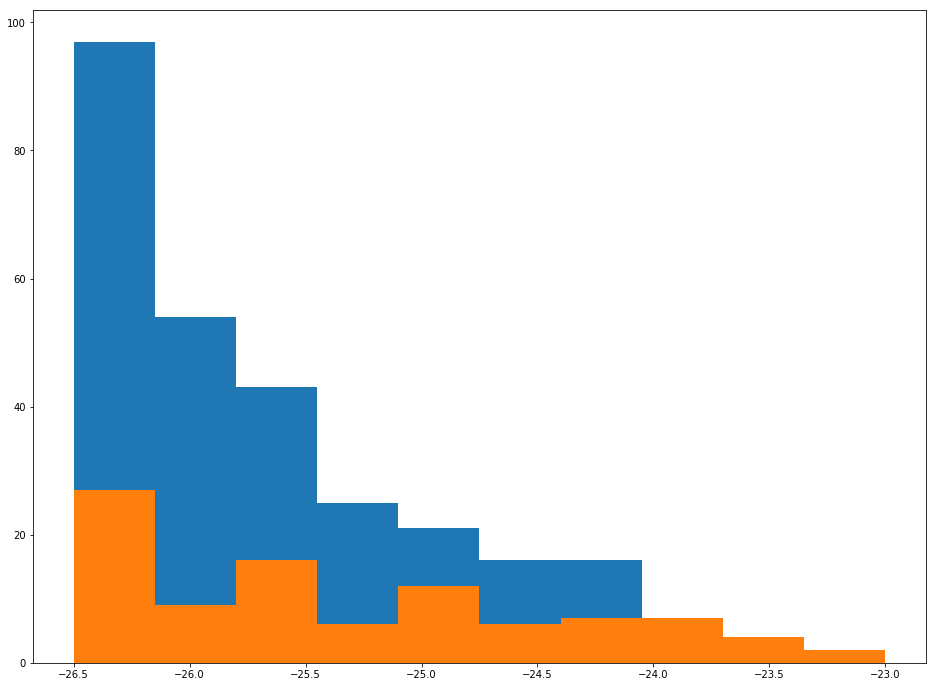

In [25]:
tidal_indx_sq2 = (fabs(ra_n-coord_ra_dec.ra.deg-ra_s) < r_t/60*15 ) * (fabs(dec_n-coord_ra_dec.dec.deg-dec_s) < r_t/60*15 )  *\
                (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) > GlobClust_Log_r_t[0]/60)

plt.figure(figsize=(16,12))
plt.hist(ra_n[tidal_indx_sq2]-0.85, range=[13.25, 17])#, bins=100)
plt.hist(ra_DB[clust_indx].as_matrix(), range=[13.25, 17])#, bins=100)
#coord_ra_dec.ra.deg, coord_ra_dec.ra.deg-0.85+GlobClust_Log_r_t[0]/60*15

plt.figure(figsize=(16,12))
plt.hist(ra_n[tidal_indx_sq2]-0.85, range=[10, 13.25])#, bins=100)
plt.hist(ra_DB[clust_indx].as_matrix(), range=[10, 13.25])#, bins=100)

plt.figure(figsize=(16,12))
plt.hist(dec_n[tidal_indx_sq2]-0.85, range=[-30, -26.5])#, bins=100)
plt.hist(dec_DB[clust_indx].as_matrix(), range=[-30, -26.5])#, bins=100)
#coord_ra_dec.ra.deg, coord_ra_dec.ra.deg-0.85+GlobClust_Log_r_t[0]/60*15

plt.figure(figsize=(16,12))
plt.hist(dec_n[tidal_indx_sq2]-0.85, range=[-26.5, -23])#, bins=100)
plt.hist(dec_DB[clust_indx].as_matrix(), range=[-26.5, -23])#, bins=100)

In [27]:
shape(dec_n)
type(ra_s)
shape(ra_n[tidal_indx_sq2]-ra_s[0])
type(coord_ra_dec.ra.deg[0])
ra_s[0]

0.8503876298044535

In [19]:
from collections import OrderedDict

a = np.array( [ 1, 2, 3 ] )
b = np.array( [ 4, 5, 6 ] )
c = np.array( [ 7, 8, 9 ] )


pd.DataFrame( OrderedDict( (('a', a), ('b', pd.Series(b)), ('c', pd.Series(c))) ) )

pd.DataFrame( OrderedDict( { 'a': pd.Series(a), 'b': pd.Series(b), 'c': pd.Series(c) } ) )


,a,b,c
0,1,4,7
1,2,5,8
2,3,6,9


In [78]:
len(pmdec_n[tidal_indx_sq2][quad_IV_n])
#len(pms_n.loc[:,"pmdec_n_QIV"].dropna())

267

In [80]:
tidal_indx_sq2 = (fabs(ra_n-coord_ra_dec.ra.deg-ra_s) < r_t/60*15 ) * (fabs(dec_n-coord_ra_dec.dec.deg-dec_s) < r_t/60*15 )  *\
                (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) > GlobClust_Log_r_t[0]/60)

quad_I_n = ((ra_n[tidal_indx_sq2]-ra_s) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) > coord_ra_dec.dec.deg[0])

quad_II_n = ((ra_n[tidal_indx_sq2]-ra_s) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) > coord_ra_dec.dec.deg[0])

quad_III_n = ((ra_n[tidal_indx_sq2]-ra_s) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) < coord_ra_dec.dec.deg[0])

quad_IV_n = ((ra_n[tidal_indx_sq2]-ra_s) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) < coord_ra_dec.dec.deg[0])


quad_I_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_II_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_III_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])

quad_IV_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])



pm_1_n = pd.DataFrame({'pmdec_n_QI': pmdec_n[tidal_indx_sq2][quad_I_n]}) 
pm_2_n = pd.DataFrame({'pmdec_n_QII': pmdec_n[tidal_indx_sq2][quad_II_n]})
pm_3_n = pd.DataFrame({'pmdec_n_QIII': pmdec_n[tidal_indx_sq2][quad_III_n]})
pm_4_n = pd.DataFrame({'pmdec_n_QIV': pmdec_n[tidal_indx_sq2][quad_IV_n]})
pm_5_n = pd.DataFrame({'pmra_n_QI': pmra_n[tidal_indx_sq2][quad_I_n]})
pm_6_n = pd.DataFrame({'pmra_n_QII': pmra_n[tidal_indx_sq2][quad_II_n]})
pm_7_n = pd.DataFrame({'pmra_n_QIII': pmra_n[tidal_indx_sq2][quad_III_n]})
pm_8_n = pd.DataFrame({'pmra_n_QIV': pmra_n[tidal_indx_sq2][quad_IV_n]})
pm_1_n.to_csv('pm_1_n_NGC288.csv', index=True, header=True)
pm_2_n.to_csv('pm_2_n_NGC288.csv', index=True, header=True)
pm_3_n.to_csv('pm_3_n_NGC288.csv', index=True, header=True)
pm_4_n.to_csv('pm_4_n_NGC288.csv', index=True, header=True)
pm_5_n.to_csv('pm_5_n_NGC288.csv', index=True, header=True)
pm_6_n.to_csv('pm_6_n_NGC288.csv', index=True, header=True)
pm_7_n.to_csv('pm_7_n_NGC288.csv', index=True, header=True)
pm_8_n.to_csv('pm_8_n_NGC288.csv', index=True, header=True)

pm_1_DB = pmdec_DB[clust_indx][quad_I_DB]
pm_2_DB = pmdec_DB[clust_indx][quad_II_DB]
pm_3_DB = pmdec_DB[clust_indx][quad_III_DB]
pm_4_DB = pmdec_DB[clust_indx][quad_IV_DB]
pm_5_DB = pmra_DB[clust_indx][quad_I_DB]
pm_6_DB = pmra_DB[clust_indx][quad_II_DB]
pm_7_DB = pmra_DB[clust_indx][quad_III_DB]
pm_8_DB = pmra_DB[clust_indx][quad_IV_DB]
pm_1_DB.to_csv('pm_1_DB_NGC288.csv', index=True, header=True)
pm_2_DB.to_csv('pm_2_DB_NGC288.csv', index=True, header=True)
pm_3_DB.to_csv('pm_3_DB_NGC288.csv', index=True, header=True)
pm_4_DB.to_csv('pm_4_DB_NGC288.csv', index=True, header=True)
pm_5_DB.to_csv('pm_5_DB_NGC288.csv', index=True, header=True)
pm_6_DB.to_csv('pm_6_DB_NGC288.csv', index=True, header=True)
pm_7_DB.to_csv('pm_7_DB_NGC288.csv', index=True, header=True)
pm_8_DB.to_csv('pm_8_DB_NGC288.csv', index=True, header=True)

#pmdec_n[tidal_indx_sq2][quad_I_n]
#pms_n.loc[:, "pmdec_n_QI"].dropna()

#radec_n = pd.DataFrame(OrderedDict({'dec_n_QI': dec_n[tidal_indx_sq2][quad_I_n], 'dec_n_QII': dec_n[tidal_indx_sq2][quad_II_n],\
#                            'dec_n_QIII': dec_n[tidal_indx_sq2][quad_III_n], 'dec_n_QIV': dec_n[tidal_indx_sq2][quad_IV_n],\
#                            'ra_n_QI': ra_n[tidal_indx_sq2][quad_I_n], 'ra_n_QII': ra_n[tidal_indx_sq2][quad_II_n],\
#                            'ra_n_QIII': ra_n[tidal_indx_sq2][quad_III_n], 'ra_n_QIV': ra_n[tidal_indx_sq2][quad_IV_n]}))
#radec_n.to_csv('radec_n_NGC288.csv', index=True, header=True)

#pmdec_n[tidal_indx_sq2][quad_I_n]
#radec_n.loc[:, "dec_n_QI"].dropna()


#pms_DB = pmdec_DB[clust_indx][quad_I_DB].reset_index(drop=True).join(pmdec_DB[clust_indx][quad_II_DB].reset_index(drop=True), lsuffix='QI', rsuffix='QII').join(pmdec_DB[clust_indx][quad_III_DB].reset_index(drop=True), rsuffix='QIII')
#pms_DB = pms_DB.join(pmdec_DB[clust_indx][quad_IV_DB].reset_index(drop=True), rsuffix='QIV').join(pmra_DB[clust_indx][quad_I_DB].reset_index(drop=True), rsuffix='QI').join(pmra_DB[clust_indx][quad_II_DB].reset_index(drop=True), rsuffix='QII')
#pms_DB = pms_DB.join(pmra_DB[clust_indx][quad_III_DB].reset_index(drop=True), rsuffix='QIII').join(pmra_DB[clust_indx][quad_IV_DB].reset_index(drop=True), rsuffix='QIV')
#pd.DataFrame(OrderedDict({'pmdec_DB_QI': , 'pmdec_DB_QII': ,'pmdec_DB_QIII': , 'pmdec_DB_QIV': ,'pmra_DB_QI': , 'pmra_DB_QII': ,\'pmra_DB_QIII': , 'pmra_DB_QIV':}))
#pms_DB.to_csv('pms_DB_NGC288.csv', index=True, header=True)

#len(pmdec_DB[clust_indx][quad_II_DB])
#pms_DB#.loc[:, "pmdec_QI"].dropna()

#pms_DB = pd.DataFrame(OrderedDict({'pmdec_DB_QI': pmdec_DB[clust_indx][quad_I_DB].as_matrix()[:,0], 'pmdec_DB_QII': pmdec_DB[clust_indx][quad_II_DB].as_matrix()[:,0],\
#                            'pmdec_DB_QIII': pmdec_DB[clust_indx][quad_III_DB].as_matrix()[:,0], 'pmdec_DB_QIV': pmdec_DB[clust_indx][quad_IV_DB].as_matrix()[:,0],\
#                            'pmra_DB_QI': pmra_DB[clust_indx][quad_I_DB].as_matrix()[:,0], 'pmra_DB_QII': pmra_DB[clust_indx][quad_II_DB].as_matrix()[:,0],\
#                            'pmra_DB_QIII': pmra_DB[clust_indx][quad_III_DB].as_matrix()[:,0], 'pmra_DB_QIV': pmra_DB[clust_indx][quad_IV_DB].as_matrix()[:,0]}))


#pmdec_QI = pmdec_DB[clust_indx][quad_I_DB].rename(columns={"pmdec": "pmdec_QI"})
#pmdec_QI.to_csv('pms_DB_NGC288.csv', index=True, header=True)

#pmdec_QII = pmdec_DB[clust_indx][quad_II_DB].rename(columns={"pmdec": "pmdec_QII"})
#pmdec_QII.to_csv('pms_DB_NGC288.csv', index=True, header=True, columns=[1])

#pmdec_n[tidal_indx_sq2][quad_I_n]
#pms_DB.loc[:, "pmdec_DB_QI"].dropna()

#radec_n = pd.DataFrame({'ra_n': ra_n[tidal_indx_sq2], 'dec': dec_n[tidal_indx_sq2]})
#radec_n.to_csv('radec_n_NGC288.csv', index=True, header=True)

#pms_DB = pd.DataFrame({'pmra_DB': pmra_DB[clust_indx], 'pmdec': pmdec_DB[clust_indx]})
#pms_DB.to_csv('pms_DB_NGC288.csv', index=True, header=True)
#radec_DB = pd.DataFrame({'ra_DB': ra_DB[clust_indx], 'dec': dec_DB[clust_indx]})
#radec_DB.to_csv('radec_DB_NGC288.csv', index=True, header=True)

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



In [81]:
rd_1_n = pd.DataFrame({'dec_n_QI': dec_n[tidal_indx_sq2][quad_I_n]}) 
rd_2_n = pd.DataFrame({'dec_n_QII': dec_n[tidal_indx_sq2][quad_II_n]})
rd_3_n = pd.DataFrame({'dec_n_QIII': dec_n[tidal_indx_sq2][quad_III_n]})
rd_4_n = pd.DataFrame({'dec_n_QIV': dec_n[tidal_indx_sq2][quad_IV_n]})
rd_5_n = pd.DataFrame({'ra_n_QI': ra_n[tidal_indx_sq2][quad_I_n]})
rd_6_n = pd.DataFrame({'ra_n_QII': ra_n[tidal_indx_sq2][quad_II_n]})
rd_7_n = pd.DataFrame({'ra_n_QIII': ra_n[tidal_indx_sq2][quad_III_n]})
rd_8_n = pd.DataFrame({'ra_n_QIV': ra_n[tidal_indx_sq2][quad_IV_n]})
rd_1_n.to_csv('rd_1_n_NGC288.csv', index=True, header=True)
rd_2_n.to_csv('rd_2_n_NGC288.csv', index=True, header=True)
rd_3_n.to_csv('rd_3_n_NGC288.csv', index=True, header=True)
rd_4_n.to_csv('rd_4_n_NGC288.csv', index=True, header=True)
rd_5_n.to_csv('rd_5_n_NGC288.csv', index=True, header=True)
rd_6_n.to_csv('rd_6_n_NGC288.csv', index=True, header=True)
rd_7_n.to_csv('rd_7_n_NGC288.csv', index=True, header=True)
rd_8_n.to_csv('rd_8_n_NGC288.csv', index=True, header=True)

rd_1_DB = dec_DB[clust_indx][quad_I_DB]
rd_2_DB = dec_DB[clust_indx][quad_II_DB]
rd_3_DB = dec_DB[clust_indx][quad_III_DB]
rd_4_DB = dec_DB[clust_indx][quad_IV_DB]
rd_5_DB = ra_DB[clust_indx][quad_I_DB]
rd_6_DB = ra_DB[clust_indx][quad_II_DB]
rd_7_DB = ra_DB[clust_indx][quad_III_DB]
rd_8_DB = ra_DB[clust_indx][quad_IV_DB]
rd_1_DB.to_csv('rd_1_DB_NGC288.csv', index=True, header=True)
rd_2_DB.to_csv('rd_2_DB_NGC288.csv', index=True, header=True)
rd_3_DB.to_csv('rd_3_DB_NGC288.csv', index=True, header=True)
rd_4_DB.to_csv('rd_4_DB_NGC288.csv', index=True, header=True)
rd_5_DB.to_csv('rd_5_DB_NGC288.csv', index=True, header=True)
rd_6_DB.to_csv('rd_6_DB_NGC288.csv', index=True, header=True)
rd_7_DB.to_csv('rd_7_DB_NGC288.csv', index=True, header=True)
rd_8_DB.to_csv('rd_8_DB_NGC288.csv', index=True, header=True)

In [70]:
pmdec_DB[clust_indx][quad_I_DB]

,pmdec
7492,-5.496752
10171,-4.784473
12040,-5.655086
15321,-6.359916
22554,-5.876674
24736,-5.279797
25590,-5.872511
29196,-4.838619
31611,-5.133101
33660,-6.204400


In [50]:
len(pmdec_DB[clust_indx][quad_IV_DB])

53

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



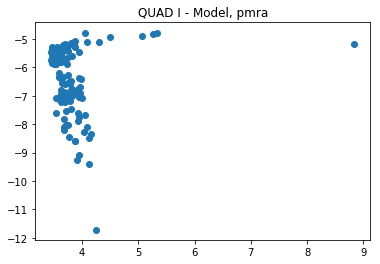

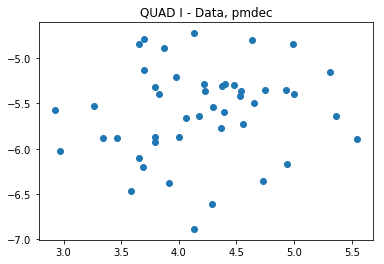

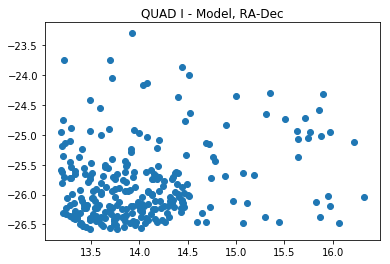

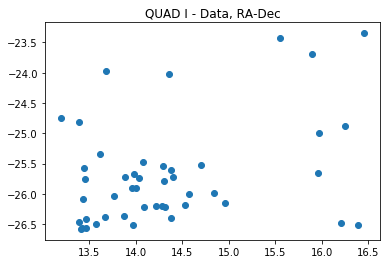

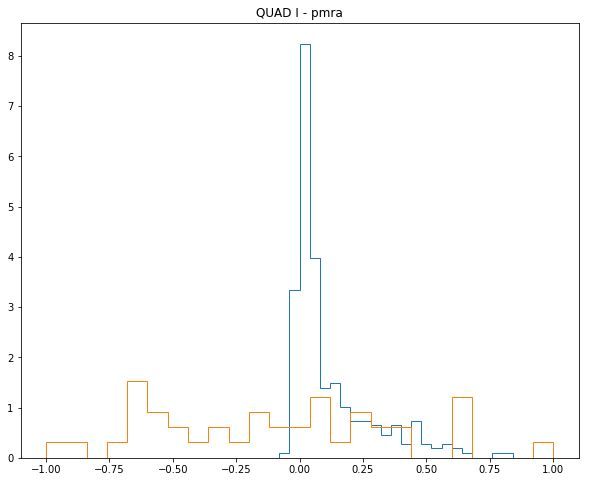

...

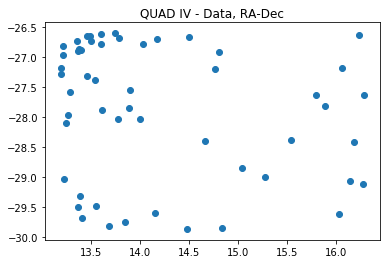

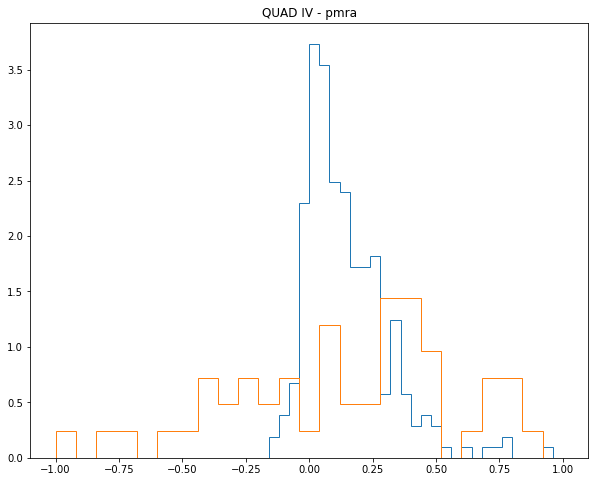

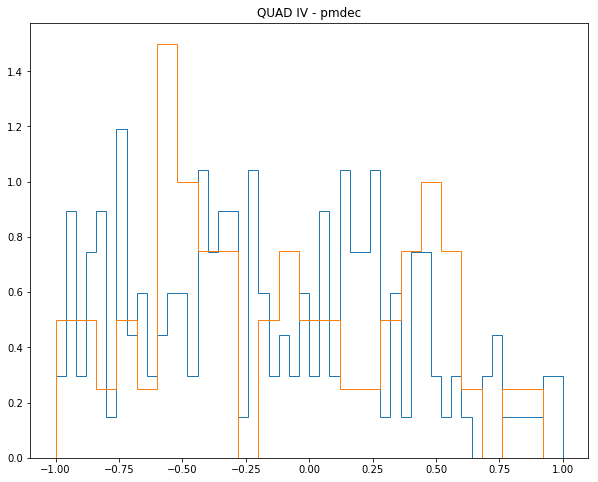

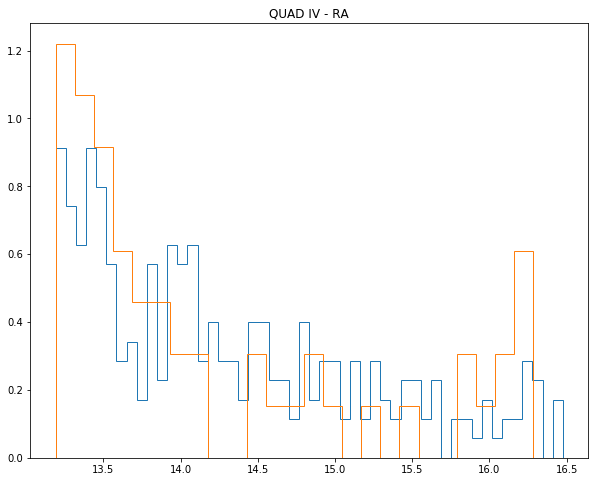

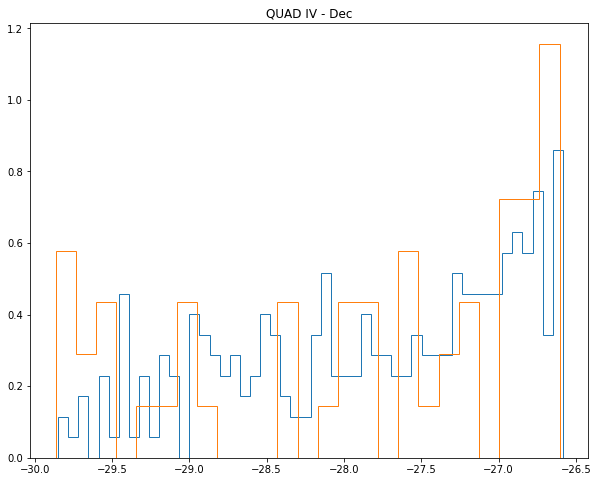

In [8]:
tidal_indx_sq2 = (fabs(ra_n-coord_ra_dec.ra.deg-ra_s) < r_t/60*15 ) * (fabs(dec_n-coord_ra_dec.dec.deg-dec_s) < r_t/60*15 )  *\
                (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-ra_s)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-dec_s)**2)) > GlobClust_Log_r_t[0]/60)

quad_I_n = ((ra_n[tidal_indx_sq2]-ra_s) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) > coord_ra_dec.dec.deg[0])

quad_II_n = ((ra_n[tidal_indx_sq2]-ra_s) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) > coord_ra_dec.dec.deg[0])

quad_III_n = ((ra_n[tidal_indx_sq2]-ra_s) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) < coord_ra_dec.dec.deg[0])

quad_IV_n = ((ra_n[tidal_indx_sq2]-ra_s) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-dec_s) < coord_ra_dec.dec.deg[0])


quad_I_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_II_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_III_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])

quad_IV_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])

#print((dec_n[tidal_indx_sq2]-0.85) > -26.5)


#QUAD I
plt.figure()
plt.title('QUAD I - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_I_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_I_n]-dec_s)

plt.figure()
plt.title('QUAD I - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_I_DB], pmdec_DB[clust_indx][quad_I_DB])

plt.figure()
plt.title('QUAD I - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_I_n]-ra_s, dec_n[tidal_indx_sq2][quad_I_n]-dec_s)

plt.figure()
plt.title('QUAD I - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_I_DB], dec_DB[clust_indx][quad_I_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD I - pmra')
QI_c_pmra_n, ed, pat = plt.hist(pmra_n_norm[tidal_indx_sq2][quad_I_n], bins=50, range=[-1,1], normed=True, histtype='step')
QI_c_pmra_DB, ed, pat = plt.hist(pmra_DB_norm[clust_indx][quad_I_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - pmdec')
QI_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_I_n], bins=50, range=[-1,1], normed=True, histtype='step')
QI_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_I_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - RA')
QI_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_I_n]-ra_s, bins=50, normed=True, histtype='step')
QI_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_I_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - Dec')
QI_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_I_n]-dec_s, bins=50, normed=True, histtype='step')
QI_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_I_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD II
plt.figure()
plt.title('QUAD II - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_II_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_II_n]-dec_s)

plt.figure()
plt.title('QUAD II - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_II_DB], pmdec_DB[clust_indx][quad_II_DB])

plt.figure()
plt.title('QUAD II - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_II_n]-ra_s, dec_n[tidal_indx_sq2][quad_II_n]-dec_s)

plt.figure()
plt.title('QUAD II - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_II_DB], dec_DB[clust_indx][quad_II_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD II - pmra')
QII_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_II_n], bins=50, range=[-1,1], normed=True, histtype='step')
QII_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_II_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - pmdec')
QII_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_II_n], bins=50, range=[-1,1], normed=True, histtype='step')
QII_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_II_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - RA')
QII_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_II_n]-ra_s, bins=50, normed=True, histtype='step')
QII_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_II_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - Dec')
QII_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_II_n]-dec_s, bins=50, normed=True, histtype='step')
QII_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_II_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD III
plt.figure()
plt.title('QUAD III - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_III_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_III_n]-dec_s)

plt.figure()
plt.title('QUAD III - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_III_DB], pmdec_DB[clust_indx][quad_III_DB])

plt.figure()
plt.title('QUAD III - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_III_n]-ra_s, dec_n[tidal_indx_sq2][quad_III_n]-dec_s)

plt.figure()
plt.title('QUAD III - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_III_DB], dec_DB[clust_indx][quad_III_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD III - pmra')
QIII_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_III_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIII_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_III_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - pmdec')
QIII_c_pmdec_n, ed, pat =plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_III_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIII_c_pmdec_DB, ed, pat =plt.hist(pmdec_DB_norm[clust_indx][quad_III_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - RA')
QIII_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_III_n]-ra_s, bins=50, normed=True, histtype='step')
QIII_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_III_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - Dec')
QIII_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_III_n]-dec_s, bins=50, normed=True, histtype='step')
QIII_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_III_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD IV
plt.figure()
plt.title('QUAD IV - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_IV_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_IV_n]-dec_s)

plt.figure()
plt.title('QUAD IV - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_IV_DB], pmdec_DB[clust_indx][quad_IV_DB])

plt.figure()
plt.title('QUAD IV - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_IV_n]-ra_s, dec_n[tidal_indx_sq2][quad_IV_n]-dec_s)

plt.figure()
plt.title('QUAD IV - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_IV_DB], dec_DB[clust_indx][quad_IV_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD IV - pmra')
QIV_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_IV_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIV_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_IV_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - pmdec')
QIV_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_IV_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIV_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_IV_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - RA')
QIV_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_IV_n]-ra_s, bins=50, normed=True, histtype='step')
QIV_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_IV_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - Dec')
QIV_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_IV_n]-dec_s, bins=50, normed=True, histtype='step')
QIV_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_IV_DB].as_matrix(), bins=25, normed=True, histtype='step')

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



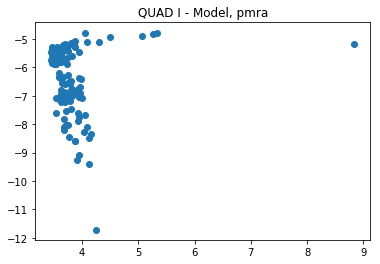

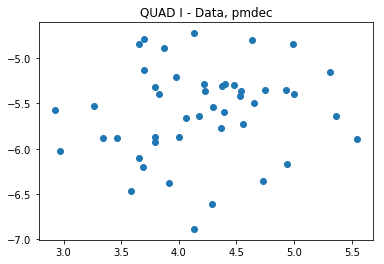

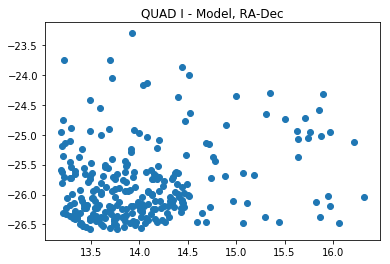

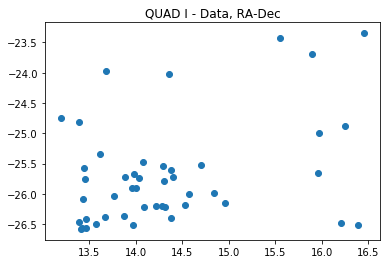

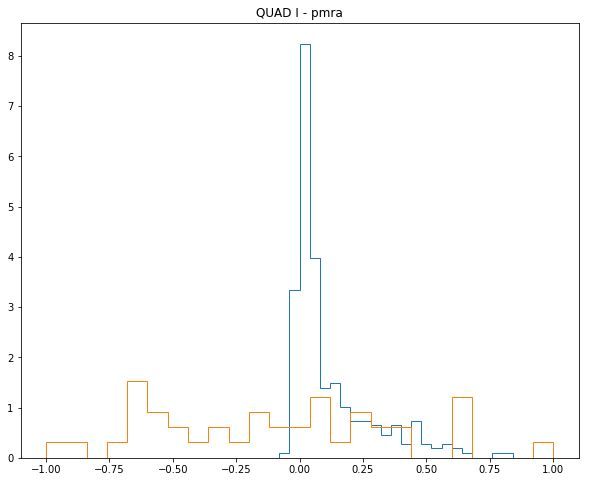

...

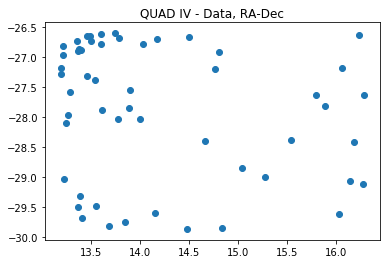

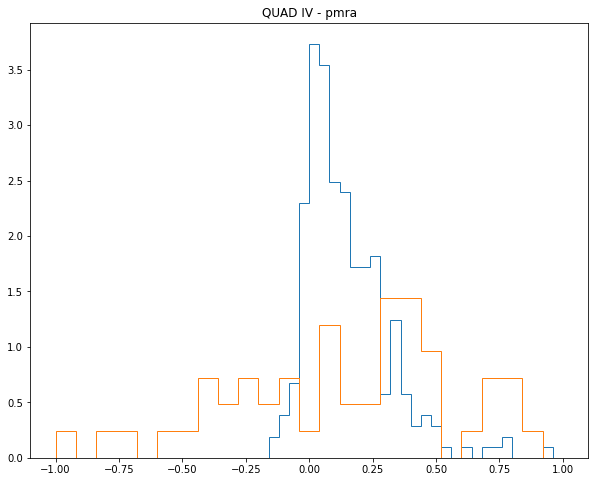

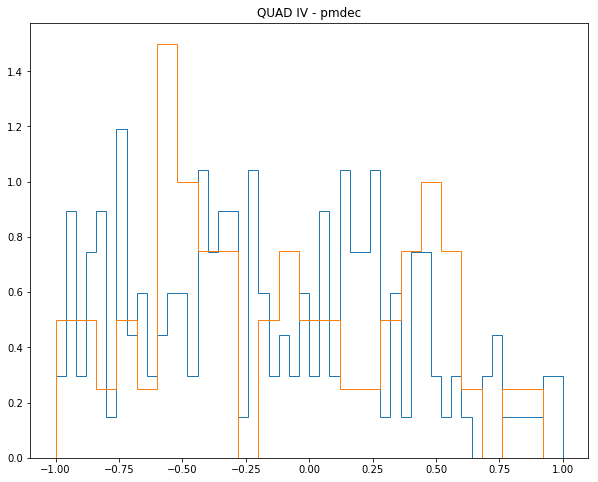

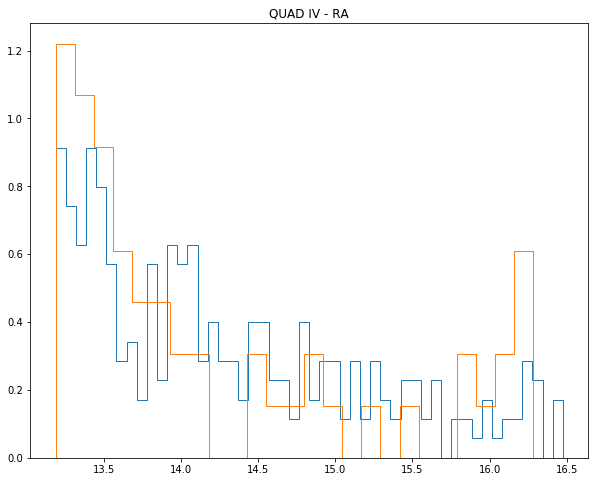

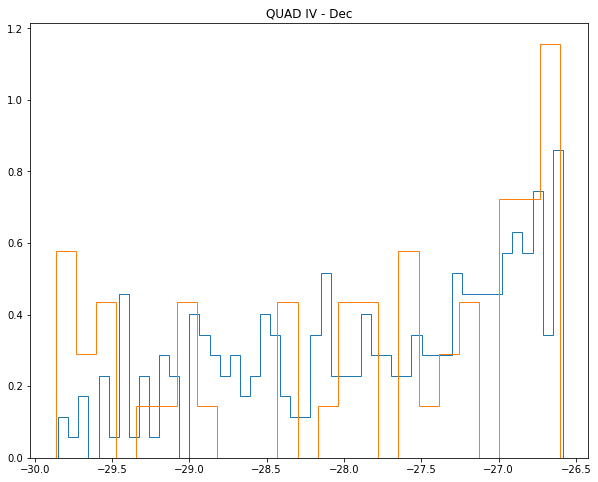

In [39]:
tidal_indx_sq2 = (fabs(ra_n-coord_ra_dec.ra.deg-0.85) < r_t/60*15 ) * (fabs(dec_n-coord_ra_dec.dec.deg-0.1) < r_t/60*15 )  *\
                (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)

quad_I_n = ((ra_n[tidal_indx_sq2]-0.85) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-0.1) > coord_ra_dec.dec.deg[0])

quad_II_n = ((ra_n[tidal_indx_sq2]-0.85) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-0.1) > coord_ra_dec.dec.deg[0])

quad_III_n = ((ra_n[tidal_indx_sq2]-0.85) < coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-0.1) < coord_ra_dec.dec.deg[0])

quad_IV_n = ((ra_n[tidal_indx_sq2]-0.85) > coord_ra_dec.ra.deg[0]) * ((dec_n[tidal_indx_sq2]-0.1) < coord_ra_dec.dec.deg[0])


quad_I_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_II_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) > coord_ra_dec.dec.deg[0])

quad_III_DB = ((ra_DB.as_matrix()[clust_indx]) < coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])

quad_IV_DB = ((ra_DB.as_matrix()[clust_indx]) > coord_ra_dec.ra.deg[0]) * ((dec_DB.as_matrix()[clust_indx]) < coord_ra_dec.dec.deg[0])

#print((dec_n[tidal_indx_sq2]-0.85) > -26.5)


#QUAD I
plt.figure()
plt.title('QUAD I - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_I_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_I_n]-dec_s)

plt.figure()
plt.title('QUAD I - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_I_DB], pmdec_DB[clust_indx][quad_I_DB])

plt.figure()
plt.title('QUAD I - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_I_n]-ra_s, dec_n[tidal_indx_sq2][quad_I_n]-dec_s)

plt.figure()
plt.title('QUAD I - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_I_DB], dec_DB[clust_indx][quad_I_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD I - pmra')
QI_c_pmra_n, ed, pat = plt.hist(pmra_n_norm[tidal_indx_sq2][quad_I_n], bins=50, range=[-1,1], normed=True, histtype='step')
QI_c_pmra_DB, ed, pat = plt.hist(pmra_DB_norm[clust_indx][quad_I_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - pmdec')
QI_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_I_n], bins=50, range=[-1,1], normed=True, histtype='step')
QI_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_I_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - RA')
QI_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_I_n]-ra_s, bins=50, normed=True, histtype='step')
QI_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_I_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD I - Dec')
QI_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_I_n]-dec_s, bins=50, normed=True, histtype='step')
QI_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_I_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD II
plt.figure()
plt.title('QUAD II - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_II_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_II_n]-dec_s)

plt.figure()
plt.title('QUAD II - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_II_DB], pmdec_DB[clust_indx][quad_II_DB])

plt.figure()
plt.title('QUAD II - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_II_n]-ra_s, dec_n[tidal_indx_sq2][quad_II_n]-dec_s)

plt.figure()
plt.title('QUAD II - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_II_DB], dec_DB[clust_indx][quad_II_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD II - pmra')
QII_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_II_n], bins=50, range=[-1,1], normed=True, histtype='step')
QII_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_II_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - pmdec')
QII_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_II_n], bins=50, range=[-1,1], normed=True, histtype='step')
QII_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_II_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - RA')
QII_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_II_n]-ra_s, bins=50, normed=True, histtype='step')
QII_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_II_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD II - Dec')
QII_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_II_n]-dec_s, bins=50, normed=True, histtype='step')
QII_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_II_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD III
plt.figure()
plt.title('QUAD III - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_III_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_III_n]-dec_s)

plt.figure()
plt.title('QUAD III - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_III_DB], pmdec_DB[clust_indx][quad_III_DB])

plt.figure()
plt.title('QUAD III - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_III_n]-ra_s, dec_n[tidal_indx_sq2][quad_III_n]-dec_s)

plt.figure()
plt.title('QUAD III - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_III_DB], dec_DB[clust_indx][quad_III_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD III - pmra')
QIII_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_III_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIII_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_III_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - pmdec')
QIII_c_pmdec_n, ed, pat =plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_III_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIII_c_pmdec_DB, ed, pat =plt.hist(pmdec_DB_norm[clust_indx][quad_III_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - RA')
QIII_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_III_n]-ra_s, bins=50, normed=True, histtype='step')
QIII_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_III_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD III - Dec')
QIII_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_III_n]-dec_s, bins=50, normed=True, histtype='step')
QIII_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_III_DB].as_matrix(), bins=25, normed=True, histtype='step')


#QUAD IV
plt.figure()
plt.title('QUAD IV - Model, pmra')
plt.scatter(pmra_n[tidal_indx_sq2][quad_IV_n]-ra_s, pmdec_n[tidal_indx_sq2][quad_IV_n]-dec_s)

plt.figure()
plt.title('QUAD IV - Data, pmdec')
plt.scatter(pmra_DB[clust_indx][quad_IV_DB], pmdec_DB[clust_indx][quad_IV_DB])

plt.figure()
plt.title('QUAD IV - Model, RA-Dec')
plt.scatter(ra_n[tidal_indx_sq2][quad_IV_n]-ra_s, dec_n[tidal_indx_sq2][quad_IV_n]-dec_s)

plt.figure()
plt.title('QUAD IV - Data, RA-Dec')
plt.scatter(ra_DB[clust_indx][quad_IV_DB], dec_DB[clust_indx][quad_IV_DB])

plt.figure(figsize=(10,8))
plt.title('QUAD IV - pmra')
QIV_c_pmra_n, ed, pat =plt.hist(pmra_n_norm[tidal_indx_sq2][quad_IV_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIV_c_pmra_DB, ed, pat =plt.hist(pmra_DB_norm[clust_indx][quad_IV_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - pmdec')
QIV_c_pmdec_n, ed, pat = plt.hist(pmdec_n_norm[tidal_indx_sq2][quad_IV_n], bins=50, range=[-1,1], normed=True, histtype='step')
QIV_c_pmdec_DB, ed, pat = plt.hist(pmdec_DB_norm[clust_indx][quad_IV_DB].as_matrix(), bins=25, range=[-1,1], normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - RA')
QIV_c_ra_n, ed, pat = plt.hist(ra_n[tidal_indx_sq2][quad_IV_n]-ra_s, bins=50, normed=True, histtype='step')
QIV_c_ra_DB, ed, pat = plt.hist(ra_DB[clust_indx][quad_IV_DB].as_matrix(), bins=25, normed=True, histtype='step')

plt.figure(figsize=(10,8))
plt.title('QUAD IV - Dec')
QIV_c_dec_n, ed, pat = plt.hist(dec_n[tidal_indx_sq2][quad_IV_n]-dec_s, bins=50, normed=True, histtype='step')
QIV_c_dec_DB, ed, pat = plt.hist(dec_DB[clust_indx][quad_IV_DB].as_matrix(), bins=25, normed=True, histtype='step')

(array([0.27091252, 0.        , 0.54182505, 0.27091252, 0.27091252,
        0.        , 1.62547514, 0.27091252, 0.81273757, 1.89638767,
        1.35456262, 2.43821271, 2.43821271, 2.70912524, 2.98003776,
        1.89638767, 1.08365009, 1.62547514, 4.06368785, 1.89638767,
        2.70912524, 2.70912524, 2.16730019, 1.89638767, 2.16730019,
        0.81273757, 1.62547514, 1.08365009, 2.16730019, 1.62547514,
        1.35456262, 0.81273757, 0.81273757, 1.08365009, 2.16730019,
        1.08365009, 1.08365009, 0.27091252, 0.81273757, 1.35456262,
        0.27091252, 0.27091252, 0.27091252, 0.27091252, 0.27091252,
        0.27091252, 0.54182505, 0.        , 0.        , 0.27091252]),
 array([0.04385359, 0.06033228, 0.07681098, 0.09328968, 0.10976838,
        0.12624708, 0.14272577, 0.15920447, 0.17568317, 0.19216187,
        0.20864057, 0.22511927, 0.24159796, 0.25807666, 0.27455536,
        0.29103406, 0.30751276, 0.32399145, 0.34047015, 0.35694885,
        0.37342755, 0.38990625, 0.40638495, 0.

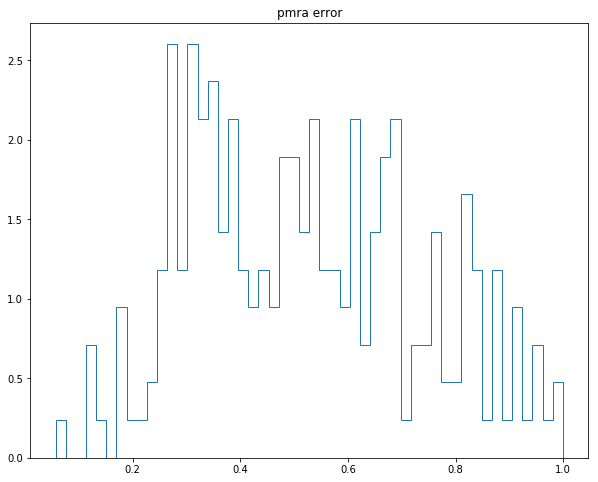

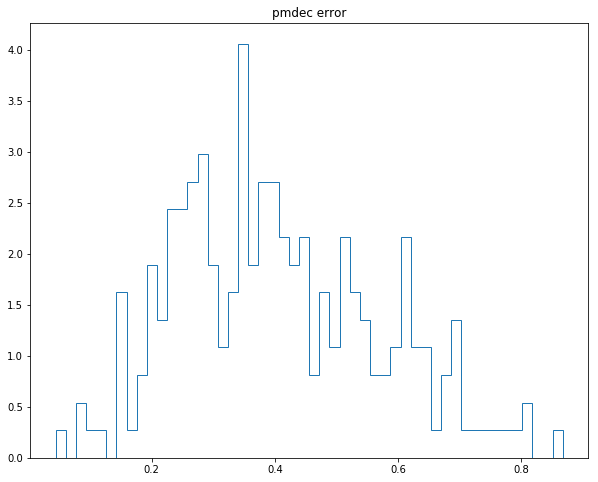

In [10]:
plt.figure(figsize=(10,8))
plt.title('pmra error')
plt.hist(pmra_DB_error[clust_indx].as_matrix(), normed=True, histtype='step', bins=50)

plt.figure(figsize=(10,8))
plt.title('pmdec error')
plt.hist(pmdec_DB_error[clust_indx].as_matrix(), normed=True, histtype='step', bins=50)

In [11]:
pmdec_DB_error.mean()

pmdec_error    0.375022
dtype: float64

In [9]:
print(stats.ks_2samp(QI_c_pmra_n, QI_c_pmra_DB))
print(stats.ks_2samp(QI_c_pmdec_n, QI_c_pmdec_DB))


Ks_2sampResult(statistic=0.52, pvalue=0.00012581310062176866)
Ks_2sampResult(statistic=0.45999999999999996, pvalue=0.0010311528948847857)


In [10]:
print(stats.ks_2samp(QI_c_ra_n, QI_c_ra_DB))
print(stats.ks_2samp(QI_c_dec_n, QI_c_dec_DB))


Ks_2sampResult(statistic=0.22000000000000003, pvalue=0.3520517984336835)
Ks_2sampResult(statistic=0.24000000000000005, pvalue=0.25420229085981283)


In [11]:
print(stats.ks_2samp(QII_c_pmra_n, QII_c_pmra_DB))
print(stats.ks_2samp(QII_c_pmdec_n, QII_c_pmdec_DB))

Ks_2sampResult(statistic=0.48, pvalue=0.0005262844755844563)
Ks_2sampResult(statistic=0.18, pvalue=0.6081854594513992)


In [12]:
print(stats.ks_2samp(QII_c_ra_n, QII_c_ra_DB))
print(stats.ks_2samp(QII_c_dec_n, QII_c_dec_DB))

Ks_2sampResult(statistic=0.33999999999999997, pvalue=0.03198221618850476)
Ks_2sampResult(statistic=0.16000000000000003, pvalue=0.7495767739472486)


In [13]:
print(stats.ks_2samp(QIII_c_pmra_n, QIII_c_pmra_DB))
print(stats.ks_2samp(QIII_c_pmdec_n, QIII_c_pmdec_DB))

Ks_2sampResult(statistic=0.36000000000000004, pvalue=0.01938147353382979)
Ks_2sampResult(statistic=0.27999999999999997, pvalue=0.12100522857582245)


In [14]:
print(stats.ks_2samp(QIII_c_ra_n, QIII_c_ra_DB))
print(stats.ks_2samp(QIII_c_dec_n, QIII_c_dec_DB))

Ks_2sampResult(statistic=0.4, pvalue=0.0065320756426358074)
Ks_2sampResult(statistic=0.29999999999999993, pvalue=0.07991700872413686)


In [15]:
print(stats.ks_2samp(QIV_c_pmra_n, QIV_c_pmra_DB))
print(stats.ks_2samp(QIV_c_pmdec_n, QIV_c_pmdec_DB))

Ks_2sampResult(statistic=0.52, pvalue=0.00012581310062176866)
Ks_2sampResult(statistic=0.18000000000000002, pvalue=0.608185459451399)


In [16]:
print(stats.ks_2samp(QIV_c_ra_n, QIV_c_ra_DB))
print(stats.ks_2samp(QIV_c_dec_n, QIV_c_dec_DB))

Ks_2sampResult(statistic=0.21999999999999997, pvalue=0.35205179843368384)
Ks_2sampResult(statistic=0.3, pvalue=0.07991700872413675)


In [35]:
coord_ra_dec.ra.deg[0]

13.188499999999998

In [ ]:
shape(x)
shape(y)

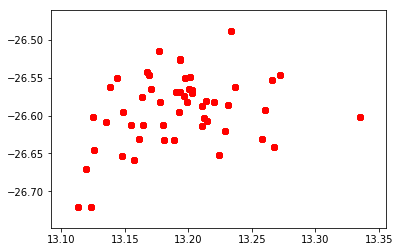

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#x = np.arange(10)
#ys = [i+x+(i*x)**2 for i in range(10)]

x = GlobClust_Log_ra[giants_indx]
ys = GlobClust_Log_dec[giants_indx]

#colors = cm.rainbow(np.linspace(0, 1, len(ys)))
#for y, c in zip(ys, colors):
#    plt.scatter(x, y, color=c)
    
colors = iter(cm.rainbow(np.linspace(0, 1, len(ys))))
for y in ys:
    plt.scatter(x, ys, color=next(colors))
    
#colors = itertools.cycle(["r", "b", "g"])
#for y in ys:
#    plt.scatter(x, y, color=next(colors))

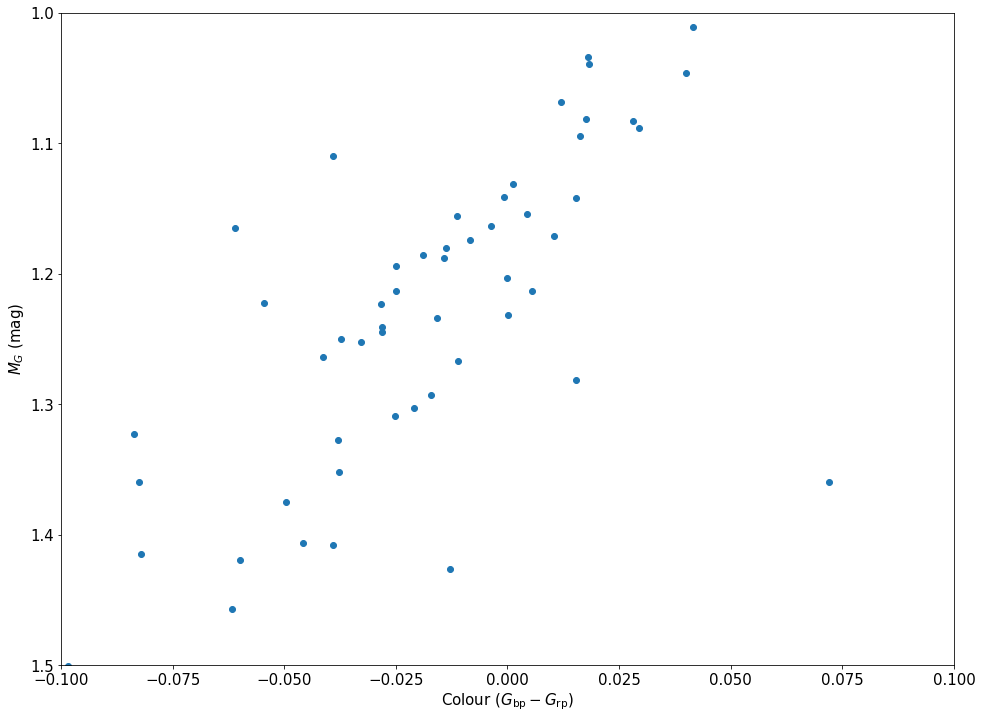

In [10]:
fig=plt.figure(figsize=(16,12))
#plt.hexbin(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, gridsize=500,bins='log',cmap='gist_yarg')#, extent=[-0.5,0.5,  0,2.5])
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M)#, gridsize=250,bins='log', extent=[-0.5,0.5,  0,2.5])
#plt.gca().set_xlim([-0.5,0.5])
#plt.gca().set_ylim([0,3])
plt.gca().set_xlim([-0.1,0.1])
plt.gca().set_ylim([1,1.5])
#plt.scatter(x=rpbp_DB, y=M_DB, c='red', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel(r'$\mathrm{Colour}\ (G_{\mathrm{bp}}-G_{\mathrm{rp}}$)', fontsize=15)
plt.ylabel(r'$M_G\ (\mathrm{mag})$', fontsize=15)
#plt.xlim(-1,3.5)
#plt.ylim(-8,6.25)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
#plt.show()
#plt.savefig('NGC288_CMD_paper1.pdf', bbox_inches='tight')

In [11]:
colors
shape(GlobClust_Log_ra[parallax_indx][giants_indx])

NameError: name 'giants_indx' is not defined

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



"plt.figure(figsize=(12,10))\ncolors = iter(cm.rainbow(np.linspace(0, 1, len(GlobClust_Log_ra[giants_indx]))))\nfor y in ys:\n    plt.scatter(GlobClust_Log_ra[giants_indx], GlobClust_Log_dec[giants_indx], color=next(colors))\n#plt.scatter(GlobClust_Log_ra[giants_indx], GlobClust_Log_dec[giants_indx])\ncircle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)\nplt.gca().add_artist(circle2)\nplt.legend()"

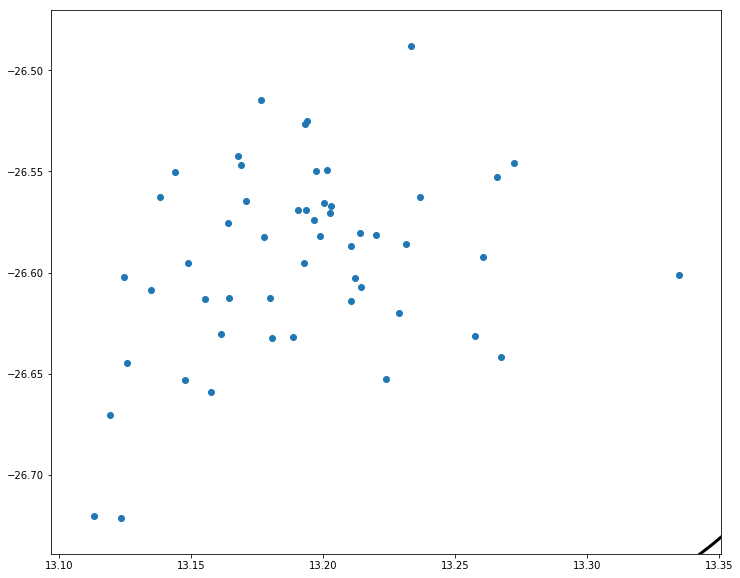

In [12]:
giants_indx = (GlobClust_Log_rpbp > -0.1) * (GlobClust_Log_rpbp < 0.1) *\
              (GlobClust_Log_M > 1) * (GlobClust_Log_M < 1.5)
    
plt.figure(figsize=(12,10))
plt.scatter(GlobClust_Log_ra[giants_indx], GlobClust_Log_dec[giants_indx])
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
plt.gca().add_artist(circle2)


#GlobClust_Log_rpbp, y=GlobClust_Log_M

#plt.gca().set_xlim([-0.5,0.5])
#plt.gca().set_ylim([0,3])

'''plt.figure(figsize=(12,10))
colors = iter(cm.rainbow(np.linspace(0, 1, len(GlobClust_Log_ra[giants_indx]))))
for y in ys:
    plt.scatter(GlobClust_Log_ra[giants_indx], GlobClust_Log_dec[giants_indx], color=next(colors))
#plt.scatter(GlobClust_Log_ra[giants_indx], GlobClust_Log_dec[giants_indx])
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=3)
plt.gca().add_artist(circle2)
plt.legend()'''

In [7]:
tidal_indx2

#ra_dec = ra_dec[['ra', 'dec']]
#ra_dec_rot_n
#ra_dec
#Rot.dot(ra_dec)

angle=theta

rx=ra_n[tidal_indx2]*np.cos(angle)+dec_n[tidal_indx2]*np.sin(angle)
ry=dec_n[tidal_indx2]*np.cos(angle)-ra_n[tidal_indx2]*np.sin(angle)
rx
ry
#rvx=vx*np.cos(angle)+vy*np.sin(angle)
#rvy=vy*np.cos(angle)-vx*np.sin(angle)

NameError: name 'theta' is not defined

[[ 0.90630779  0.42261826]
 [-0.42261826  0.90630779]]


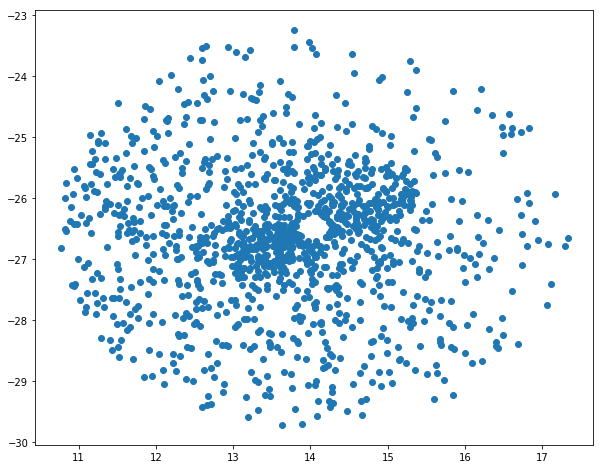

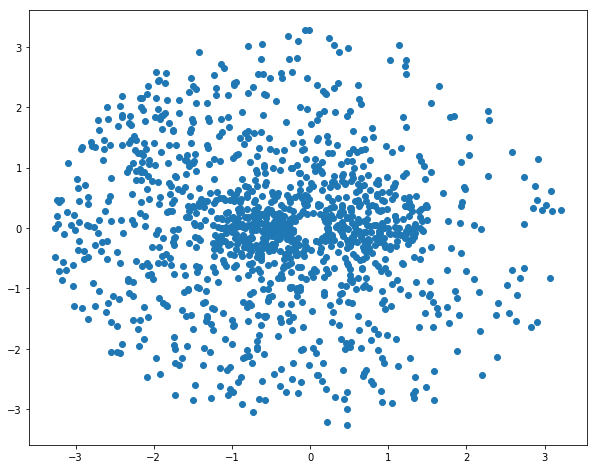

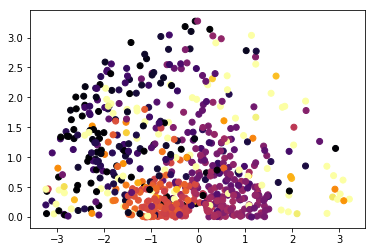

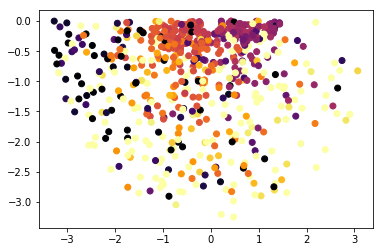

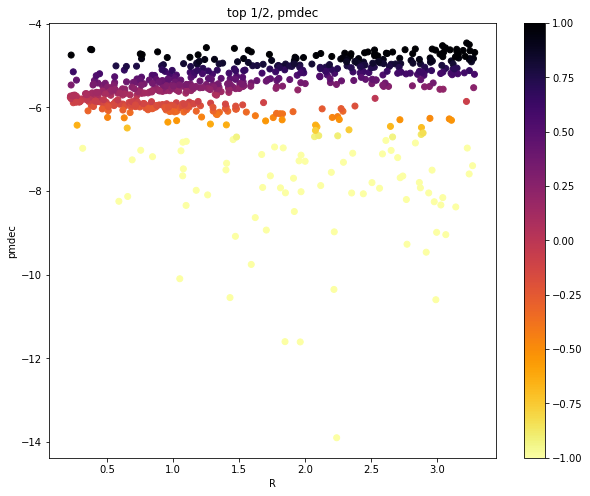

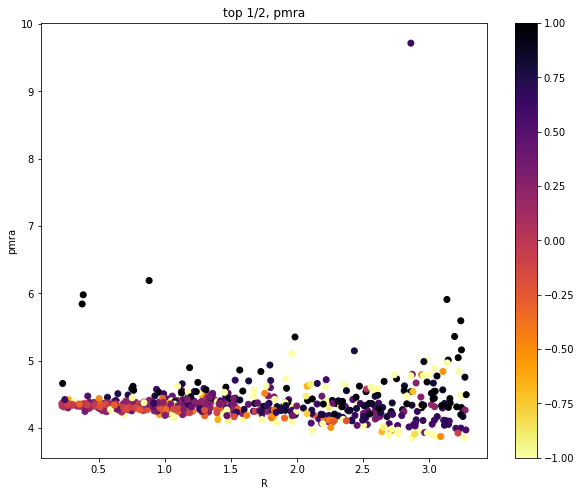

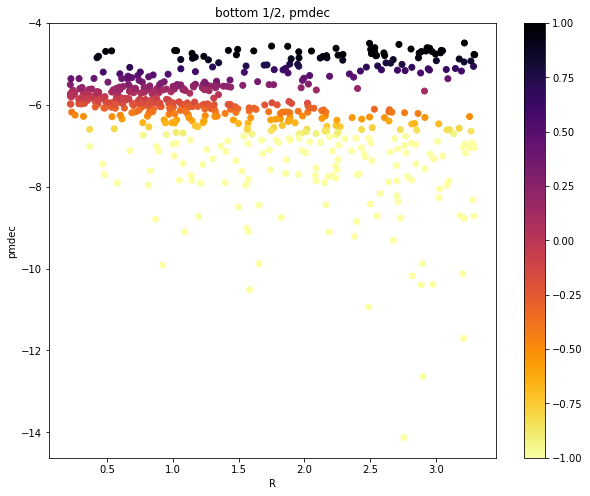

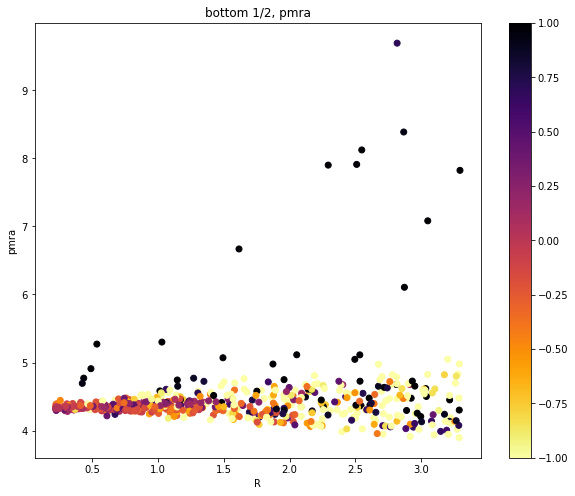

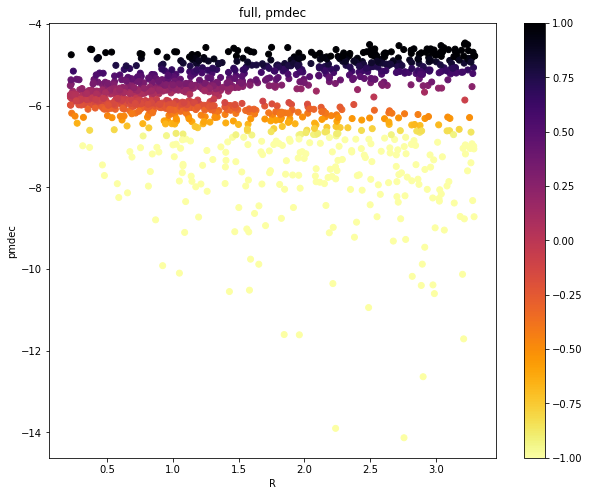

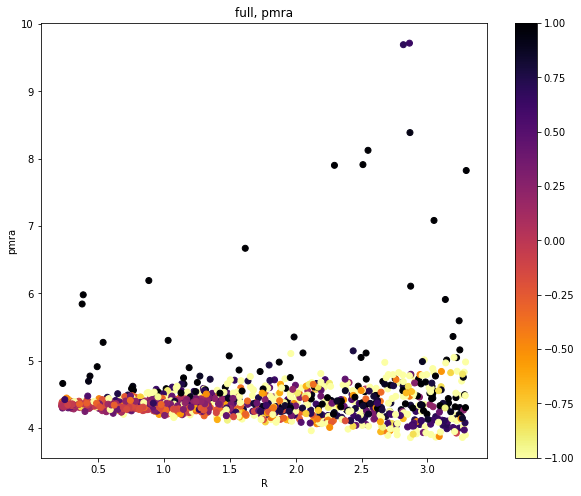

In [172]:
tidal_indx2 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15) *\
    (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)

theta = np.radians(-25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

ra_dec = pd.DataFrame({'ra': ra_n[tidal_indx2]-coord_ra_dec.ra.deg-0.85, 'dec': dec_n[tidal_indx2]-coord_ra_dec.dec.deg-0.1})
#ra_dec = ra_dec[['ra', 'dec']]
shape(ra_dec)
#ra_dec.T
ra_dec_rot_n=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2])

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_n.loc[:,1], ra_dec_rot_n.loc[:,0])

top_indx_n = (ra_dec_rot_n.loc[:,0] > 0)
bot_indx_n = (ra_dec_rot_n.loc[:,0] < 0)

fig=plt.figure()
plt.scatter(ra_dec_rot_n.loc[:,1][top_indx_n], ra_dec_rot_n.loc[:,0][top_indx_n], c=pmdec_n_norm[tidal_indx2][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure()
plt.scatter(ra_dec_rot_n.loc[:,1][bot_indx_n], ra_dec_rot_n.loc[:,0][bot_indx_n], c=pmdec_n_norm[tidal_indx2][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)


R_clust_n = np.sqrt((np.fabs(ra_dec_rot_n.loc[:,1]))**2+(np.fabs(ra_dec_rot_n.loc[:,0])**2))

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmdec_n[tidal_indx2][top_indx_n], c=pmdec_n_norm[tidal_indx2][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmra_n[tidal_indx2][top_indx_n], c=pmdec_n_norm[tidal_indx2][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmdec_n[tidal_indx2][bot_indx_n], c=pmdec_n_norm[tidal_indx2][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmra_n[tidal_indx2][bot_indx_n], c=pmdec_n_norm[tidal_indx2][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmdec_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmra_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')




In [ ]:
ra_dec

[[ 0.90630779  0.42261826]
 [-0.42261826  0.90630779]]


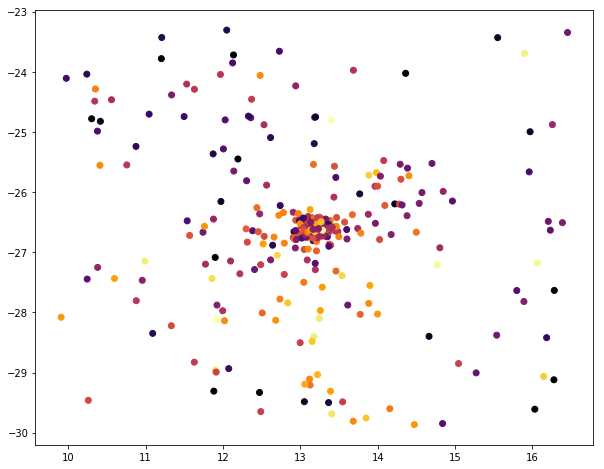

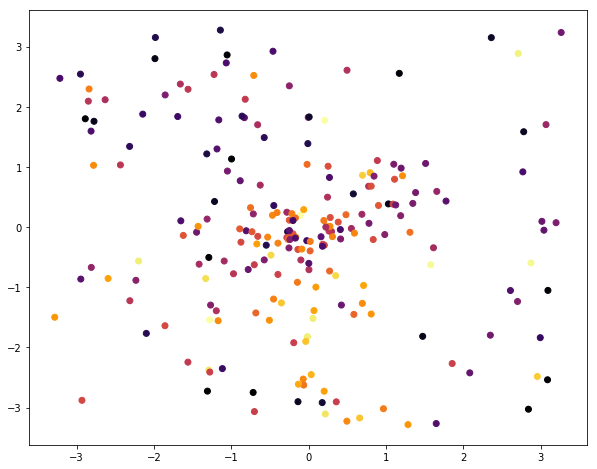

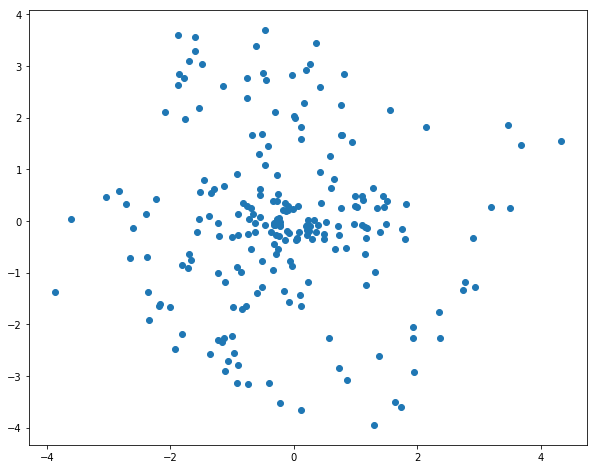

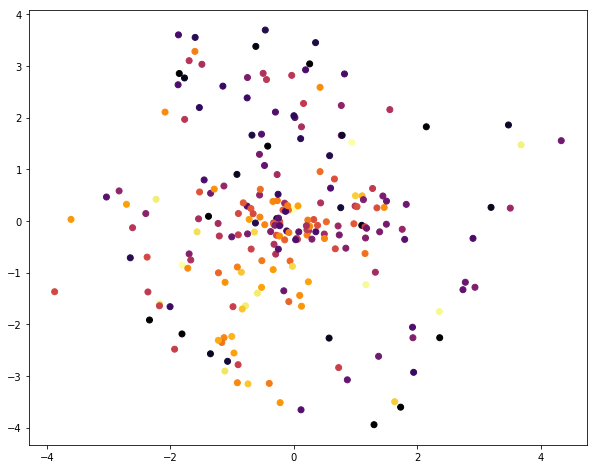

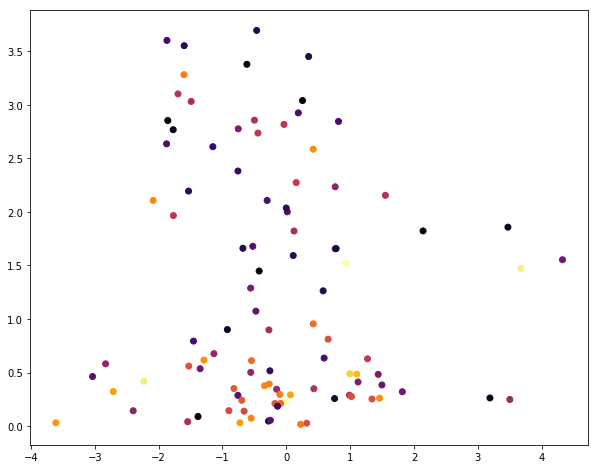

...

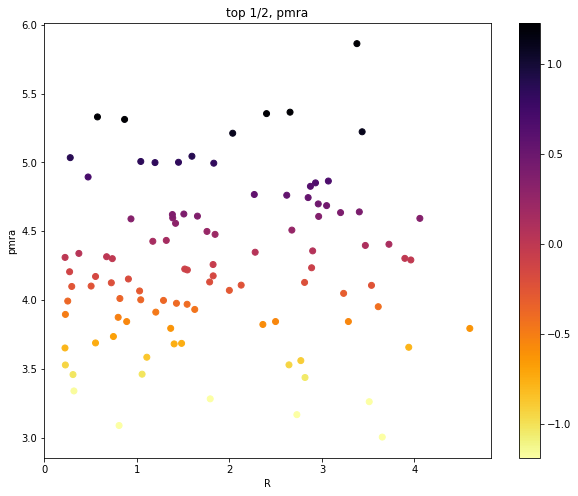

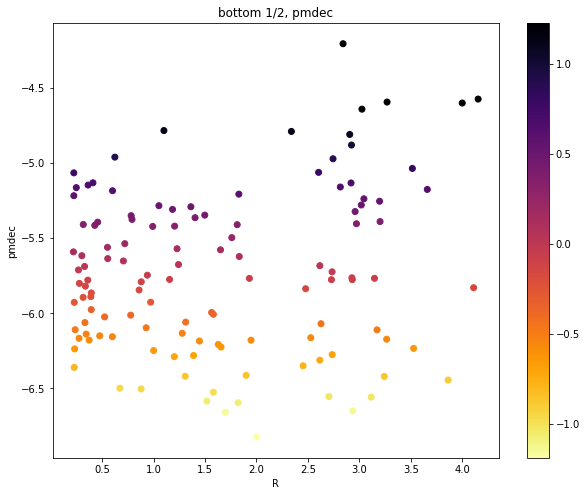

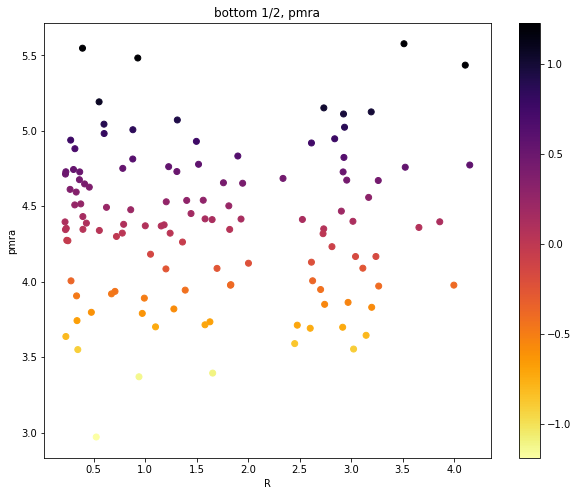

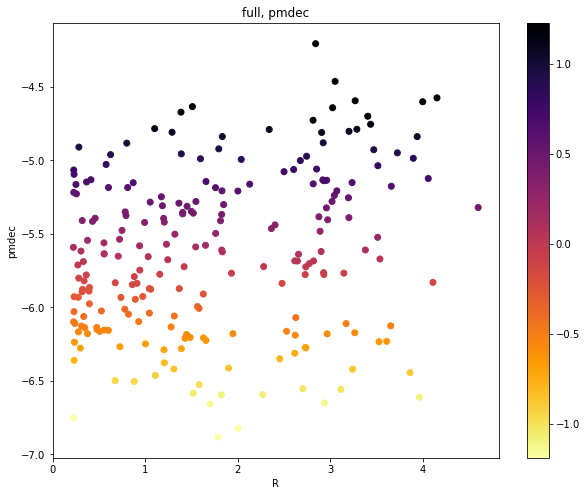

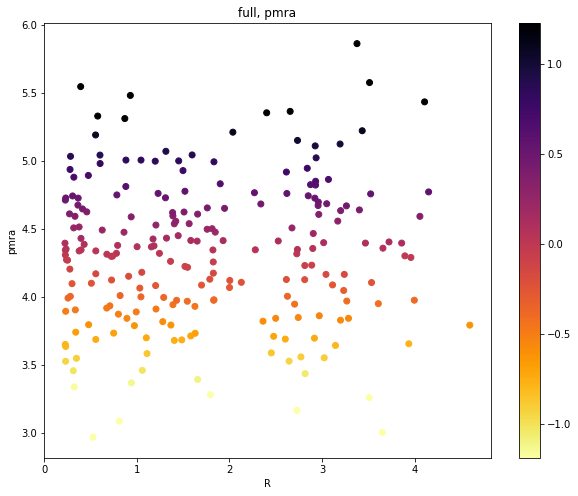

In [173]:
pmra_DB_norm = (pmra_DB-pmra_DB.mean())#/(pmra_DB.mean())
pmdec_DB_norm = (pmdec_DB-pmdec_DB.mean())#/(pmdec_DB.mean())

theta = np.radians(-25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

ra_DB_c = ra_DB[clust_indx]-coord_ra_dec.ra.deg
dec_DB_c = dec_DB[clust_indx]-coord_ra_dec.dec.deg

#ra_DB_c = ra_DB-coord_ra_dec.ra.deg
#dec_DB_c = dec_DB-coord_ra_dec.dec.deg

ra_dec = dec_DB_c.join(ra_DB_c)#pd.DataFrame({'ra': ra_DB-coord_ra_dec.ra.deg, 'dec': dec_DB-coord_ra_dec.dec.deg})
shape(ra_dec)
#ra_dec.T
ra_dec_rot_DB=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

plt.figure(figsize=(10,8))
#plt.scatter(ra_dec_rot.loc[:,1], ra_dec_rot.loc[:,0], c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)

plt.figure(figsize=(10,8))
#plt.scatter(ra_DB_c, dec_DB_c)#, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(ra_DB_c, dec_DB_c, c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1)

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0],)
#plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0], c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)

top_indx_DB = (ra_dec_rot_DB.loc[:,0] > 0)
bot_indx_DB = (ra_dec_rot_DB.loc[:,0] < 0)

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1][top_indx_DB], ra_dec_rot_DB.loc[:,0][top_indx_DB], c=pmdec_DB_norm[clust_indx][top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(ra_dec_rot_DB.loc[:,1][top_indx_DB], ra_dec_rot_DB.loc[:,0][top_indx_DB], c=pmdec_DB_norm[top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1][bot_indx_DB], ra_dec_rot_DB.loc[:,0][bot_indx_DB], c=pmdec_DB_norm[clust_indx][bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(ra_dec_rot_DB.loc[:,1][bot_indx_DB], ra_dec_rot_DB.loc[:,0][bot_indx_DB], c=pmdec_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)


R_clust_DB = np.sqrt((np.fabs(ra_dec_rot_DB.loc[:,1]))**2+(np.fabs(ra_dec_rot_DB.loc[:,0])**2))

plt.figure(figsize=(10,8))
sc=plt.scatter(R_clust_DB[top_indx_DB], pmdec_DB[clust_indx][top_indx_DB], c=pmdec_DB_norm[clust_indx][top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#sc=plt.scatter(R_clust_DB[top_indx_DB], pmdec_DB[top_indx_DB], c=pmdec_DB_norm[top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[top_indx],pmdec_DB[clust_indx][top_indx].as_matrix(), 
#                   yerr=pmdec_error_DB[clust_indx][top_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')


plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[top_indx_DB], pmra_DB[clust_indx][top_indx_DB], c=pmra_DB_norm[clust_indx][top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[top_indx_DB], pmra_DB[top_indx_DB], c=pmra_DB_norm[top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[top_indx],pmra_DB[clust_indx][top_indx].as_matrix(), 
#                   yerr=pmra_error_DB[clust_indx][top_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[bot_indx_DB], pmdec_DB[clust_indx][bot_indx_DB], c=pmdec_DB_norm[clust_indx][bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[bot_indx_DB], pmdec_DB[bot_indx_DB], c=pmdec_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[bot_indx],pmdec_DB[clust_indx][bot_indx].as_matrix(), 
#                   yerr=pmdec_error_DB[clust_indx][bot_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][bot_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[bot_indx_DB], pmra_DB[clust_indx][bot_indx_DB], c=pmra_DB_norm[clust_indx][bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[bot_indx_DB], pmra_DB[bot_indx_DB], c=pmra_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[bot_indx],pmra_DB[clust_indx][bot_indx].as_matrix(), 
#                   yerr=pmra_error_DB[clust_indx][bot_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][bot_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB, pmdec_DB[clust_indx], c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(R_clust_DB, pmdec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust,pmdec_DB[clust_indx].as_matrix(), yerr=pmdec_error_DB[clust_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
#plt.scatter(R_clust_DB, pmra_DB, c=pmra_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(R_clust_DB, pmra_DB[clust_indx], c=pmra_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust,pmra_DB[clust_indx].as_matrix(), yerr=pmra_error_DB[clust_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

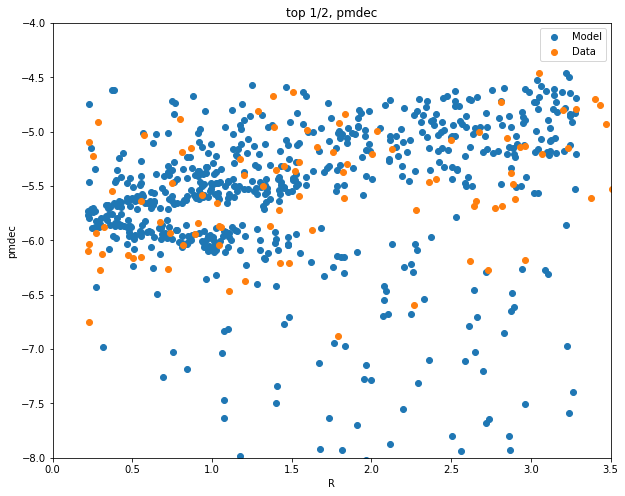

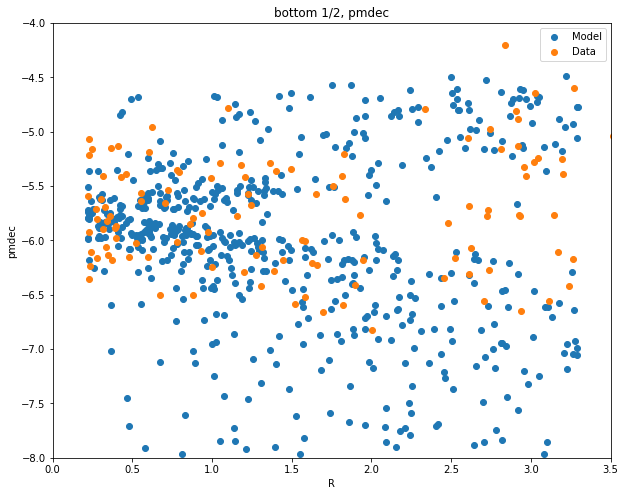

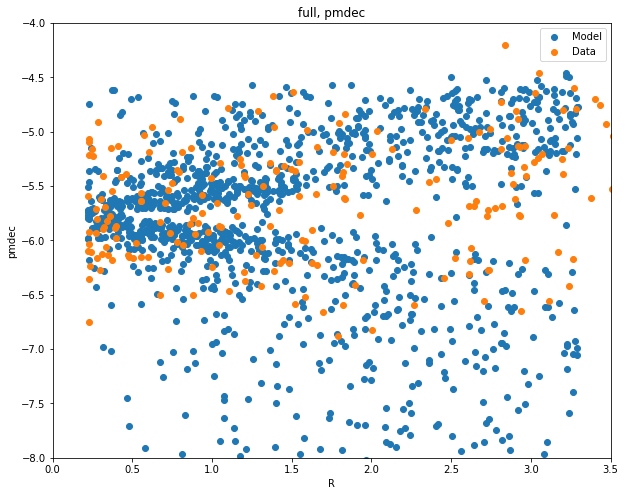

In [174]:
plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmdec_n[tidal_indx2][top_indx_n],label='Model', marker='o')
plt.scatter(R_clust_DB[top_indx_DB], pmdec_DB[clust_indx][top_indx_DB],label='Data', marker='o')
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
plt.gca().set_xlim([0,3.5])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmdec_n[tidal_indx2][bot_indx_n],label='Model', marker='o')
plt.scatter(R_clust_DB[bot_indx_DB], pmdec_DB[clust_indx][bot_indx_DB],label='Data', marker='o')
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
plt.gca().set_xlim([0,3.5])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmdec_n[tidal_indx2],label='Model', marker='o')
plt.scatter(R_clust_DB, pmdec_DB[clust_indx],label='Data', marker='o')
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
plt.gca().set_xlim([0,3.5])
plt.show()

In [165]:
pmdec_n_norm_rot
#pmra_pmdec_rot_n
ra_n[tidal_indx_15]-coord_ra_dec.ra.deg-0.85
np.sqrt((np.fabs(ra_dec_rot_n.loc[:,1].as_matrix()-coord_ra_dec.ra.deg))**2+\
                       (np.fabs(ra_dec_rot_n.loc[:,0].as_matrix()-coord_ra_dec.dec.deg)**2)) <= GlobClust_Log_r_c[0]/60
#GlobClust_Log_r_c[0]/60
core_indx2.sum()
#core_indx.sum()
pmra_pmdec_norm_rot_n.loc[:,0]
shape(ra_dec_rot_n)

(5558, 2)

[[ 0.90630779  0.42261826]
 [-0.42261826  0.90630779]]
[[ 0.90630779 -0.42261826]
 [ 0.42261826  0.90630779]]
[[ 0.90630779 -0.42261826]
 [ 0.42261826  0.90630779]]
[[ 0.90630779  0.42261826]
 [-0.42261826  0.90630779]]
/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



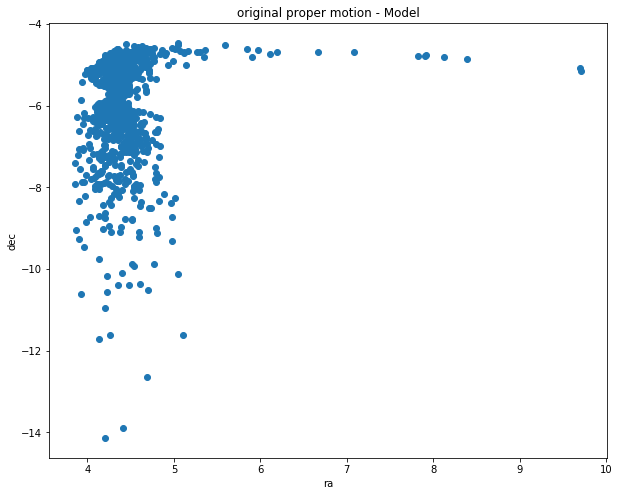

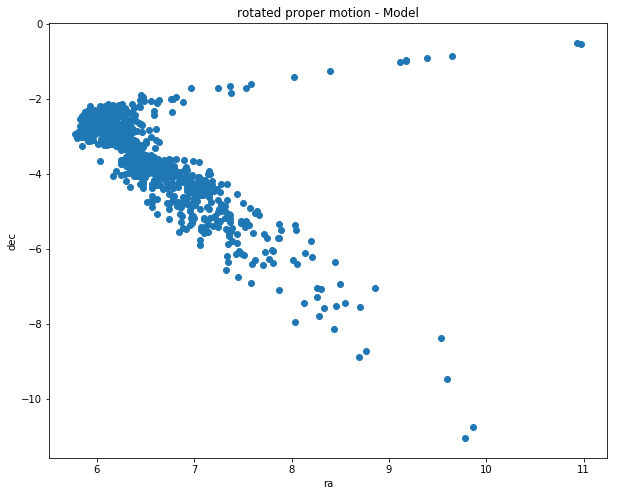

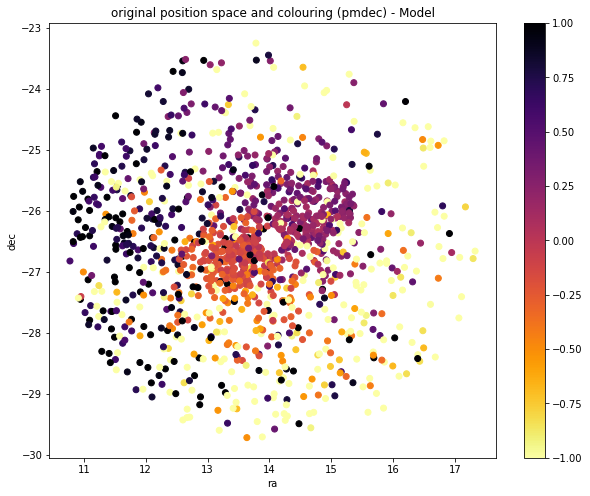

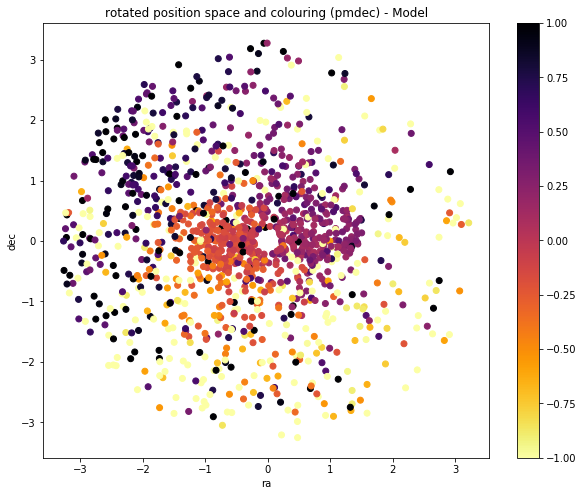

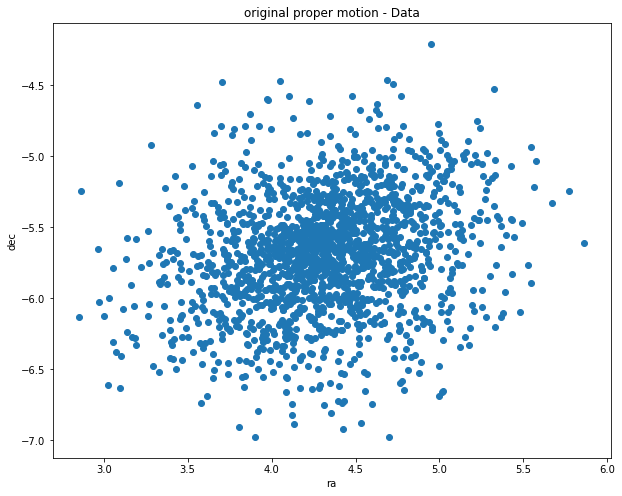

...

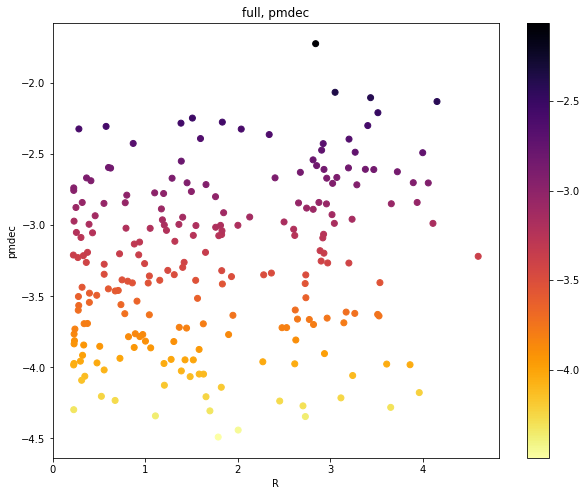

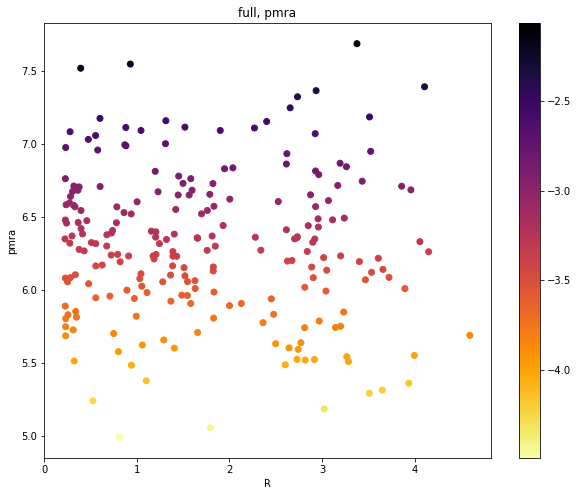

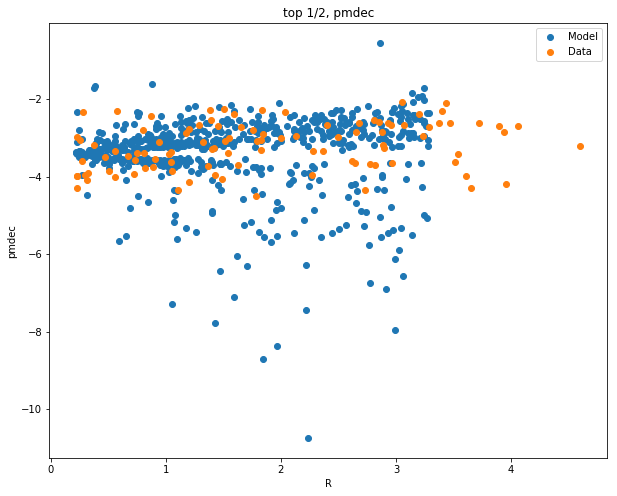

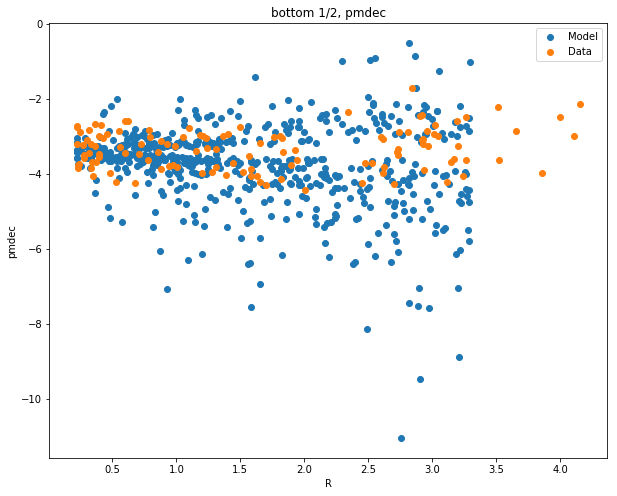

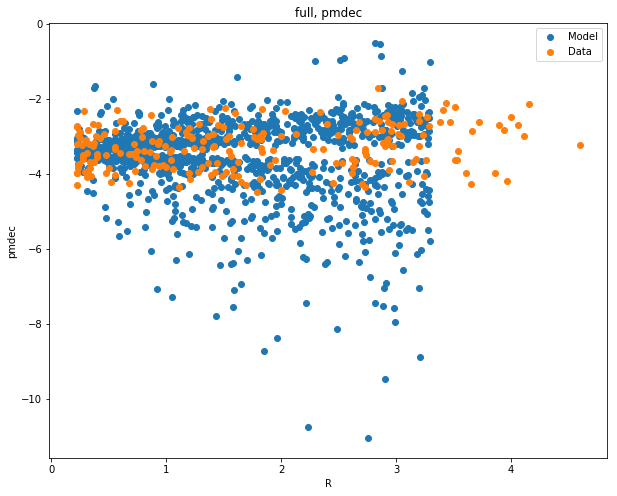

In [175]:
#tidal_indx2 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
#                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15) *\
#    (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
#                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)


theta = np.radians(-25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

ra_dec = pd.DataFrame({'ra': ra_n[tidal_indx2]-coord_ra_dec.ra.deg-0.85, 'dec': dec_n[tidal_indx2]-coord_ra_dec.dec.deg-0.1})
#ra_dec = ra_dec[['ra', 'dec']]
shape(ra_dec)
#ra_dec.T
ra_dec_rot_n=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

theta = np.radians(25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

pmra_pmdec = pd.DataFrame({'pmra': pmra_n[tidal_indx2], 'pmdec': pmdec_n[tidal_indx2]})
shape(pmra_pmdec)
pmra_pmdec_rot_n=pmra_pmdec.dot(Rot)

pmra_pmdec_norm = pd.DataFrame({'pmra_norm': pmra_n_norm[tidal_indx2], 'pmdec_norm': pmdec_n_norm[tidal_indx2]})
shape(pmra_pmdec_norm)
pmra_pmdec_norm_rot_n=pmra_pmdec_norm.dot(Rot)

#pmra_n_norm_rot = pmra_pmdec_rot_n.loc[:,1]-pmra_pmdec_rot_n.loc[:,1][core_indx2].mean()
#pmdec_n_norm_rot = pmra_pmdec_rot_n.loc[:,0]-pmra_pmdec_rot_n.loc[:,0][core_indx2].mean()

fig=plt.figure(figsize=(10,8))
plt.scatter(pmra_n[tidal_indx2], pmdec_n[tidal_indx2])
plt.title('original proper motion - Model')
plt.xlabel('ra')
plt.ylabel('dec')

fig=plt.figure(figsize=(10,8))
plt.scatter(pmra_pmdec_rot_n.loc[:,1], pmra_pmdec_rot_n.loc[:,0])
plt.title('rotated proper motion - Model')
plt.xlabel('ra')
plt.ylabel('dec')


fig=plt.figure(figsize=(10,8))
plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('original position space and colouring (pmdec) - Model')
plt.ylabel('dec')
plt.xlabel('ra')

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_n.loc[:,1], ra_dec_rot_n.loc[:,0], c=pmra_pmdec_norm_rot_n.loc[:,0], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('rotated position space and colouring (pmdec) - Model')
plt.ylabel('dec')
plt.xlabel('ra')



#theta = np.radians(-25)
#c, s = np.cos(theta), np.sin(theta)
#Rot = np.array(((c,-s), (s, c)))
#print(Rot) 

#ra_dec = pd.DataFrame({'ra': ra_n[tidal_indx2]-coord_ra_dec.ra.deg-0.85, 'dec': dec_n[tidal_indx2]-coord_ra_dec.dec.deg-0.1})
##ra_dec = ra_dec[['ra', 'dec']]
#shape(ra_dec)
##ra_dec.T
#ra_dec_rot_n=ra_dec.dot(Rot)
##np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

theta = np.radians(25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

pmra_DB_c = pmra_DB[clust_indx]
pmdec_DB_c = pmdec_DB[clust_indx]

pmra_DB_norm_c = pmra_DB_norm[clust_indx]
pmdec_DB_norm_c = pmdec_DB_norm[clust_indx]

pmra_pmdec = pmdec_DB_c.join(pmra_DB_c)
shape(pmra_pmdec)
pmra_pmdec_rot_DB=pmra_pmdec.dot(Rot)

pmra_pmdec_norm = pmdec_DB_norm_c.join(pmra_DB_norm_c)
shape(pmra_pmdec_norm)
pmra_pmdec_norm_rot_DB=pmra_pmdec_norm.dot(Rot)

#pmra_n_norm_rot = pmra_pmdec_rot_n.loc[:,1]-pmra_pmdec_rot_n.loc[:,1][core_indx2].mean()
#pmdec_n_norm_rot = pmra_pmdec_rot_n.loc[:,0]-pmra_pmdec_rot_n.loc[:,0][core_indx2].mean()

fig=plt.figure(figsize=(10,8))
plt.scatter(pmra_DB, pmdec_DB)
plt.title('original proper motion - Data')
plt.xlabel('ra')
plt.ylabel('dec')

fig=plt.figure(figsize=(10,8))
plt.scatter(pmra_pmdec_rot_DB.loc[:,1], pmra_pmdec_rot_DB.loc[:,0])
plt.title('rotated proper motion - Data')
plt.xlabel('ra')
plt.ylabel('dec')

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('original position space and colouring (pmdec) - Data')
plt.ylabel('dec')
plt.xlabel('ra')

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0], c=pmra_pmdec_norm_rot_DB.loc[:,0], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('rotated position space and colouring (pmdec) - Data')
plt.ylabel('dec')
plt.xlabel('ra')


#fig=plt.figure(figsize=(10,8))
#plt.scatter(ra_n[tidal_indx_15], dec_n[tidal_indx_15], c=pmdec_n_norm[tidal_indx_15], cmap='inferno_r', vmin=-1, vmax=1)
#plt.colorbar()

#fig=plt.figure(figsize=(10,8))
#plt.scatter(ra_dec_rot_n.loc[:,1], ra_dec_rot_n.loc[:,0], c=pmdec_n_norm[tidal_indx_15], cmap='inferno_r', vmin=-1, vmax=1)
#plt.colorbar()


top_indx_n = (ra_dec_rot_n.loc[:,0] > 0)
bot_indx_n = (ra_dec_rot_n.loc[:,0] < 0)

fig=plt.figure()
plt.scatter(ra_dec_rot_n.loc[:,1][top_indx_n], ra_dec_rot_n.loc[:,0][top_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure()
plt.scatter(ra_dec_rot_n.loc[:,1][bot_indx_n], ra_dec_rot_n.loc[:,0][bot_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)


R_clust_n = np.sqrt((np.fabs(ra_dec_rot_n.loc[:,1]))**2+(np.fabs(ra_dec_rot_n.loc[:,0])**2))

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmra_pmdec_norm_rot_n.loc[:,1][top_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,1][top_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmra_pmdec_norm_rot_n.loc[:,1][bot_indx_n], c=pmra_pmdec_norm_rot_n.loc[:,1][bot_indx_n], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmra_pmdec_norm_rot_n.loc[:,0], c=pmra_pmdec_norm_rot_n.loc[:,0], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmra_pmdec_norm_rot_n.loc[:,1], c=pmra_pmdec_norm_rot_n.loc[:,1], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')



pmra_DB_norm = (pmra_DB-pmra_DB.mean())#/(pmra_DB.mean())
pmdec_DB_norm = (pmdec_DB-pmdec_DB.mean())#/(pmdec_DB.mean())

theta = np.radians(-25)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

ra_DB_c = ra_DB[clust_indx]-coord_ra_dec.ra.deg
dec_DB_c = dec_DB[clust_indx]-coord_ra_dec.dec.deg

#ra_DB_c = ra_DB-coord_ra_dec.ra.deg
#dec_DB_c = dec_DB-coord_ra_dec.dec.deg

ra_dec = dec_DB_c.join(ra_DB_c)#pd.DataFrame({'ra': ra_DB-coord_ra_dec.ra.deg, 'dec': dec_DB-coord_ra_dec.dec.deg})
shape(ra_dec)
#ra_dec.T
ra_dec_rot_DB=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

plt.figure(figsize=(10,8))
#plt.scatter(ra_dec_rot.loc[:,1], ra_dec_rot.loc[:,0], c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r')#, vmin=-1, vmax=1)
plt.colorbar()

plt.figure(figsize=(10,8))
#plt.scatter(ra_DB_c, dec_DB_c)#, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(ra_DB_c, dec_DB_c, c=pmdec_DB_norm[clust_indx], cmap='inferno_r')#, vmin=-1, vmax=1)
plt.colorbar()

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0],)
#plt.colorbar()
#plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0], c=pmra_pmdec_rot_DB.loc[:,0], cmap='inferno_r')#, vmin=-1, vmax=1)
plt.colorbar()
#plt.scatter(ra_DB, dec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)

top_indx_DB = (ra_dec_rot_DB.loc[:,0] > 0)
bot_indx_DB = (ra_dec_rot_DB.loc[:,0] < 0)

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1][top_indx_DB], ra_dec_rot_DB.loc[:,0][top_indx_DB], c=pmra_pmdec_rot_DB.loc[:,0][top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
plt.colorbar()
#plt.scatter(ra_dec_rot_DB.loc[:,1][top_indx_DB], ra_dec_rot_DB.loc[:,0][top_indx_DB], c=pmdec_DB_norm[top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1][bot_indx_DB], ra_dec_rot_DB.loc[:,0][bot_indx_DB], c=pmra_pmdec_rot_DB.loc[:,0][bot_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
plt.colorbar()
#plt.scatter(ra_dec_rot_DB.loc[:,1][bot_indx_DB], ra_dec_rot_DB.loc[:,0][bot_indx_DB], c=pmdec_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)


R_clust_DB = np.sqrt((np.fabs(ra_dec_rot_DB.loc[:,1]))**2+(np.fabs(ra_dec_rot_DB.loc[:,0])**2))

plt.figure(figsize=(10,8))
sc=plt.scatter(R_clust_DB[top_indx_DB], pmra_pmdec_rot_DB.loc[:,0][top_indx_DB], c=pmra_pmdec_rot_DB.loc[:,0][top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#sc=plt.scatter(R_clust_DB[top_indx_DB], pmdec_DB[top_indx_DB], c=pmdec_DB_norm[top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[top_indx],pmdec_DB[clust_indx][top_indx].as_matrix(), 
#                   yerr=pmdec_error_DB[clust_indx][top_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')


plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[top_indx_DB],pmra_pmdec_rot_DB.loc[:,1][top_indx_DB], c=pmra_pmdec_rot_DB.loc[:,1][top_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[top_indx_DB], pmra_DB[top_indx_DB], c=pmra_DB_norm[top_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[top_indx],pmra_DB[clust_indx][top_indx].as_matrix(), 
#                   yerr=pmra_error_DB[clust_indx][top_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[bot_indx_DB], pmra_pmdec_rot_DB.loc[:,0][bot_indx_DB], c=pmra_pmdec_rot_DB.loc[:,0][bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[bot_indx_DB], pmdec_DB[bot_indx_DB], c=pmdec_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[bot_indx],pmdec_DB[clust_indx][bot_indx].as_matrix(), 
#                   yerr=pmdec_error_DB[clust_indx][bot_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][bot_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB[bot_indx_DB], pmra_pmdec_rot_DB.loc[:,1][bot_indx_DB], c=pmra_pmdec_rot_DB.loc[:,1][bot_indx_DB], cmap='inferno_r')#, vmin=-1, vmax=1)
#plt.scatter(R_clust_DB[bot_indx_DB], pmra_DB[bot_indx_DB], c=pmra_DB_norm[bot_indx_DB], cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust[bot_indx],pmra_DB[clust_indx][bot_indx].as_matrix(), 
#                   yerr=pmra_error_DB[clust_indx][bot_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][bot_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_DB, pmra_pmdec_rot_DB.loc[:,0], c=pmra_pmdec_rot_DB.loc[:,0], cmap='inferno_r')#, vmin=-1, vmax=1)
#plt.scatter(R_clust_DB, pmdec_DB, c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust,pmdec_DB[clust_indx].as_matrix(), yerr=pmdec_error_DB[clust_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmdec_colour = cb.to_rgba(pmdec_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmdec_colour)
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
#plt.scatter(R_clust_DB, pmra_DB, c=pmra_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(R_clust_DB, pmra_pmdec_rot_DB.loc[:,1], c=pmra_pmdec_rot_DB.loc[:,1], cmap='inferno_r')#, vmin=-1, vmax=1)
#a,b,c=plt.errorbar(R_clust,pmra_DB[clust_indx].as_matrix(), yerr=pmra_error_DB[clust_indx].as_matrix()[:,0], linestyle="None", zorder=1) #ecolor=pmdec_DB_norm,
plt.colorbar(sc)
#pmra_colour = cb.to_rgba(pmra_DB_norm[clust_indx][top_indx].as_matrix()[:,0])
#c[0].set_color(pmra_colour)
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')


plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[top_indx_n], pmra_pmdec_rot_n.loc[:,0][top_indx_n],label='Model', marker='o')
plt.scatter(R_clust_DB[top_indx_DB], pmra_pmdec_rot_DB.loc[:,0][top_indx_DB],label='Data', marker='o')
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
#plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim([0,3.5])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n[bot_indx_n], pmra_pmdec_rot_n.loc[:,0][bot_indx_n],label='Model', marker='o')
plt.scatter(R_clust_DB[bot_indx_DB], pmra_pmdec_rot_DB.loc[:,0][bot_indx_DB],label='Data', marker='o')
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
#plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim([0,3.5])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n, pmra_pmdec_rot_n.loc[:,0],label='Model', marker='o')
plt.scatter(R_clust_DB, pmra_pmdec_rot_DB.loc[:,0],label='Data', marker='o')
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
#plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim([0,3.5])
plt.show()

In [50]:
print(ra_dec_rot_n.loc[14,1], ra_dec_rot_n.loc[14,0])
np.sqrt((np.fabs(ra_dec_rot_n.loc[:,1])**2)+(np.fabs(ra_dec_rot_n.loc[:,0])**2)) > 1

-2.8977260512452236 -0.5090212714814024


14        True
34        True
49       False
62       False
69        True
89        True
96        True
109      False
138       True
156       True
157       True
210      False
211      False
214       True
226       True
228       True
231      False
233      False
245       True
261       True
271      False
291      False
293      False
298       True
314      False
318       True
319      False
324       True
337      False
338       True
         ...  
18184     True
18194     True
18211     True
18217    False
18218     True
18223     True
18246    False
18248    False
18258    False
18286    False
18290     True
18292    False
18301     True
18303     True
18314     True
18315     True
18368    False
18382    False
18396     True
18419     True
18441    False
18460     True
18477     True
18489    False
18500     True
18548    False
18568     True
18572     True
18576     True
18591     True
Length: 1272, dtype: bool

In [11]:
shape(pmra_DB_norm[clust_indx][bar_indx_DB][top_indx_DB])
#shape(bar_indx_DB)
#shape(top_indx_DB)
#pmra_n_norm[tidal_indx2][bar_indx_n][top_indx_n].mean()
#ra_n[tidal_indx2][bar_indx_n]
#bar_indx_n.sum()


plt.scatter(ra_dec_rot_n.loc[:,1], ra_dec_rot_n.loc[:,0], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

bar_indx_n = (np.sqrt((np.fabs(ra_dec_rot_n.loc[:,1])**2)+(np.fabs(ra_dec_rot_n.loc[:,0])**2)) > 1.25)

plt.figure()
plt.scatter(ra_n[tidal_indx2][bar_indx_n], dec_n[tidal_indx2][bar_indx_n], c=pmdec_n_norm[tidal_indx2][bar_indx_n], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

plt.figure()
plt.scatter(ra_dec_rot_n.loc[:,1][bar_indx_n], ra_dec_rot_n.loc[:,0][bar_indx_n], c=pmdec_n_norm[tidal_indx2][bar_indx_n], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

NameError: name 'bar_indx_DB' is not defined

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

649
63


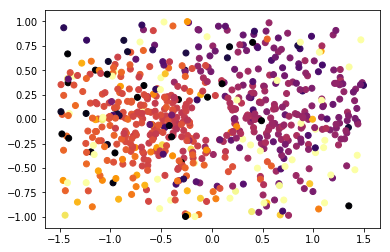

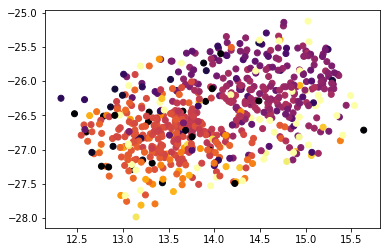

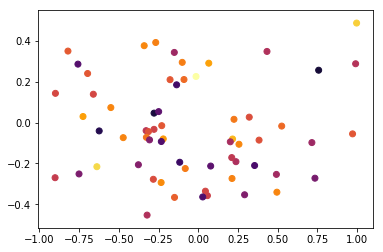

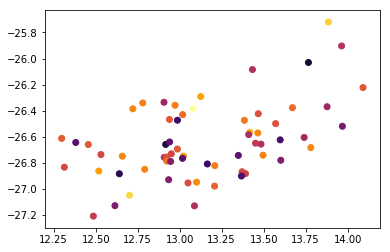

In [17]:
shape(bar_indx_n)
#shape(tidal_indx2)
#shape(top_indx_n)
shape(pmra_n_norm[tidal_indx2][top_indx_n][bar_indx_n])

bar_indx_n = (np.fabs(ra_dec_rot_n.loc[:,1]) < 1.5) * (np.fabs(ra_dec_rot_n.loc[:,0]) < 1)
print(bar_indx_n.sum())

plt.scatter(ra_dec_rot_n.loc[:,1][bar_indx_n], ra_dec_rot_n.loc[:,0][bar_indx_n], c=pmdec_n_norm[tidal_indx2][bar_indx_n], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

plt.figure()
plt.scatter(ra_n[tidal_indx2][bar_indx_n], dec_n[tidal_indx2][bar_indx_n], c=pmdec_n_norm[tidal_indx2][bar_indx_n], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)



bar_indx_DB = (np.fabs(ra_dec_rot_DB.loc[:,1]) < 1) * (np.fabs(ra_dec_rot_DB.loc[:,0]) < 0.5)
print(bar_indx_DB.sum())

plt.figure()
plt.scatter(ra_dec_rot_DB.loc[:,1][bar_indx_DB], ra_dec_rot_DB.loc[:,0][bar_indx_DB], c=pmdec_DB_norm[clust_indx][bar_indx_DB], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

plt.figure()
plt.scatter(ra_DB[clust_indx][bar_indx_DB], dec_DB[clust_indx][bar_indx_DB], c=pmdec_DB_norm[clust_indx][bar_indx_DB], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

#plt.figure()
#plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0], c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)

In [26]:
shape(ra_dec_rot_n.loc[:,1])
shape(bar_indx_n)
#ra_dec_rot_n.loc[:,1][tidal_indx2][bar_indx_n]
bar_indx_n

[True,
 False,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 False,
 True,
 True,
 True,
 True,
 False,
 True,
 False,
 False,
 True,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 False,
 False,
 T

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))



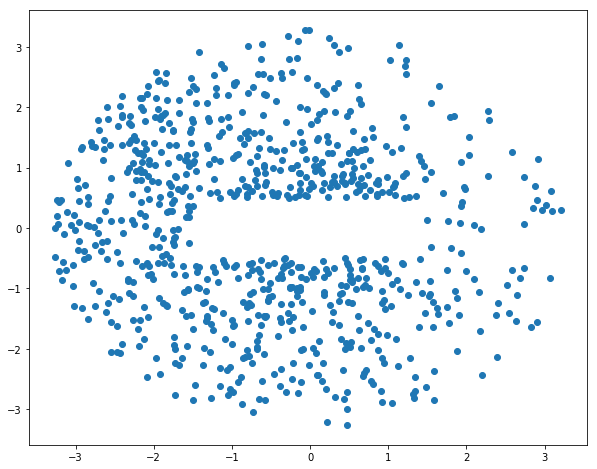

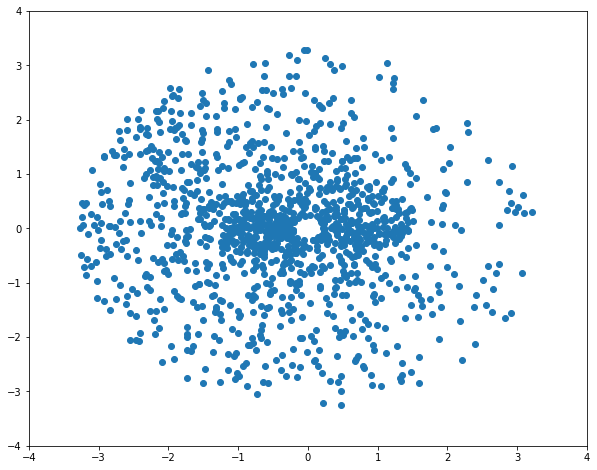

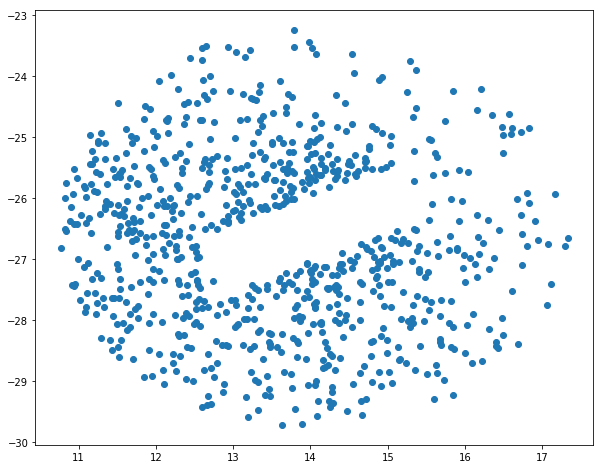

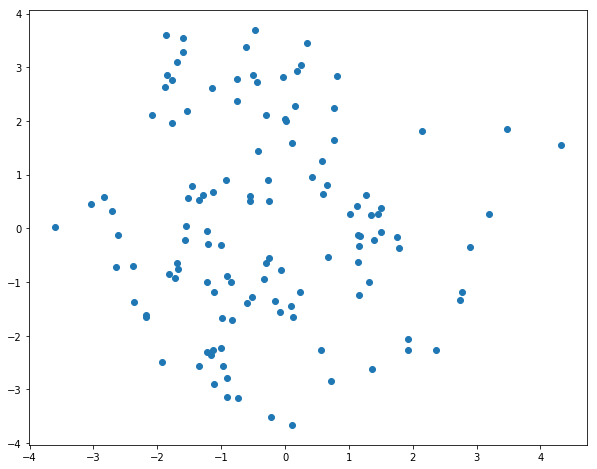

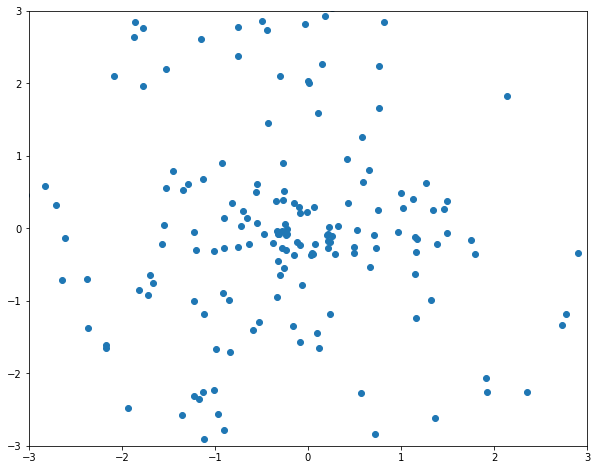

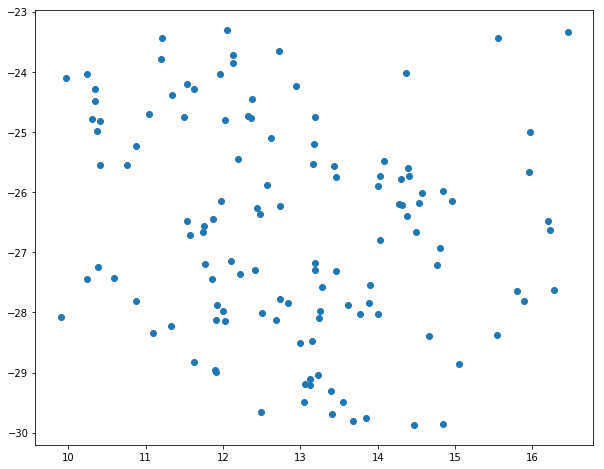

In [162]:
#bar_indx_n = (np.fabs(ra_dec_rot_n.loc[:,1]) > 1.5) * (np.fabs(ra_dec_rot_n.loc[:,0]) > 1)

#bar_indx_DB = (np.fabs(ra_dec_rot_DB.loc[:,1]) > 1) * (np.fabs(ra_dec_rot_DB.loc[:,0]) > 0.5)

#(GlobClust_Log_pmra[parallax_indx] > 2.5) * (GlobClust_Log_pmra[parallax_indx] < 6) *\
#        (GlobClust_Log_pmdec[parallax_indx] > -7.5) * (GlobClust_Log_pmdec[parallax_indx] < -3.5)

bar_indx_n = (ra_dec_rot_n.loc[:,1] < 1.5) * (ra_dec_rot_n.loc[:,1] > -1.5) *\
             (ra_dec_rot_n.loc[:,0] < 0.5) * (ra_dec_rot_n.loc[:,0] > -0.5)
bar_indx_n = [not i for i in bar_indx_n]
    
bar_indx_DB = (ra_dec_rot_DB.loc[:,1] < 1) * (ra_dec_rot_DB.loc[:,1] > -1) *\
              (ra_dec_rot_DB.loc[:,0] < 0.5) * (ra_dec_rot_DB.loc[:,0] > -0.5)
bar_indx_DB = [not i for i in bar_indx_DB]

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_n.loc[:,1][bar_indx_n], ra_dec_rot_n.loc[:,0][bar_indx_n], )
#plt.gca().set_xlim([-4,4])
#plt.gca().set_ylim([-4,4])

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_n.loc[:,1], ra_dec_rot_n.loc[:,0], )
plt.gca().set_xlim([-4,4])
plt.gca().set_ylim([-4,4])

plt.figure(figsize=(10,8))
plt.scatter(ra_n[tidal_indx2][bar_indx_n], dec_n[tidal_indx2][bar_indx_n], )
#plt.gca().set_xlim([11, 17])
#plt.gca().set_ylim([23, 30])


plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1][bar_indx_DB], ra_dec_rot_DB.loc[:,0][bar_indx_DB], )
#plt.gca().set_xlim([-3,3])
#plt.gca().set_ylim([-3,3])

plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_DB.loc[:,1], ra_dec_rot_DB.loc[:,0], )
plt.gca().set_xlim([-3,3])
plt.gca().set_ylim([-3,3])

plt.figure(figsize=(10,8))
plt.scatter(ra_DB[clust_indx][bar_indx_DB], dec_DB[clust_indx][bar_indx_DB], )
#plt.gca().set_xlim([11, 17])
#plt.gca().set_ylim([23, 30])

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.

pmra_n_mtop: 0.02823520116754957 
 pmdec_n_mtop: 0.024666571579102035 
 pmra_n_mbot: 0.1479916037372502 
 pmdec_n_mbot: -0.6811218294849145 

 pmra_DB_mtop: pmra    0.011758
dtype: flo

"pmra_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n].mean()\npmdec_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,1][top_indx_n].mean()\npmra_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n].mean()\npmdec_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,1][bot_indx_n].mean()\n\npmra_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,0][top_indx_DB].mean()\npmdec_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,1][top_indx_DB].mean()\npmra_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,0][bot_indx_DB].mean()\npmdec_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,1][bot_indx_DB].mean()\n\n\nfig=plt.figure(figsize=(10,8))\nplt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2],)# c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)\nplt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_rot_mtop, pmdec_n_rot_mtop, pmdec_n_rot_mtop, cmap='inferno_r', \n           angles='xy', scale_units='xy', scale=1., zorder=1)\nplt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmr

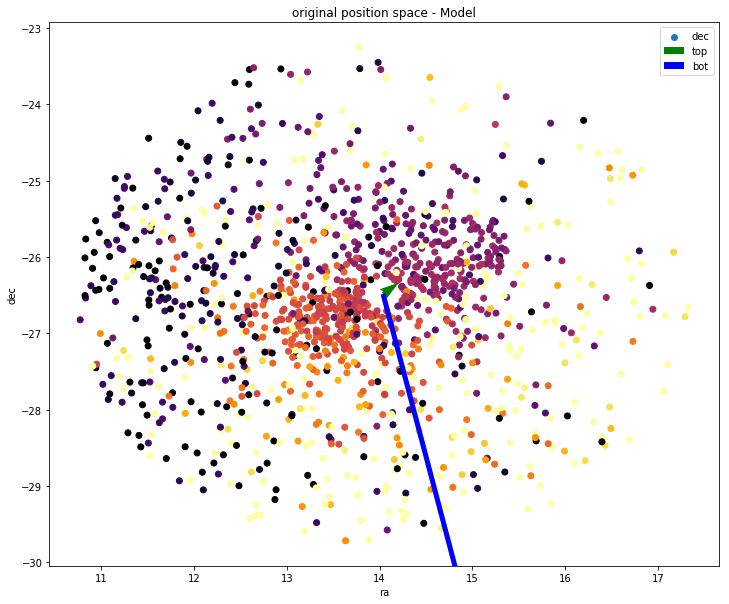

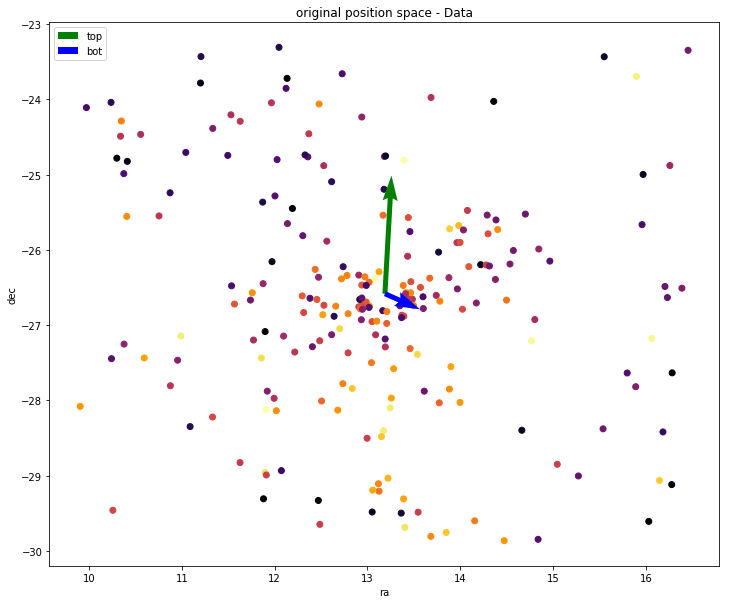

In [176]:
#===================
# Not Rotated
#===================

bar_indx_n = (ra_dec_rot_n.loc[:,1] < 1.5) * (ra_dec_rot_n.loc[:,1] > -1.5) *\
             (ra_dec_rot_n.loc[:,0] < 0.75) * (ra_dec_rot_n.loc[:,0] > -0.75)
bar_indx_n = [not i for i in bar_indx_n]

top_indx_n2 = (ra_dec_rot_n.loc[:,0][bar_indx_n] > 0)
bot_indx_n2 = (ra_dec_rot_n.loc[:,0][bar_indx_n] < 0)

    
bar_indx_DB = (ra_dec_rot_DB.loc[:,1] < 1) * (ra_dec_rot_DB.loc[:,1] > -1) *\
              (ra_dec_rot_DB.loc[:,0] < 0.5) * (ra_dec_rot_DB.loc[:,0] > -0.5)
bar_indx_DB = [not i for i in bar_indx_DB]

#top_indx_DB2 = (ra_dec_rot_n.loc[:,0][bar_indx_DB] > 0)
#bot_indx_DB2 = (ra_dec_rot_n.loc[:,0][bar_indx_DB] < 0)


pmra_n_mtop = pmra_n_norm[tidal_indx2][bar_indx_n][top_indx_n2].mean()
pmdec_n_mtop = pmdec_n_norm[tidal_indx2][bar_indx_n][top_indx_n2].mean()
pmra_n_mbot = pmra_n_norm[tidal_indx2][bar_indx_n][bot_indx_n2].mean()
pmdec_n_mbot = pmdec_n_norm[tidal_indx2][bar_indx_n][bot_indx_n2].mean()

#pmra_n_mtop = pmra_n_norm[tidal_indx2][top_indx_n].mean()
#pmdec_n_mtop = pmdec_n_norm[tidal_indx2][top_indx_n].mean()
#pmra_n_mbot = pmra_n_norm[tidal_indx2][bot_indx_n].mean()
#pmdec_n_mbot = pmdec_n_norm[tidal_indx2][bot_indx_n].mean()

pmra_DB_mtop = pmra_DB_norm[clust_indx][bar_indx_DB][top_indx_DB].mean()
pmdec_DB_mtop = pmdec_DB_norm[clust_indx][bar_indx_DB][top_indx_DB].mean()
pmra_DB_mbot = pmra_DB_norm[clust_indx][bar_indx_DB][bot_indx_DB].mean()
pmdec_DB_mbot = pmdec_DB_norm[clust_indx][bar_indx_DB][bot_indx_DB].mean()

#pmra_DB_mtop = pmra_DB_norm[clust_indx][top_indx_DB].mean()
#pmdec_DB_mtop = pmdec_DB_norm[clust_indx][top_indx_DB].mean()
#pmra_DB_mbot = pmra_DB_norm[clust_indx][bot_indx_DB].mean()
#pmdec_DB_mbot = pmdec_DB_norm[clust_indx][bot_indx_DB].mean()

#pm_table = pd.DataFrame({})
print('pmra_n_mtop:', pmra_n_mtop, '\n pmdec_n_mtop:', pmdec_n_mtop, '\n pmra_n_mbot:', pmra_n_mbot, '\n pmdec_n_mbot:', pmdec_n_mbot, 
      '\n\n pmra_DB_mtop:', pmra_DB_mtop, '\n pmdec_DB_mtop:', pmdec_DB_mtop, '\n pmra_DB_mbot:', pmra_DB_mbot, '\n pmdec_DB_mbot:', pmdec_DB_mbot)

fig=plt.figure(figsize=(12,10))
plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_mtop, pmdec_n_mtop, color='g'#, pmdec_n_mtop, cmap='magma_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=1, label='top')
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_mbot, pmdec_n_mbot, color='b'#, pmdec_n_mbot, cmap='magma_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=2, label='bot')
#plt.colorbar()
plt.legend()
plt.title('original position space - Model')
plt.ylabel('dec')
plt.xlabel('ra')


fig=plt.figure(figsize=(12,10))
plt.scatter(ra_DB[clust_indx], dec_DB[clust_indx], c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_mtop, pmdec_DB_mtop#, pmdec_DB_mtop, cmap='inferno_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=1, label='top', color='g')
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_mbot, pmdec_DB_mbot#, pmdec_DB_mbot, cmap='inferno_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=2, label='bot', color='b')
#plt.colorbar()
plt.legend()
plt.title('original position space - Data')
plt.ylabel('dec')
plt.xlabel('ra')



#========================
# Rotated
#========================

'''pmra_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n].mean()
pmdec_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,1][top_indx_n].mean()
pmra_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n].mean()
pmdec_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,1][bot_indx_n].mean()

pmra_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,0][top_indx_DB].mean()
pmdec_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,1][top_indx_DB].mean()
pmra_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,0][bot_indx_DB].mean()
pmdec_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,1][bot_indx_DB].mean()


fig=plt.figure(figsize=(10,8))
plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2],)# c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_rot_mtop, pmdec_n_rot_mtop, pmdec_n_rot_mtop, cmap='inferno_r', 
           angles='xy', scale_units='xy', scale=1., zorder=1)
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_rot_mbot, pmdec_n_rot_mbot, pmdec_n_rot_mbot, cmap='inferno_r', 
           angles='xy', scale_units='xy', scale=1., zorder=1)
plt.colorbar()
plt.title('Rotated position space and colouring (pmdec) - Model')
plt.ylabel('dec')
plt.xlabel('ra')


fig=plt.figure(figsize=(10,8))
plt.scatter(ra_DB[clust_indx], dec_DB[clust_indx], )#c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_rot_mtop, pmdec_DB_rot_mtop, pmdec_DB_rot_mtop, cmap='inferno_r', 
           angles='xy', scale_units='xy', scale=1., zorder=1)
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_rot_mbot, pmdec_DB_rot_mbot, pmdec_DB_rot_mbot, cmap='inferno_r', 
           angles='xy', scale_units='xy', scale=1., zorder=1)
plt.colorbar()
plt.title('Rotated position space and colouring (pmdec) - Data')
plt.ylabel('dec')
plt.xlabel('ra')'''

In [62]:
type(pmdec_DB_mtop)
shape(pmdec_DB_mtop)
pmdec_DB_mtop.as_matrix()[0]

0.2682266437835154

In [177]:
#pmra_n_m = pmra_n_norm[tidal_indx2][top_indx_n].mean()
#pmdec_n_m = pmra_n_norm[tidal_indx2][top_indx_n].mean()
#pmra_n_m = pmra_n_norm[tidal_indx2][bot_indx_n].mean()
#pmdec_n_m = pmra_n_norm[tidal_indx2][bot_indx_n].mean()

#pmra_DB_m = pmra_DB_norm[clust_indx][top_indx_DB].mean()
#pmdec_DB_m = pmra_DB_norm[clust_indx][top_indx_DB].mean()
#pmra_DB_m = pmra_DB_norm[clust_indx][bot_indx_DB].mean()
#pmdec_DB_m = pmra_DB_norm[clust_indx][bot_indx_DB].mean()

#pm_table = pd.DataFrame({})
#print('pmra_n_m:', pmra_n_m, '\n pmdec_n_m:', pmdec_n_m, '\n pmra_n_m:', pmra_n_m, '\n pmdec_n_m:', pmdec_n_m, 
#      '\n pmra_DB_m:', pmra_DB_m, '\n pmdec_DB_m:', pmdec_DB_m, '\n pmra_DB_m:', pmra_DB_m, '\n pmdec_DB_m', pmdec_DB_m)

top_res_n = sqrt(pmra_n_mtop**2 + pmdec_n_mtop**2)
bot_res_n = sqrt(pmra_n_mbot**2 + pmdec_n_mbot**2)

top_res_DB = sqrt(pmra_DB_mtop.as_matrix()**2 + pmdec_DB_mtop.as_matrix()**2)
bot_res_DB = sqrt(pmra_DB_mbot.as_matrix()**2 + pmdec_DB_mbot.as_matrix()**2)

pm_n_table = pd.DataFrame({'Top pmra': pmra_n_mtop, 'Top pmdec': pmdec_n_mtop, 'Bot pmra': pmra_n_mbot, 'Bot pmdec': pmdec_n_mbot, 'Top Res': top_res_n, 'Bot Res': bot_res_n}, index=['Model'])
#print(pm_n_table)
pm_DB_table = pd.DataFrame({'Top pmra': pmra_DB_mtop.as_matrix(), 'Top pmdec': pmdec_DB_mtop.as_matrix(), 'Bot pmra': pmra_DB_mbot.as_matrix(), 'Bot pmdec': pmdec_DB_mbot.as_matrix(), 'Top Res': top_res_DB, 'Bot Res': bot_res_DB}, index=['Data'])
#print(pm_DB_table)

pm_n_table.T.join(pm_DB_table.T).T

,Bot Res,Bot pmdec,Bot pmra,Top Res,Top pmdec,Top pmra
Model,0.697014,-0.681122,0.147992,0.037492,0.024667,0.028235
Data,0.071889,-0.034547,0.063044,0.262007,0.261743,0.011758


In [15]:
#pmra_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,0][top_indx_n].mean()
#pmdec_n_rot_mtop = pmra_pmdec_norm_rot_n.loc[:,1][top_indx_n].mean()
#pmra_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,0][bot_indx_n].mean()
#pmdec_n_rot_mbot = pmra_pmdec_norm_rot_n.loc[:,1][bot_indx_n].mean()

#pmra_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,0][top_indx_DB].mean()
#pmdec_DB_rot_mtop = pmra_pmdec_norm_rot_DB.loc[:,1][top_indx_DB].mean()
#pmra_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,0][bot_indx_DB].mean()
#pmdec_DB_rot_mbot = pmra_pmdec_norm_rot_DB.loc[:,1][bot_indx_DB].mean()

pm_n_table2 = pd.DataFrame({'Top pmra': pmra_n_rot_mtop, 'Top pmdec': pmdec_n_rot_mtop, 'Bot pmra': pmra_n_rot_mbot, 'Bot pmdec': pmdec_n_rot_mbot}, index=['Model - Rotated'])
#print(pm_n_table)
pm_DB_table2 = pd.DataFrame({'Top pmra': pmra_DB_rot_mtop, 'Top pmdec': pmdec_DB_rot_mtop, 'Bot pmra': pmra_DB_rot_mbot, 'Bot pmdec': pmdec_DB_rot_mbot}, index=['Data - Rotated'])
#print(pm_DB_table)

pm_n_table2.T.join(pm_DB_table2.T).T

NameError: name 'pmra_n_rot_mtop' is not defined

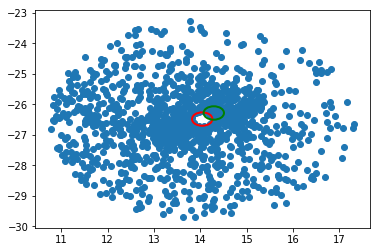

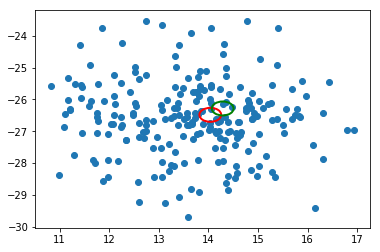

In [166]:
plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2])
circle = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='r', fill=False, lw=2)
plt.gca().add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85+0.25, coord_ra_dec.dec.deg+0.1+0.2), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=2)
plt.gca().add_artist(circle2)

plt.figure()
plt.scatter(ra_n_rand, dec_n_rand)
circle = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='r', fill=False, lw=2)
plt.gca().add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85+0.25, coord_ra_dec.dec.deg+0.1+0.2), GlobClust_Log_r_t[0]/60, color='g', fill=False, lw=2)
plt.gca().add_artist(circle2)

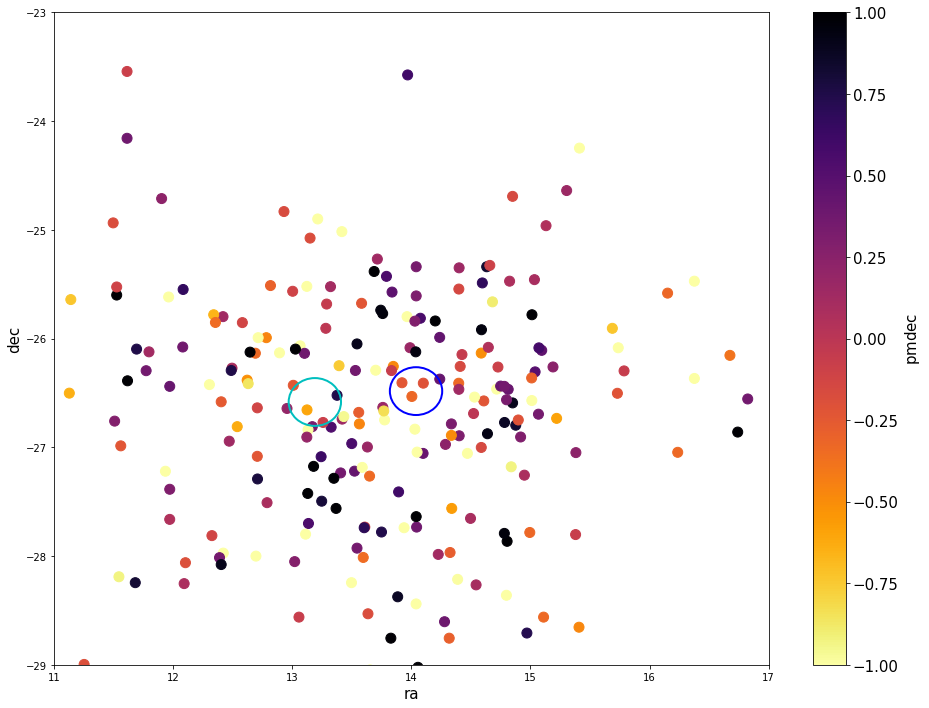

In [167]:
dec_n_rand=np.random.choice(dec_n[tidal_indx2], size=231)
ra_n_rand=np.random.choice(ra_n[tidal_indx2], size=231)
pmdec_n_rand=np.random.choice(pmdec_n[tidal_indx2], size=231)
pmra_n_rand=np.random.choice(pmra_n[tidal_indx2], size=231)
pmdec_n_norm_rand=np.random.choice(pmdec_n_norm[tidal_indx2], size=231)
pmra_n_norm_rand=np.random.choice(pmra_n_norm[tidal_indx2], size=231)

#dec_n_rand=np.random.choice(dec_n[tidal_indx_15], size=1758)
#ra_n_rand=np.random.choice(ra_n[tidal_indx_15], size=1758)
#pmdec_n_rand=np.random.choice(pmdec_n[tidal_indx_15], size=1758)
#pmra_n_rand=np.random.choice(pmra_n[tidal_indx_15], size=1758)
#pmdec_n_norm_rand=np.random.choice(pmdec_n_norm[tidal_indx_15], size=1758)
#pmra_n_norm_rand=np.random.choice(pmra_n_norm[tidal_indx_15], size=1758)

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n_rand, dec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r',marker ='o', s=100,
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
#plt.legend()
plt.show()

In [11]:
shape(bot_indx_n_rand)

NameError: name 'bot_indx_n_rand' is not defined

[[ 0.5        0.8660254]
 [-0.8660254  0.5      ]]


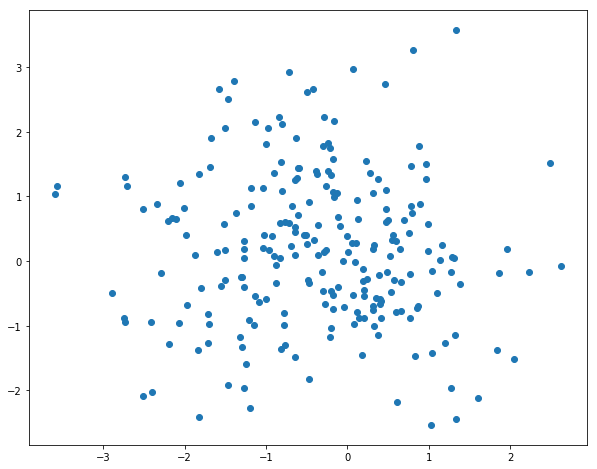

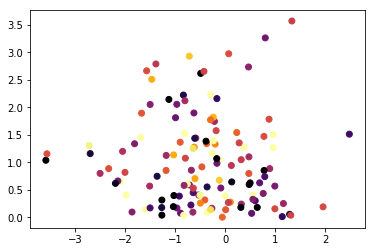

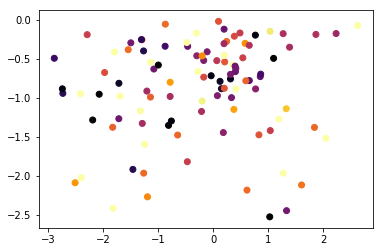

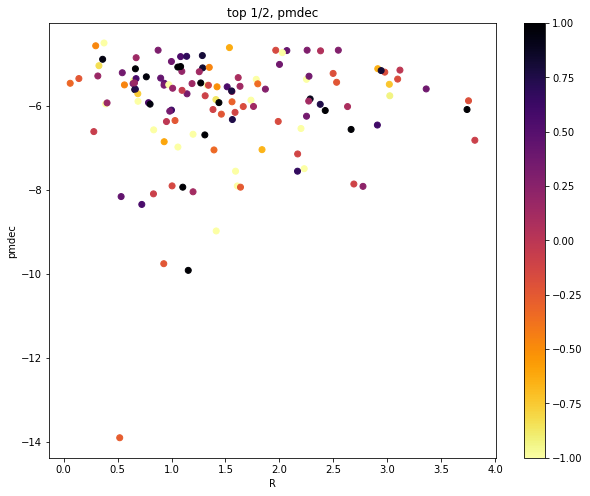

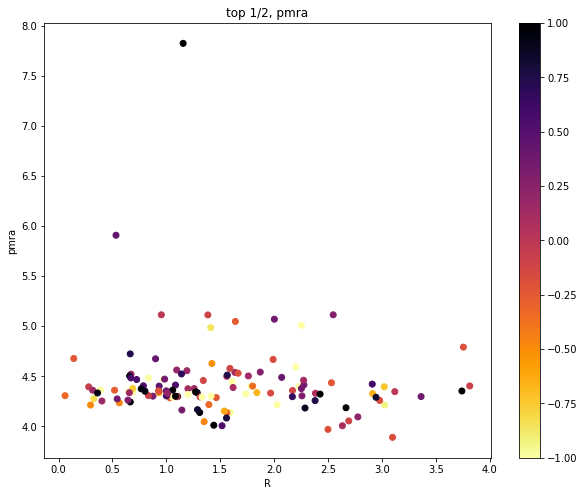

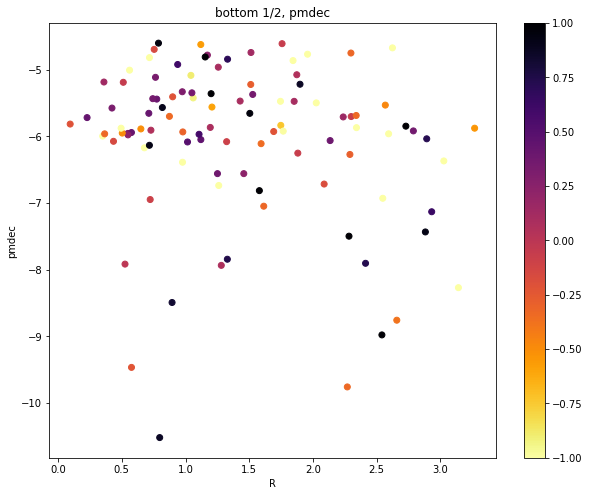

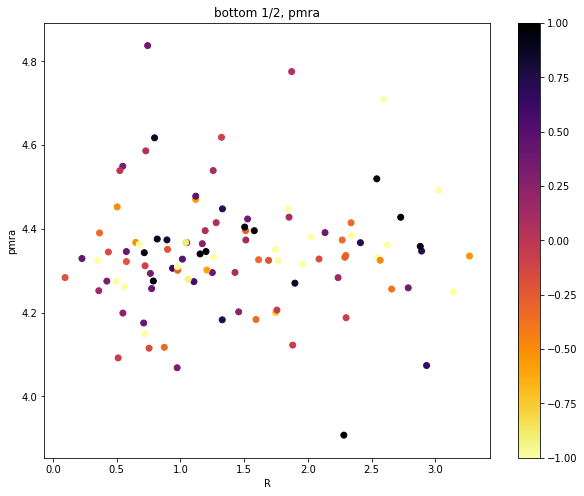

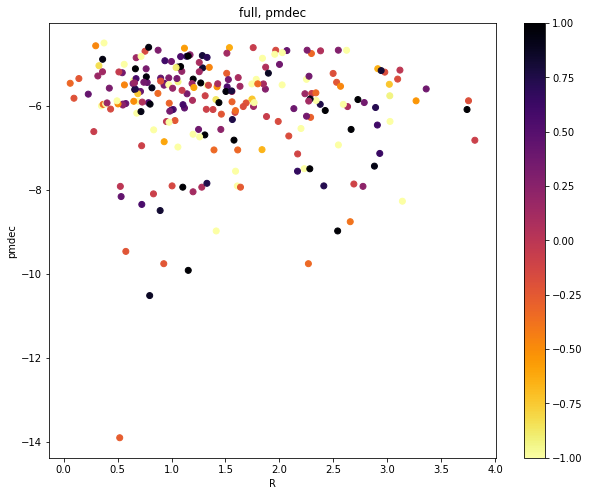

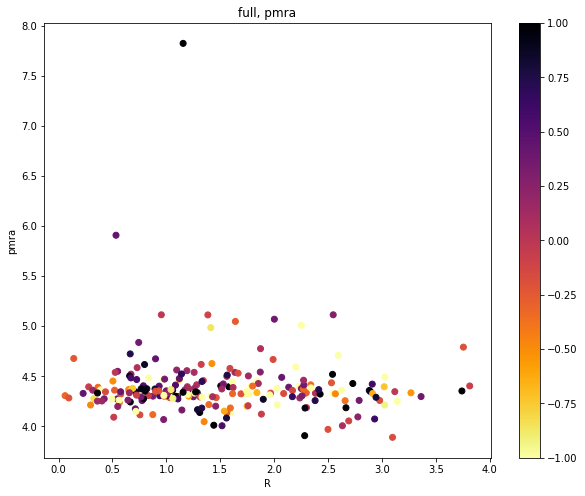

In [168]:
theta = np.radians(-60)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 

ra_dec = pd.DataFrame({'ra': ra_n_rand-coord_ra_dec.ra.deg-0.85, 'dec': dec_n_rand-coord_ra_dec.dec.deg-0.1})
shape(ra_dec)
ra_dec.T
ra_dec_rot_n_rand=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot_n_rand.loc[:,1], ra_dec_rot_n_rand.loc[:,0])

top_indx_n_rand = (ra_dec_rot_n_rand.loc[:,0] > 0)
bot_indx_n_rand = (ra_dec_rot_n_rand.loc[:,0] < 0)

fig=plt.figure()
plt.scatter(ra_dec_rot_n_rand.loc[:,1][top_indx_n_rand], ra_dec_rot_n_rand.loc[:,0][top_indx_n_rand], c=pmdec_n_norm_rand[top_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure()
plt.scatter(ra_dec_rot_n_rand.loc[:,1][bot_indx_n_rand], ra_dec_rot_n_rand.loc[:,0][bot_indx_n_rand], c=pmdec_n_norm_rand[bot_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)

R_clust_n_rand = np.sqrt((np.fabs(ra_dec_rot_n_rand.loc[:,0]))**2+(np.fabs(ra_dec_rot_n_rand.loc[:,1])**2))

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[top_indx_n_rand], pmdec_n_rand[top_indx_n_rand], c=pmdec_n_norm_rand[top_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[top_indx_n_rand], pmra_n_rand[top_indx_n_rand], c=pmdec_n_norm_rand[top_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[bot_indx_n_rand], pmdec_n_rand[bot_indx_n_rand], c=pmdec_n_norm_rand[bot_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[bot_indx_n_rand], pmra_n_rand[bot_indx_n_rand], c=pmdec_n_norm_rand[bot_indx_n_rand], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand, pmdec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand, pmra_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')




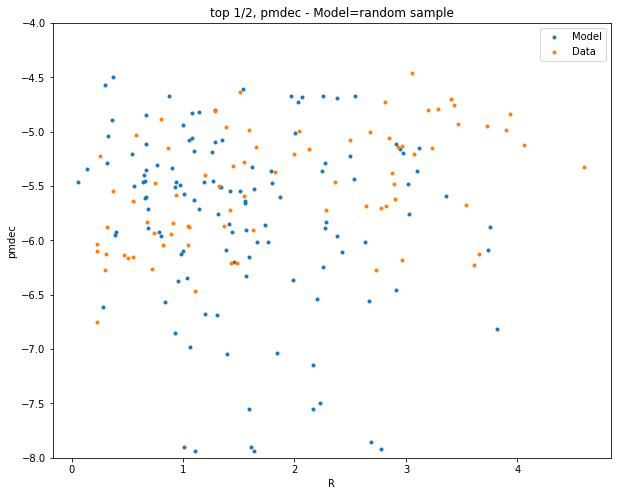

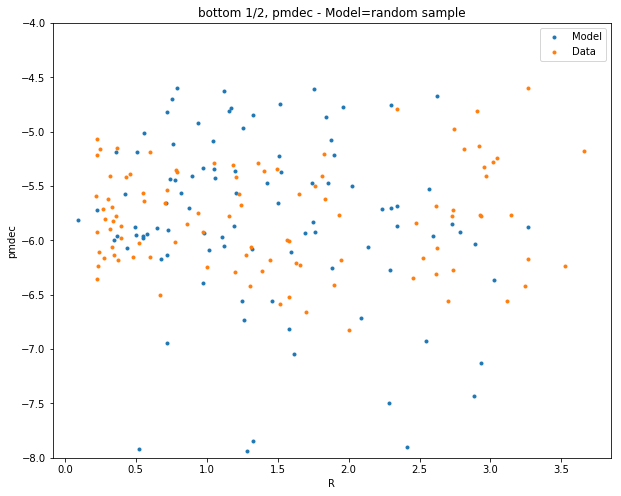

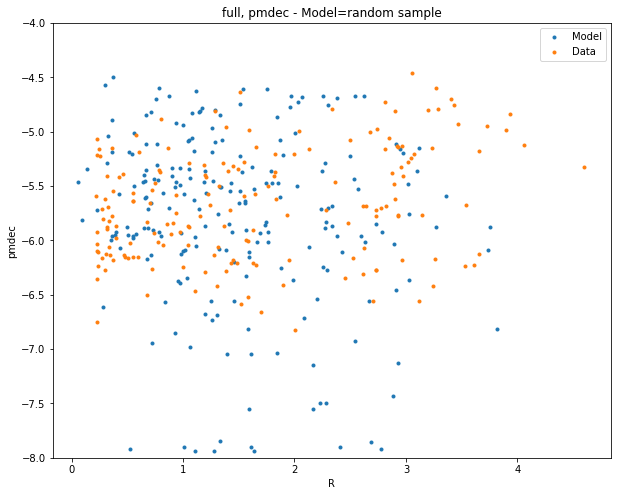

In [169]:


plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[top_indx_n_rand], pmdec_n_rand[top_indx_n_rand],label='Model', marker='.')
plt.scatter(R_clust_DB[top_indx_DB], pmdec_DB[clust_indx][top_indx_DB],label='Data', marker='.')
plt.title('top 1/2, pmdec - Model=random sample')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim=([])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand[bot_indx_n_rand], pmdec_n_rand[bot_indx_n_rand],label='Model', marker='.')
plt.scatter(R_clust_DB[bot_indx_DB], pmdec_DB[clust_indx][bot_indx_DB],label='Data', marker='.')
plt.title('bottom 1/2, pmdec - Model=random sample')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim=([])
plt.show()

plt.figure(figsize=(10,8))
plt.scatter(R_clust_n_rand, pmdec_n_rand,label='Model', marker='.')
plt.scatter(R_clust_DB, pmdec_DB[clust_indx],label='Data', marker='.')
plt.title('full, pmdec - Model=random sample')
plt.xlabel('R')
plt.ylabel('pmdec')
plt.legend()
plt.gca().set_ylim([-8,-4])
#plt.gca().set_xlim=([])
plt.show()

In [118]:
#pmra_n_norm_rand[top_indx_n_rand][bar_indx_n]
#shape(bar_indx_n2)

bar_indx_n2 = (ra_dec_rot_n_rand.loc[:,1] < 1.5) * (ra_dec_rot_n_rand.loc[:,1] > -1.5) *\
              (ra_dec_rot_n_rand.loc[:,0] < 0.75) * (ra_dec_rot_n_rand.loc[:,0] > -0.75)
bar_indx_n2 = [not i for i in bar_indx_n2]
print(shape(bar_indx_n2))
print(shape(ra_dec_rot_n_rand.loc[:,0]))

pmra_n_norm_rand[top_indx_n_rand][bar_indx_n2]

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

(231,)
(231,)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 125 but corresponding boolean dimension is 231

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

pmra_n_m: 0.04849141195989479 
 pmdec_n_m: -0.09444377509597296 
 pmra_n_m: -0.053011670144441574 
 pmdec_n_m: -0.17492808128131315 

 pmra_DB_m: pmra   -0.033751
dtype: float64 
 pmdec_DB_m: pmdec    0.316649
dtype: float64 
 pmra_DB_m: pmra   -0.002409
dtype: float64 
 pmdec_DB_m pmdec   -0.117824
dtype: float64


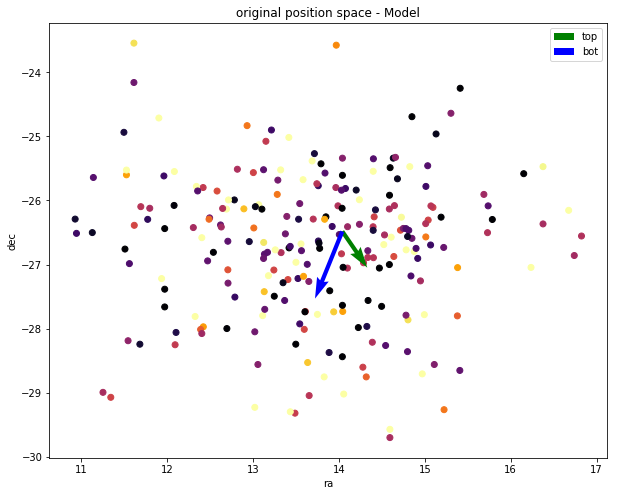

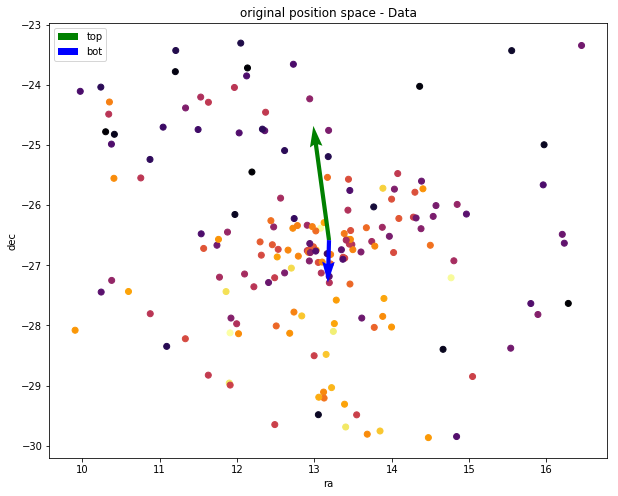

In [170]:
#===================
# Not Rotated
#===================

bar_indx_n2 = (ra_dec_rot_n_rand.loc[:,1] < 1.5) * (ra_dec_rot_n_rand.loc[:,1] > -1.5) *\
              (ra_dec_rot_n_rand.loc[:,0] < 0.75) * (ra_dec_rot_n_rand.loc[:,0] > -0.75)
bar_indx_n2 = [not i for i in bar_indx_n2]


pmra_n_norm_rand = pmra_n_rand-pmra_n[tidal_indx2].mean()
pmdec_n_norm_rand = pmdec_n_rand-pmdec_n[tidal_indx2].mean()

top_indx_n_rand2 = (ra_dec_rot_n_rand.loc[:,0][bar_indx_n2] > 0)
bot_indx_n_rand2 = (ra_dec_rot_n_rand.loc[:,0][bar_indx_n2] < 0)

pmra_n_mtop_rand = pmra_n_norm_rand[bar_indx_n2][top_indx_n_rand2].mean()
pmdec_n_mtop_rand = pmdec_n_norm_rand[bar_indx_n2][top_indx_n_rand2].mean()
pmra_n_mbot_rand = pmra_n_norm_rand[bar_indx_n2][bot_indx_n_rand2].mean()
pmdec_n_mbot_rand = pmdec_n_norm_rand[bar_indx_n2][bot_indx_n_rand2].mean()

#pmra_n_mtop = pmra_n_norm[tidal_indx2][top_indx_n].mean()
#pmdec_n_mtop = pmdec_n_norm[tidal_indx2][top_indx_n].mean()
#pmra_n_mbot = pmra_n_norm[tidal_indx2][bot_indx_n].mean()
#pmdec_n_mbot = pmdec_n_norm[tidal_indx2][bot_indx_n].mean()


#pm_table = pd.DataFrame({})
print('pmra_n_m:', pmra_n_mtop_rand, '\n pmdec_n_m:', pmdec_n_mtop_rand, '\n pmra_n_m:', pmra_n_mbot_rand, '\n pmdec_n_m:', pmdec_n_mbot_rand, 
      '\n\n pmra_DB_m:', pmra_DB_mtop, '\n pmdec_DB_m:', pmdec_DB_mtop, '\n pmra_DB_m:', pmra_DB_mbot, '\n pmdec_DB_m', pmdec_DB_mbot)

fig=plt.figure(figsize=(10,8))
plt.scatter(ra_n_rand, dec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_mtop_rand, pmdec_n_mtop_rand, color='g'#, pmdec_n_mtop, cmap='magma_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=1, label='top')
plt.quiver(coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1, pmra_n_mbot_rand, pmdec_n_mbot_rand, color='b'#, pmdec_n_mbot, cmap='magma_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=2, label='bot')
#plt.colorbar()
plt.legend()
plt.title('original position space - Model')
plt.ylabel('dec')
plt.xlabel('ra')


fig=plt.figure(figsize=(10,8))
plt.scatter(ra_DB[clust_indx], dec_DB[clust_indx], c=pmdec_DB_norm[clust_indx], cmap='inferno_r', vmin=-1, vmax=1, zorder=0)
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_mtop, pmdec_DB_mtop#, pmdec_DB_mtop, cmap='inferno_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=1, label='top', color='g')
plt.quiver(coord_ra_dec.ra.deg, coord_ra_dec.dec.deg, pmra_DB_mbot, pmdec_DB_mbot#, pmdec_DB_mbot, cmap='inferno_r', 
           ,angles='xy', scale_units='xy', scale=1/6., zorder=2, label='bot', color='b')
#plt.colorbar()
plt.legend()
plt.title('original position space - Data')
plt.ylabel('dec')
plt.xlabel('ra')

In [14]:
from scipy.stats import ttest_ind

data1 = ra_DB
data2 = ra_n

stat, p = ttest_ind(data1, data2)

alpha = 0.05
if p > alpha:
    print('Same distributions (fail to reject H0)')
else:
    print('Different distributions (reject H0)')

Different distributions (reject H0)


In [15]:
print(stat,p)

[-41.79744491] [0.]


In [16]:
from scipy import stats
from scipy.stats import norm
import scipy

stat, p = stats.ttest_ind(pmdec_DB[clust_indx], pmdec_n_rand)
print('Statistics=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Same distributions (fail to reject H0)')
else:
    print('Different distributions (reject H0)')

    
stats.ttest_rel(pmdec_DB[clust_indx], pmdec_n_rand)
print('Statistics=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Same distributions (fail to reject H0)')
else:
    print('Different distributions (reject H0)')

Statistics=3.430, p=0.001
Different distributions (reject H0)
Statistics=3.430, p=0.001
Different distributions (reject H0)


In [17]:
shape(pmdec_DB[clust_indx])
#shape(pmdec_n_rand)

(231, 1)

In [18]:
stat, p = stats.mannwhitneyu(pmdec_DB[clust_indx].as_matrix()[:,0], pmdec_n_rand)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=24194.000, p=0.042
Different distribution (reject H0)


In [19]:
print('Skew=', scipy.stats.skew(pmdec_DB))
print('Kurtosis=', scipy.stats.kurtosis(pmdec_DB), '\n')
print('Description=', scipy.stats.describe(pmdec_DB, axis=0), '\n')
print('SkewTest=', scipy.stats.skewtest(pmdec_DB))
print('KurtosisTest=', scipy.stats.kurtosistest(pmdec_DB))
print('Mean=', mean(pmdec_DB))

print('Skew=', scipy.stats.skew(pmdec_n))
print('Kurtosis=', scipy.stats.kurtosis(pmdec_n), '\n')
print('Description=', scipy.stats.describe(pmdec_n, axis=0), '\n')
print('SkewTest=', scipy.stats.skewtest(pmdec_n))
print('KurtosisTest=', scipy.stats.kurtosistest(pmdec_n))
print('Mean=', mean(pmdec_n))

Skew= [-0.06612182]
Kurtosis= [0.22182407] 

Description= DescribeResult(nobs=1758, minmax=(array([-6.97676818]), array([-4.20693153])), mean=array([-5.69273074]), variance=array([0.17126233]), skewness=array([-0.06612182]), kurtosis=array([0.22182407])) 

SkewTest= SkewtestResult(statistic=array([-1.13537994]), pvalue=array([0.25621616]))
KurtosisTest= KurtosistestResult(statistic=array([1.81091852]), pvalue=array([0.07015347]))
Mean= pmdec   -5.692731
dtype: float64
Skew= -3.1016088141865708
Kurtosis= 51.1634271489074 

Description= DescribeResult(nobs=18600, minmax=(-116.010289, 46.090095), mean=-5.796111959354839, variance=18.927931998514705, skewness=-3.1016088141865708, kurtosis=51.1634271489074) 

SkewTest= SkewtestResult(statistic=-93.02001697922132, pvalue=0.0)
KurtosisTest= KurtosistestResult(statistic=78.78528567327662, pvalue=0.0)
Mean= -5.796111959354839


1758 1758
(1758,)


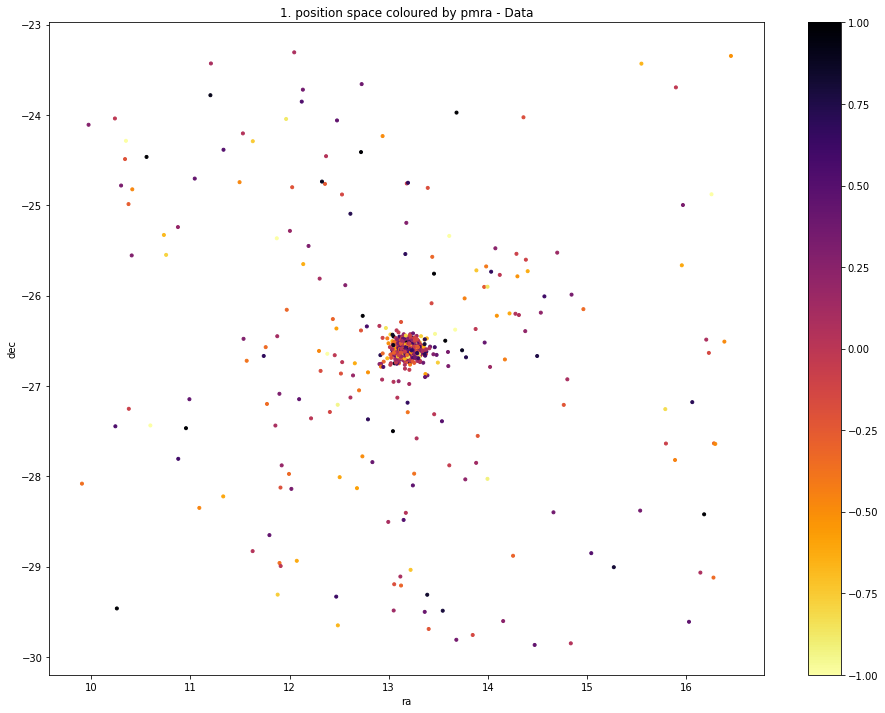

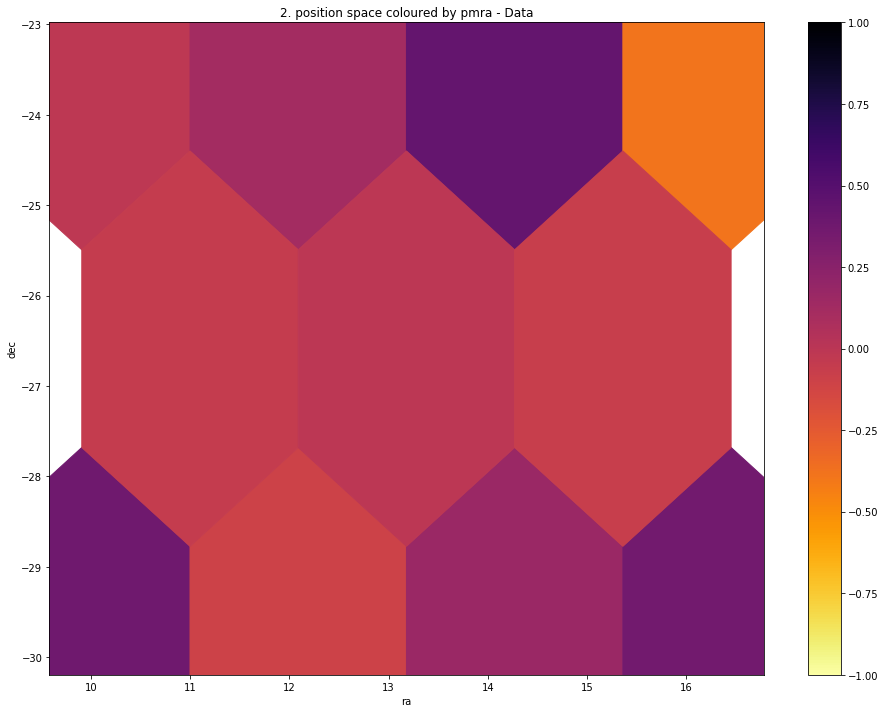

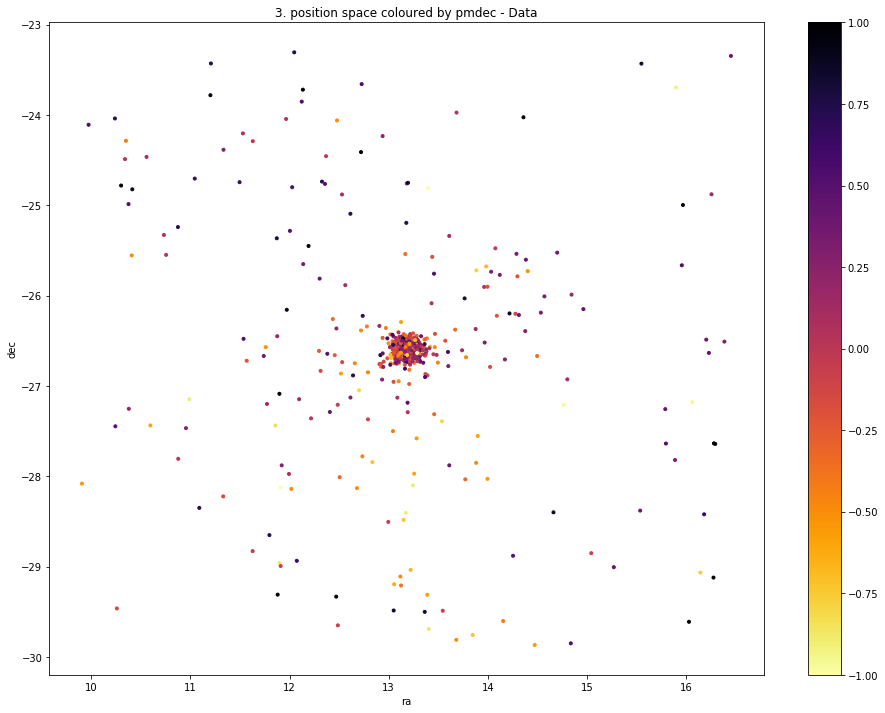

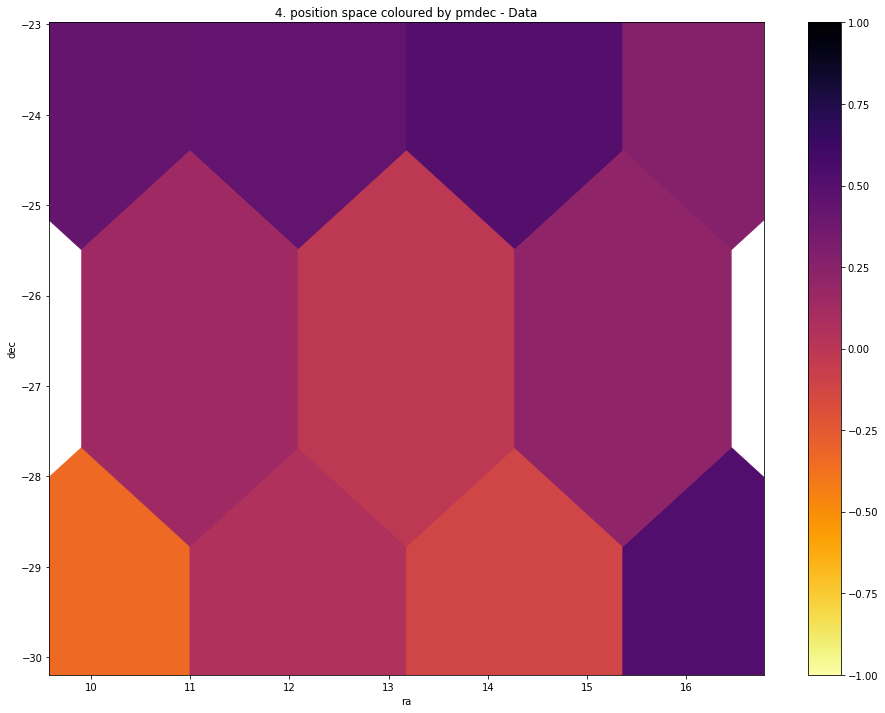

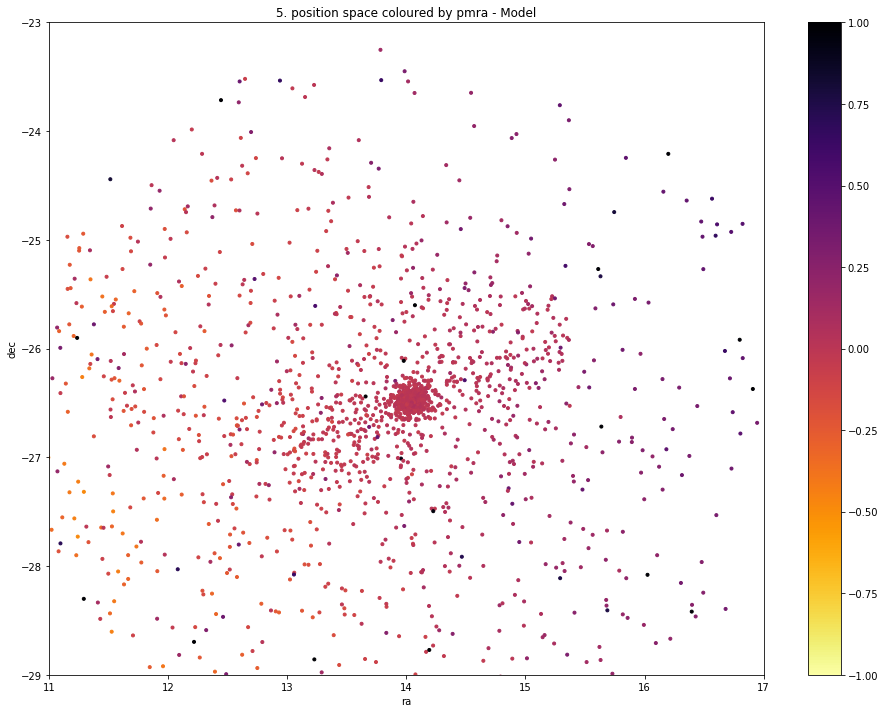

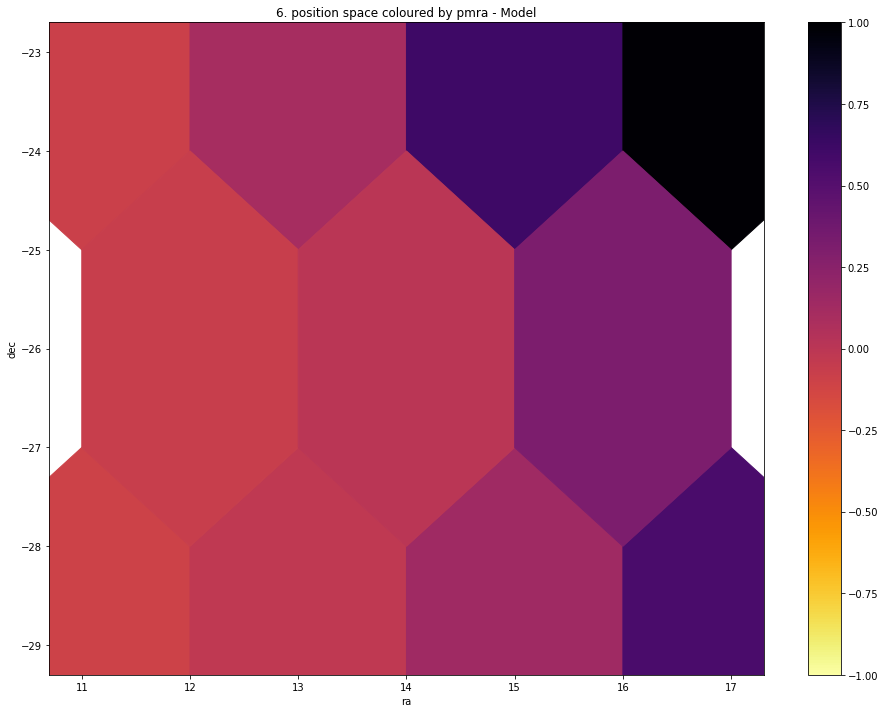

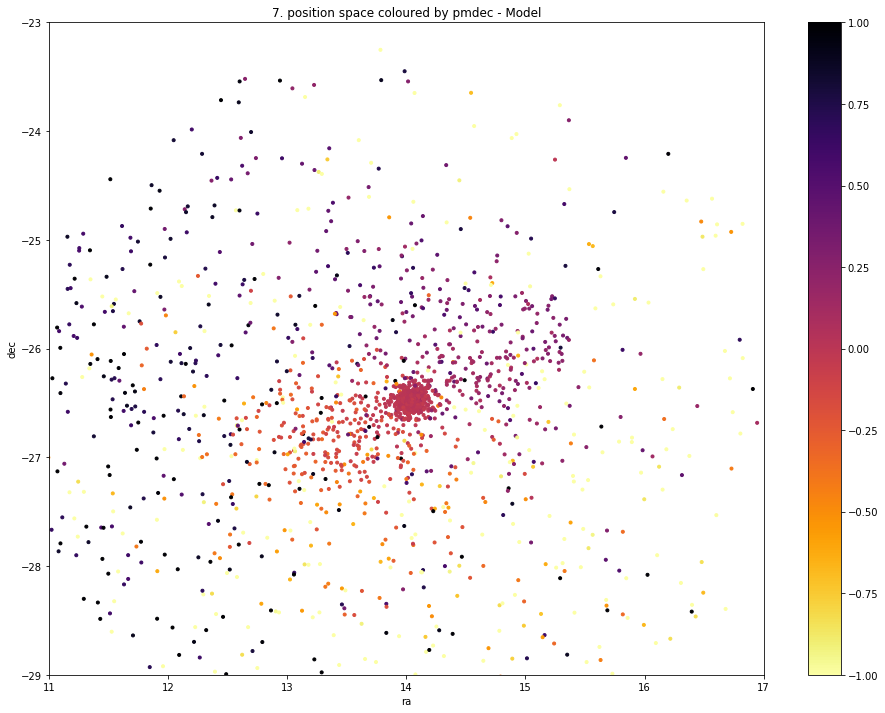

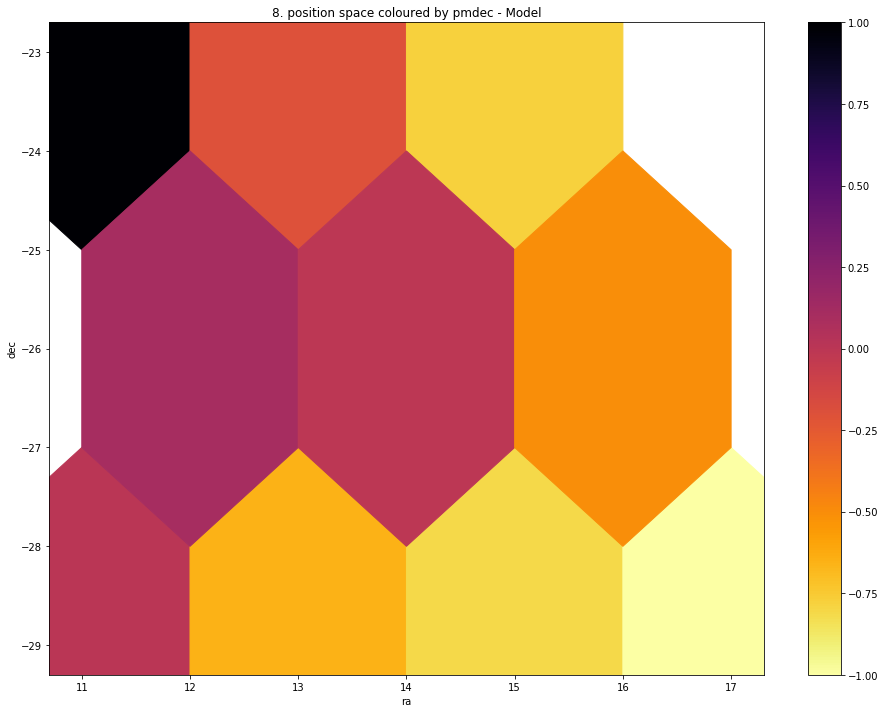

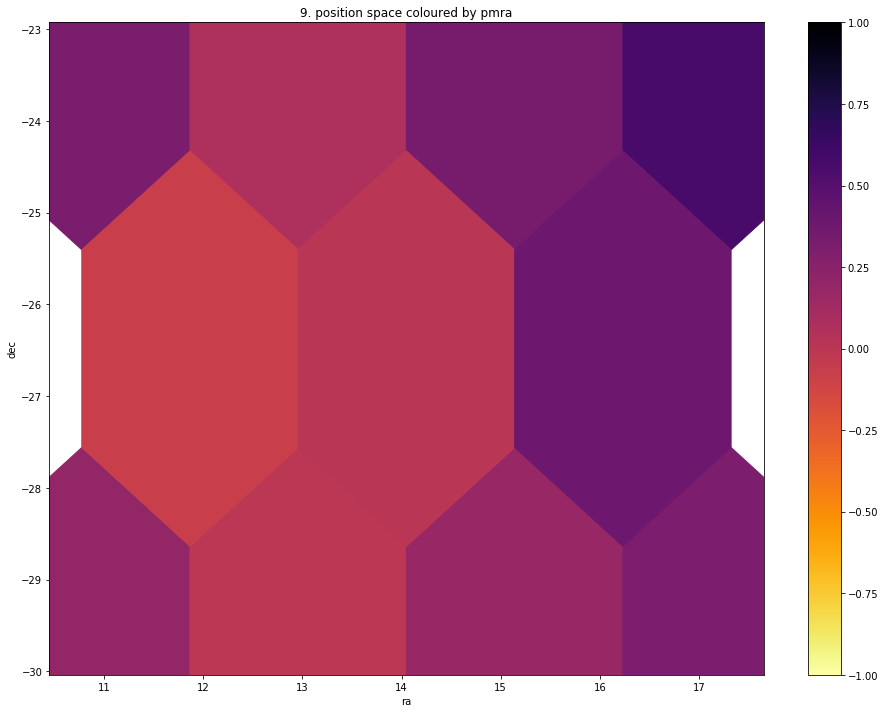

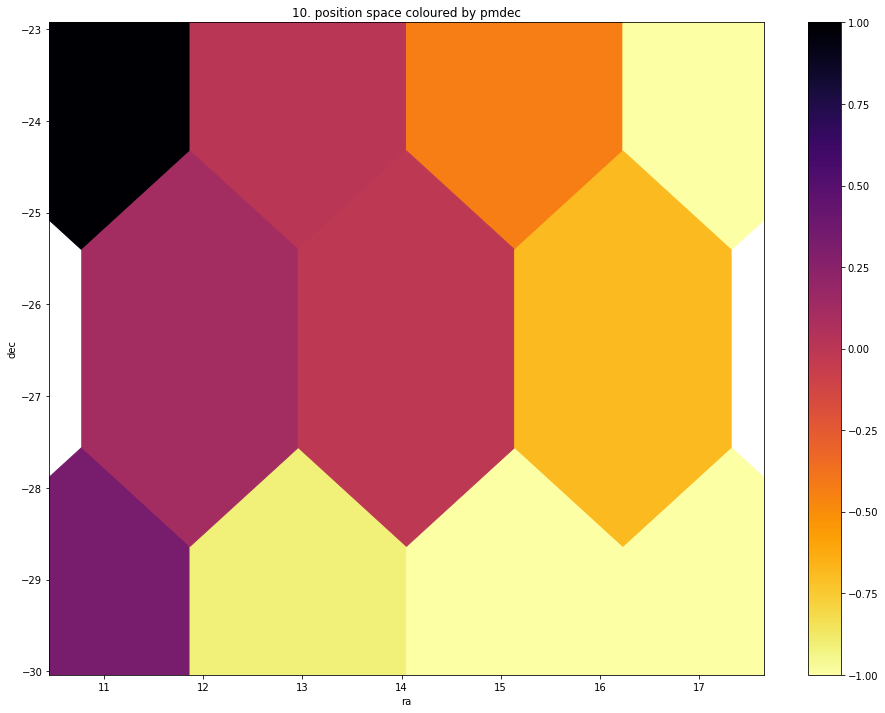

In [19]:
x=ra_DB[~numpy.isnan(ra_DB)]
y=dec_DB[~numpy.isnan(dec_DB)]
x=np.array(x)
y=np.array(y)
print(len(x),len(y))
print(x[:,0].shape)

grid = 3

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.scatter(x[:,0], y[:,0], c=pmra_DB_norm, cmap='inferno_r', vmin=-1,vmax=1, marker='.')#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('1. position space coloured by pmra - Data')
plt.ylabel("dec")
plt.xlabel("ra")

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(x[:,0], y[:,0], C=pmra_DB_norm, cmap='inferno_r', gridsize=grid,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('2. position space coloured by pmra - Data')
plt.ylabel("dec")
plt.xlabel("ra")

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.scatter(x[:,0], y[:,0], c=pmdec_DB_norm, cmap='inferno_r', vmin=-1,vmax=1, marker='.')#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('3. position space coloured by pmdec - Data')
plt.ylabel("dec")
plt.xlabel("ra")

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(x[:,0], y[:,0], C=pmdec_DB_norm, cmap='inferno_r', gridsize=grid,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('4. position space coloured by pmdec - Data')
plt.ylabel("dec")
plt.xlabel("ra")




#x=ra_n[tidal_indx_15][~numpy.isnan(ra_n[tidal_indx_15])]
#y=dec_n[tidal_indx_15][~numpy.isnan(dec_n[tidal_indx_15])]
#x=np.array(x)
#y=np.array(y)
#print(len(x),len(y))
#print(x.shape)

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.scatter(ra_n[tidal_indx_15], dec_n[tidal_indx_15], c=pmra_n_norm[tidal_indx_15], cmap='inferno_r',vmin=-1,vmax=1,marker='.')
plt.colorbar()
plt.title('5. position space coloured by pmra - Model')
plt.ylabel("dec")
plt.xlabel("ra")
plt.gca().set_xlim([11,17])
plt.gca().set_ylim([-29, -23])

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(ra_n, dec_n, C=pmra_n_norm, cmap='inferno_r', gridsize=grid,vmin=-1,vmax=1, extent=[11,17,  -29,-23])
plt.colorbar()
plt.title('6. position space coloured by pmra - Model')
plt.ylabel("dec")
plt.xlabel("ra")

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.scatter(ra_n[tidal_indx_15], dec_n[tidal_indx_15], c=pmdec_n_norm[tidal_indx_15], cmap='inferno_r',vmin=-1,vmax=1,marker='.')
plt.colorbar()
plt.title('7. position space coloured by pmdec - Model')
plt.ylabel("dec")
plt.xlabel("ra")
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(ra_n[tidal_indx_15], dec_n[tidal_indx_15], C=pmdec_n_norm[tidal_indx_15], cmap='inferno_r', gridsize=grid,
           vmin=-1,vmax=1, extent=[11,17,  -29,-23])
plt.colorbar()
plt.title('8. position space coloured by pmdec - Model')
plt.ylabel("dec")
plt.xlabel("ra")


fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(ra_n[tidal_indx_15], dec_n[tidal_indx_15], C=pmra_n_norm[tidal_indx_15], cmap='inferno_r', gridsize=grid,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('9. position space coloured by pmra - Model')
plt.ylabel("dec")
plt.xlabel("ra")

fig=plt.figure(figsize=(16,12))
# normal distribution center at x=0 and y=5
plt.hexbin(ra_n[tidal_indx_15], dec_n[tidal_indx_15], C=pmdec_n_norm[tidal_indx_15], cmap='inferno_r', gridsize=grid,vmin=-1,vmax=1)#, extent=[11,17,  -23,-29])
plt.colorbar()
plt.title('10. position space coloured by pmdec - Model')
plt.ylabel("dec")
plt.xlabel("ra")


In [91]:
shape(dec_n[tidal_square])
tidal_square.sum()
#r_t/60

fabs(ra_n-coord_ra_dec.ra.deg-0.85) < GlobClust_Log_r_t[0]/60*15 

ra_n

0          6.975490
1        251.449024
2         14.034576
3         14.164594
4        343.322312
5        293.037474
6          8.379526
7        255.393973
8        345.320124
9        319.361818
10        14.037830
11       335.056334
12       331.486420
13         8.289731
14        11.627390
15        14.043923
16         8.976928
17        60.595929
18        14.049794
19        13.985055
20         6.026676
21       310.291914
22       287.447034
23       230.182479
24        14.057646
25        13.995255
26       352.238271
27         6.559970
28       268.541817
29       291.417736
            ...    
18570     14.044396
18571    312.922198
18572     15.140073
18573    255.322542
18574     14.038887
18575    242.603038
18576     13.068336
18577     19.978892
18578    302.112874
18579     14.006170
18580      4.508661
18581    357.436300
18582     14.021298
18583    235.428642
18584    353.705386
18585    268.237003
18586    334.532325
18587     14.050710
18588     12.248326


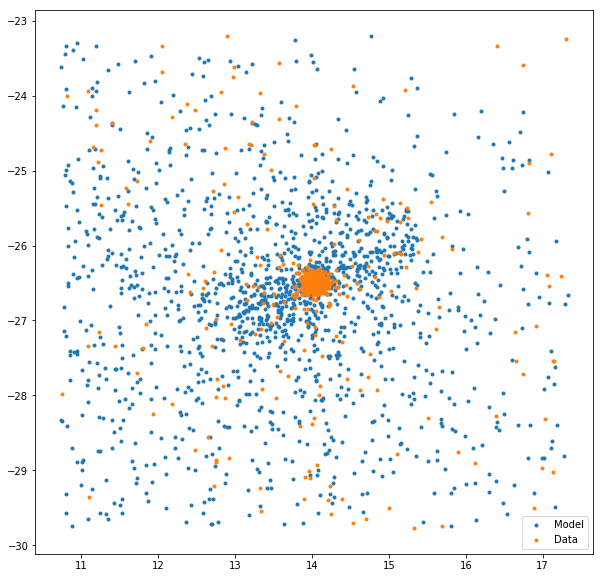

In [101]:
tidal_square = (np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85) < GlobClust_Log_r_t[0]/60*15) *\
                (np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1) < GlobClust_Log_r_t[0]/60*15)

plt.figure(figsize=(10,10))
plt.scatter(ra_n[tidal_square], dec_n[tidal_square], label='Model', marker='.')# c=pmdec_n_norm[tidal_indx], cmap='inferno_r', vmin=-1, vmax=1)
#plt.scatter(ra_n[tidal_indx_15], dec_n[tidal_indx_15], label='Model', marker='.')# c=pmdec_n_norm[tidal_indx], cmap='inferno_r', vmin=-1, vmax=1)
plt.scatter(ra_DB+0.85, dec_DB+0.1, label='Data', marker='.')# c=pmdec_DB_norm, cmap='inferno_r', vmin=-1, vmax=1)
#plt.gca().set_ylim([-30,-23])
#plt.gca().set_xlim([10,18])
plt.legend()